<a href="https://colab.research.google.com/github/ngocknguyen/Airborne-Epidemics-Insights-from-Simulation-Models/blob/main/Airborne-Epidemics-Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy import stats
from scipy.stats import chi2_contingency
import requests
import json

CDC Flu Burden estimates are a primary source for our data for this simulation. Flu Burden is inclusive of symptomatic illnesses, medical visits, hospitalizations, and deaths. [This CDC webpage ](https://www.cdc.gov/flu/about/burden/index.html) provides a deeper explanation of Flu Burden and the purpose for estimating it. [This CDC Flu Burden presentation](https://www.cdc.gov/flu/images/about/burden/Disease_Burden_Web_Slides.pptx) provides burden estimates for 12 years, which we used to develop our burden_df dataframe.

In [ ]:
burden_data = {
    "Season": ["2010-2011", "2011-2012", "2012-2013", "2013-2014", "2014-2015", "2015-2016", "2016-2017", "2017-2018", "2018-2019", "2019-2020", "2021-2022", "2022-2023"],
    "Symptomatic Illnesses": [21000000, 9300000, 33000000, 29000000, 30000000, 23000000, 29000000, 41000000, 28000000, 35000000, 9400000, 31000000],
    "Symptomatic Illnesses 95% UI": ["(16,000,000 – 46,000,000)", "(8,600,000 – 12,000,000)", "(26,000,000 – 66,000,000)", "(24,000,000 – 41,000,000)", "(26,000,000 – 39,000,000)", "(19,000,000 – 32,000,000)", "(24,000,000 – 44,000,000)", "(35,000,000 – 53,000,000)", "(24,000,000 – 40,000,000)", "(28,000,000 – 70,000,000)", "(7,800,000 – 15,000,000)", "(26,000,000 – 51,000,000)"],
    "Medical Visits": [10000000, 4300000, 15000000, 13000000, 14000000, 10000000, 13000000, 18000000, 13000000, 16000000, 4300000, 14000000],
    "Medical Visits 95% UI": ["(7,900,000 – 21,000,000)", "(4,000,000 – 5,600,000)", "(12,000,000 – 30,000,000)", "(12,000,000 – 15,000,000)", "(11,000,000 – 18,000,000)", "(9,000,000 – 14,000,000)", "(11,000,000 – 22,000,000)", "(16,000,000 – 24,000,000)", "(11,000,000 – 18,000,000)", "(13,000,000  – 30,000,000)", "(3,600,000 – 7,200,000)", "(12,000,000 – 24,000,000)"],
    "Hospitalizations": [280000, 130000, 570000, 340000, 590000, 270000, 490000, 710000, 370000, 390000, 100000, 360000],
    "Hospitalizations 95% UI": ["(190,000 – 1,000,000)", "(120,000 – 180,000)", "(360,000 – 1,800,000)", "(260,000 – 640,000)", "(410,000 – 1,100,000)", "(210,000 – 480,000)", "(370,000 – 830,000)", "(560,000 – 1,100,000)", "(300,000 – 660,000)", "(310,000 – 720,000)", "(83,000 – 180,000)", "(290,000 – 670,000)"],
    "Deaths": [36000, 12000, 42000, 37000, 51000, 22000, 38000, 51000, 27000, 25000, 4900, 21000],
    "Deaths 95% UI": ["(21,000 – 140,000)", "(10,000 – 23,000)", "(25,000 – 110,000)", "(23,000 – 100,000)", "(34,000 – 100,000)", "(17,000 – 35,000)", "(28,000 – 60,000)", "(36,000 – 95,000)", "(19,000 – 96,000)", "(18,000  – 78,000)", "(4,000 – 24,000)", "(18,000 - 97,000)"]
}

burden_df = pd.DataFrame(burden_data)

# Extract numerical values from confidence intervals
def extract_numerical_values(interval):
    match = re.findall(r'\d+', interval.replace(',', ''))
    return int(match[0]), int(match[1])

for col in burden_df.columns:
    if "95% UI" in col:
        burden_df[f"{col} Lower"], burden_df[f"{col} Upper"] = zip(*burden_df[col].apply(extract_numerical_values))
        burden_df.drop(columns=[col], inplace=True)

# Reorder columns
ordered_columns = [
    "Season",
    "Symptomatic Illnesses",
    "Symptomatic Illnesses 95% UI Lower",
    "Symptomatic Illnesses 95% UI Upper",
    "Medical Visits",
    "Medical Visits 95% UI Lower",
    "Medical Visits 95% UI Upper",
    "Hospitalizations",
    "Hospitalizations 95% UI Lower",
    "Hospitalizations 95% UI Upper",
    "Deaths",
    "Deaths 95% UI Lower",
    "Deaths 95% UI Upper"
]
# Reorder df with new column order
burden_df = burden_df[ordered_columns]

# Preview df
burden_df.head()

,Season,Symptomatic Illnesses,Symptomatic Illnesses 95% UI Lower,Symptomatic Illnesses 95% UI Upper,Medical Visits,Medical Visits 95% UI Lower,Medical Visits 95% UI Upper,Hospitalizations,Hospitalizations 95% UI Lower,Hospitalizations 95% UI Upper,Deaths,Deaths 95% UI Lower,Deaths 95% UI Upper
0,2010-2011,21000000,16000000,46000000,10000000,7900000,21000000,280000,190000,1000000,36000,21000,140000
1,2011-2012,9300000,8600000,12000000,4300000,4000000,5600000,130000,120000,180000,12000,10000,23000
2,2012-2013,33000000,26000000,66000000,15000000,12000000,30000000,570000,360000,1800000,42000,25000,110000
3,2013-2014,29000000,24000000,41000000,13000000,12000000,15000000,340000,260000,640000,37000,23000,100000
4,2014-2015,30000000,26000000,39000000,14000000,11000000,18000000,590000,410000,1100000,51000,34000,100000


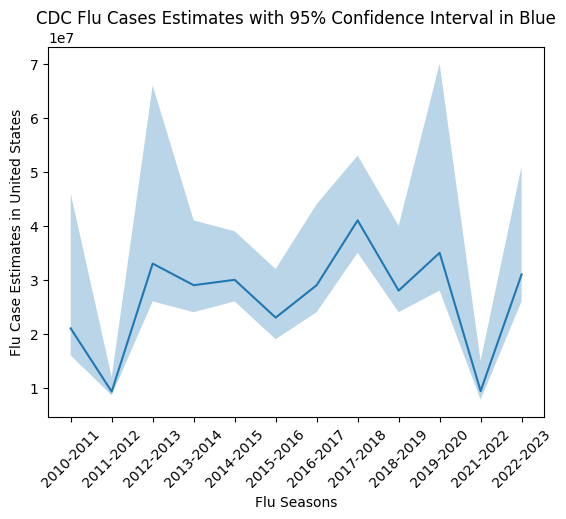

In [ ]:
# @title Symptomatic Illnesses Trend with Uncertainty

import matplotlib.pyplot as plt

plt.plot(burden_df['Season'], burden_df['Symptomatic Illnesses'])
plt.fill_between(burden_df['Season'], burden_df['Symptomatic Illnesses 95% UI Lower'], burden_df['Symptomatic Illnesses 95% UI Upper'], alpha=0.3)
plt.xlabel('Flu Seasons')
plt.ylabel('Flu Case Estimates in United States')
plt.title('CDC Flu Cases Estimates with 95% Confidence Interval in Blue')
plt.xticks(rotation=45)
_ = plt.xticks(rotation=45)

We now add US population data from the US Census. This data will be needed to develop rates per Burden figure, such as Symptomatic Illness, Hospitalization, and Death.

In [ ]:
# Load US Census population data
population_2010_2019_url = "https://www2.census.gov/programs-surveys/popest/datasets/2010-2019/national/totals/nst-est2019-alldata.csv"
population_2020_2022_url = "https://www2.census.gov/programs-surveys/popest/datasets/2020-2022/state/totals/NST-EST2022-ALLDATA.csv"

# Convert to pd df format
population_2010_2019 = pd.read_csv(population_2010_2019_url)
population_2020_2022 = pd.read_csv(population_2020_2022_url)

# Filter for US national population data
population_2010_2019_us = population_2010_2019[population_2010_2019['SUMLEV'] == 10]
population_2020_2022_us = population_2020_2022[population_2020_2022['SUMLEV'] == 10]

# Get relevant columns
population_2010_2019_us = population_2010_2019_us[['POPESTIMATE2010', 'POPESTIMATE2011', 'POPESTIMATE2012', 'POPESTIMATE2013', 'POPESTIMATE2014', 'POPESTIMATE2015', 'POPESTIMATE2016', 'POPESTIMATE2017', 'POPESTIMATE2018', 'POPESTIMATE2019']]
population_2020_2022_us = population_2020_2022_us[['POPESTIMATE2020', 'POPESTIMATE2021', 'POPESTIMATE2022']]

# Rename columns to common format
population_2010_2019_us.columns = [str(year) for year in range(2010, 2020)]
population_2020_2022_us.columns = [str(year) for year in range(2020, 2023)]

# Combine dfs
population_df = pd.concat([population_2010_2019_us, population_2020_2022_us], axis=1).melt(var_name='Year', value_name='US Population')

# Convert Year to integer
population_df['Year'] = population_df['Year'].astype(int)

population_df.head()

,Year,US Population
0,2010,309321666
1,2011,311556874
2,2012,313830990
3,2013,315993715
4,2014,318301008


We merge the population and burden data together. We use a season to year mapping as flu seasons crossover 2 years. We map the season the year it began.

In [ ]:
# Let's merge the data

# Mapping years to flu seasons
season_to_year = {
    "2010-2011": 2010,
    "2011-2012": 2011,
    "2012-2013": 2012,
    "2013-2014": 2013,
    "2014-2015": 2014,
    "2015-2016": 2015,
    "2016-2017": 2016,
    "2017-2018": 2017,
    "2018-2019": 2018,
    "2019-2020": 2019,
    "2021-2022": 2021,
    "2022-2023": 2022
}

# Add 'Year' column to flu burden df based on mapping
burden_df["Year"] = burden_df["Season"].map(season_to_year)

# Merge the two dfs on 'Year'
merged_df = pd.merge(burden_df, population_df, left_on="Year", right_on="Year", how="left")

merged_df.head()


,Season,Symptomatic Illnesses,Symptomatic Illnesses 95% UI Lower,Symptomatic Illnesses 95% UI Upper,Medical Visits,Medical Visits 95% UI Lower,Medical Visits 95% UI Upper,Hospitalizations,Hospitalizations 95% UI Lower,Hospitalizations 95% UI Upper,Deaths,Deaths 95% UI Lower,Deaths 95% UI Upper,Year,US Population
0,2010-2011,21000000,16000000,46000000,10000000,7900000,21000000,280000,190000,1000000,36000,21000,140000,2010,309321666
1,2011-2012,9300000,8600000,12000000,4300000,4000000,5600000,130000,120000,180000,12000,10000,23000,2011,311556874
2,2012-2013,33000000,26000000,66000000,15000000,12000000,30000000,570000,360000,1800000,42000,25000,110000,2012,313830990
3,2013-2014,29000000,24000000,41000000,13000000,12000000,15000000,340000,260000,640000,37000,23000,100000,2013,315993715
4,2014-2015,30000000,26000000,39000000,14000000,11000000,18000000,590000,410000,1100000,51000,34000,100000,2014,318301008



Next, we calculate overall flu burden estimates by considering confidence interval ranges over multiple years using weighted averages based on the US population size. We calculates the rates of Medical Visits, Hospitalizations, and Deaths as percentages of Symptomatic Illnesses to obtain measures of flu severity and healthcare impact.

The resulting dataframe includes overall estimates and rates, rounded to two decimal places, making it ready for epidemiological simulations and models such as SIR and SEIR which we will explore as preliminary steps to more complex simulations.

In [ ]:
# Calculate weighted mean for each column
def weighted_mean(df, value_col, weight_col):
    return (df[value_col] * df[weight_col]).sum() / df[weight_col].sum()

# Calculate weighted rate
def weighted_rate(df, numerator_col, denominator_col, weight_col):
    rates = df[numerator_col] / df[denominator_col]
    return (rates * df[weight_col]).sum() / df[weight_col].sum()

# Columns for estimates and their confidence intervals
estimate_columns = [
    "Symptomatic Illnesses",
    "Symptomatic Illnesses 95% UI Lower",
    "Symptomatic Illnesses 95% UI Upper",
    "Medical Visits",
    "Medical Visits 95% UI Lower",
    "Medical Visits 95% UI Upper",
    "Hospitalizations",
    "Hospitalizations 95% UI Lower",
    "Hospitalizations 95% UI Upper",
    "Deaths",
    "Deaths 95% UI Lower",
    "Deaths 95% UI Upper"
]

# Calculate weighted means for estimates and confidence intervals
weighted_means = {col: weighted_mean(merged_df, col, "US Population") for col in estimate_columns}

# Calculate rates
overall_rates = {
    "Symptomatic Illnesses Rate": (weighted_means["Symptomatic Illnesses"] / merged_df["US Population"].sum()) * 100,
    "Medical Visits Rate": weighted_rate(merged_df, "Medical Visits", "Symptomatic Illnesses", "US Population") * 100,
    "Hospitalizations Rate": weighted_rate(merged_df, "Hospitalizations", "Symptomatic Illnesses", "US Population") * 100,
    "Deaths Rate": weighted_rate(merged_df, "Deaths", "Symptomatic Illnesses", "US Population") * 100,
}

# Calculate confidence interval rates
ci_rates = {
    "Symptomatic Illnesses 95% UI Lower Rate": (weighted_means["Symptomatic Illnesses 95% UI Lower"] / merged_df["US Population"].sum()) * 100,
    "Symptomatic Illnesses 95% UI Upper Rate": (weighted_means["Symptomatic Illnesses 95% UI Upper"] / merged_df["US Population"].sum()) * 100,
    "Medical Visits 95% UI Lower Rate": weighted_rate(merged_df, "Medical Visits 95% UI Lower", "Symptomatic Illnesses 95% UI Lower", "US Population") * 100,
    "Medical Visits 95% UI Upper Rate": weighted_rate(merged_df, "Medical Visits 95% UI Upper", "Symptomatic Illnesses 95% UI Upper", "US Population") * 100,
    "Hospitalizations 95% UI Lower Rate": weighted_rate(merged_df, "Hospitalizations 95% UI Lower", "Symptomatic Illnesses 95% UI Lower", "US Population") * 100,
    "Hospitalizations 95% UI Upper Rate": weighted_rate(merged_df, "Hospitalizations 95% UI Upper", "Symptomatic Illnesses 95% UI Upper", "US Population") * 100,
    "Deaths 95% UI Lower Rate": weighted_rate(merged_df, "Deaths 95% UI Lower", "Symptomatic Illnesses 95% UI Lower", "US Population") * 100,
    "Deaths 95% UI Upper Rate": weighted_rate(merged_df, "Deaths 95% UI Upper", "Symptomatic Illnesses 95% UI Upper", "US Population") * 100
}

# Round weighted means and rates
weighted_means = {k: round(v) for k, v in weighted_means.items()}
overall_rates = {k: round(v, 2) for k, v in overall_rates.items()}
ci_rates = {k: round(v, 2) for k, v in ci_rates.items()}

# Create df with overall estimates and rates
overall_estimates = {**weighted_means, **overall_rates, **ci_rates}
overall_df = pd.DataFrame(overall_estimates, index=[0])

overall_df

,Symptomatic Illnesses,Symptomatic Illnesses 95% UI Lower,Symptomatic Illnesses 95% UI Upper,Medical Visits,Medical Visits 95% UI Lower,Medical Visits 95% UI Upper,Hospitalizations,Hospitalizations 95% UI Lower,Hospitalizations 95% UI Upper,Deaths,...,Hospitalizations Rate,Deaths Rate,Symptomatic Illnesses 95% UI Lower Rate,Symptomatic Illnesses 95% UI Upper Rate,Medical Visits 95% UI Lower Rate,Medical Visits 95% UI Upper Rate,Hospitalizations 95% UI Lower Rate,Hospitalizations 95% UI Upper Rate,Deaths 95% UI Lower Rate,Deaths 95% UI Upper Rate
0,26599392,22072483,42450532,12066779,10224021,19087261,383341,288916,776894,30466,...,1.4,0.11,0.57,1.1,46.47,45.22,1.28,1.78,0.09,0.19


In [ ]:
# Code for better visualization of all rates and confidence intervals
import plotly.graph_objects as go

# Figure
fig = go.Figure(data=[go.Table(
    header=dict(values=list(overall_df.columns),
                fill_color='paleturquoise',
                align='left',
                font=dict(size=10)),
    cells=dict(values=[overall_df[col] for col in overall_df.columns],
               fill_color='lavender',
               align='left'))
])

# Layout
fig.update_layout(
    width=2100,
    height=90,
    margin=dict(l=0, r=0, t=0, b=0)
)

fig.show()



**Determining Mask Prevalence and Efficacy Rates**

To derive mask prevalence and efficacy rates, we utilize [findings from this study](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9153293/#:~:text=Across%20all%20the%20years%20modeled,influenza%20infections%20by%20%3E90%25.) which indicated that, "a mask prevalence of 0.2 (20%) and assumed moderate inward and outward mask efficacy of 0.45 (45%) reduced influenza infections by >90%."

**Mask Prevalence**

Assumptions:
The study indicates a prevalence of 20%, but real-world usage can vary widely. During peak pandemic periods, mask usage might range from 50-80% depending on public health mandates and compliance levels.​

Distribution Type: Beta distributions are often used to model probabilities that are bounded between 0 and 1 and can account for variability in adherence rates.

Parameters:
Based on typical adherence rates, we might set:

Alpha: 2, to reflect a moderate base level of compliance
Beta: 8, to reflect the lower adherence during non-mandate periods

This Beta configuration will peak around 20% but have a long tail to account for higher adherence rates in some scenarios, such as pandemic-level events.

**Mask Efficacy**

Assumptions:
Mask Efficacy: Effectiveness is given as 45% for both inward and outward protection, and can vary based on mask type, usage, and fit​.

Distribution Type: Normal distribution is used to model efficacy, although we may need to truncate the distribution to keep values stay within the 0-1 range.

Mean: 0.45
Standard Deviation: 0.1, to introduce variability in mask efficacy


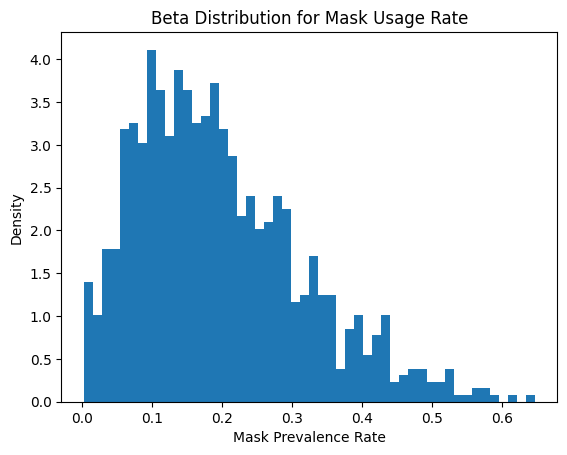

In [ ]:
# Mask Usage Rate
import matplotlib.pyplot as plt
from scipy.stats import beta

# Parameters for beta distribution
alpha, beta_param = 2, 8

# Generate sample mask usage rates
mask_usage_rates = beta.rvs(alpha, beta_param, size=1000)

# Plot
plt.hist(mask_usage_rates, bins=50, density=True)
plt.title('Beta Distribution for Mask Usage Rate')
plt.xlabel('Mask Prevalence Rate')
plt.ylabel('Density')
plt.show()


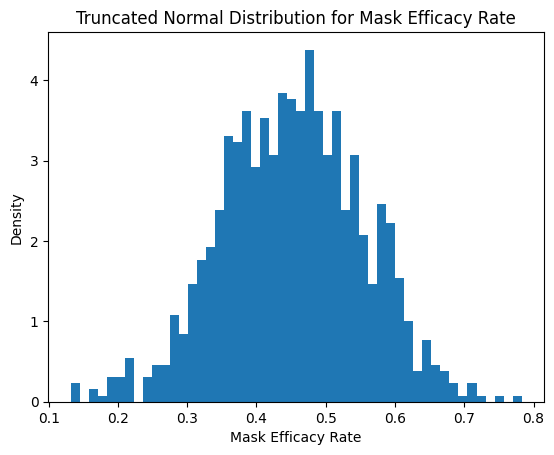

In [ ]:
# Mask Efficacy Rate

from scipy.stats import truncnorm

# Parameters for truncated normal distro
mu, sigma = 0.45, 0.1
lower, upper = 0, 1
a, b = (lower - mu) / sigma, (upper - mu) / sigma

# Generate sample mask efficacy rates
mask_efficacy_rates = truncnorm.rvs(a, b, loc=mu, scale=sigma, size=1000)

# Plot
plt.hist(mask_efficacy_rates, bins=50, density=True)
plt.title('Truncated Normal Distribution for Mask Efficacy Rate')
plt.xlabel('Mask Efficacy Rate')
plt.ylabel('Density')
plt.show()


**Determining Social Distancing Prevalence and Efficacy Rates**

To derive social distancing prevalence and flu prevention efficacy rates, we utilize [findings from this study](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7181908/#:~:text=Overall%2C%20our%20systematic%20reviews%20suggested,impact%20of%20an%20influenza%20pandemic.), which provides a comprehensive review of prior studies related to nonpharmaceutical approaches to pandemic influenza prevention.

**Social Distancing Prevalence**

Assumptions:
This study includes multiple references and examples to social distancing efforts in pandemic flu prevention. Rates of social distancing varied widely, such as 10 to 90 percent in cited studies. The definition of social distancing was also expansive to include isolation of ill persons, school closures, and more. For the purposes of our simulation, we assume a general definition of social distancing that includes isolation of sick persons and limited social contact with others outside of one's home.

Distribution Type: We again use the Beta distributions to model probabilities between 0 and 1 and can account for variability in adherence rates.

Parameters:
Based on typical adherence rates, we might set:

Alpha: 2, to reflect a moderate base level of compliance
Beta: 3, to reflect the high adherence during a pandemic event

This configuration peaks around moderate adherence levels but allows for variability, including both low and high compliance scenarios.

**Social Distancing Efficacy**

Assumptions:
Social distancing efficacy is defined as the effectiveness of these measures in reducing the transmission of influenza. Our primary study indicated wide ranging rates of reduced flu transmission, ranging in some cases from 20% to over 75%.


Distribution Type: We again use a Normal distribution to model efficacy and truncate the distribution to keep values within the 0-1 range.

Mean: 0.5
Standard Deviation: 0.15, to introduce variability in social distancing efficacy

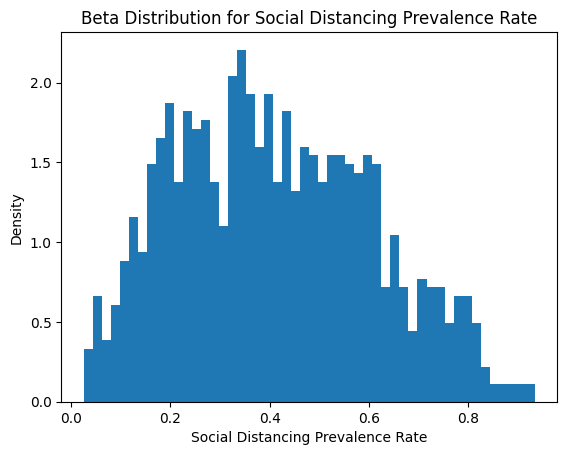

In [ ]:
# Social Distancing Prevalence Rate

# Parameters for Beta distribution
alpha, beta_param = 2, 3

# Generate sample social distancing rates
social_distancing_rates = beta.rvs(alpha, beta_param, size=1000)

# Plot
plt.hist(social_distancing_rates, bins=50, density=True)
plt.title('Beta Distribution for Social Distancing Prevalence Rate')
plt.xlabel('Social Distancing Prevalence Rate')
plt.ylabel('Density')
plt.show()


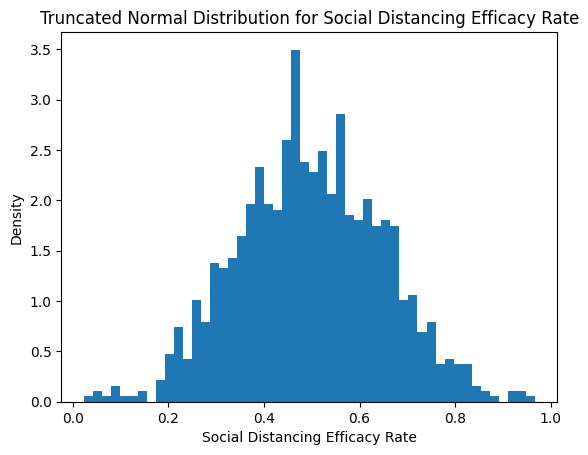

In [ ]:
# Social Distancing Efficacy Rate

# Parameters for truncated normal distribution
mu, sigma = 0.50, 0.15
lower, upper = 0, 1
a, b = (lower - mu) / sigma, (upper - mu) / sigma

# Generate sample social distancing efficacy rates
social_distancing_efficacy = truncnorm.rvs(a, b, loc=mu, scale=sigma, size=1000)

# Plot
plt.hist(social_distancing_efficacy, bins=50, density=True)
plt.title('Truncated Normal Distribution for Social Distancing Efficacy Rate')
plt.xlabel('Social Distancing Efficacy Rate')
plt.ylabel('Density')
plt.show()


###Vaccination rate and vaccination efficacy rates


*   Vaccination rate data source:https:https://www.valuepenguin.com/health-insurance-flu-vaccinations-study#:~:text=Flu%20season%2C%202010%2D11%2C%202011%2D12%2C%202012%2D13%2C%202013%2D14%2C%20Vaccination%20rate%2C%2043.0%%2C%2041.8%%2C%2045.0%%2C%2046.2%%2C
*   Vaccination efficacy rates data source: https://www.cdc.gov/flu/vaccines-work/effectiveness-studies.htm





In [ ]:
vaxrate_data = {"Season": ["2010-2011", "2011-2012", "2012-2013", "2013-2014", "2014-2015", "2015-2016", "2016-2017", "2017-2018", "2018-2019", "2019-2020", "2020-2021", "2021-2022"],
                "Vax Rate":[0.43,0.418,0.45,0.462,0.471,0.456,0.468,0.417,0.492,0.518,0.521,0.514]
                }
vaxrate_df = pd.DataFrame(vaxrate_data)

vaxrate_df

,Season,Vax Rate
0,2010-2011,0.430
1,2011-2012,0.418
2,2012-2013,0.450
3,2013-2014,0.462
4,2014-2015,0.471
5,2015-2016,0.456
6,2016-2017,0.468
7,2017-2018,0.417
8,2018-2019,0.492
9,2019-2020,0.518


In [ ]:
round(np.mean(vaxrate_df['Vax Rate']),2)

0.47

In [ ]:
vaxeff_data = {"Season": ["2010-2011", "2011-2012", "2012-2013", "2013-2014", "2014-2015", "2015-2016", "2016-2017", "2017-2018", "2018-2019", "2019-2020", "2021-2022", "2022-2023"],
                "Vax Eff":[0.6,0.47,0.49,0.52,0.19,0.48,0.4,0.38,0.29,0.39,0.36,0.54]
                }
vaxeff_df = pd.DataFrame(vaxeff_data)

vaxeff_df

,Season,Vax Eff
0,2010-2011,0.60
1,2011-2012,0.47
2,2012-2013,0.49
3,2013-2014,0.52
4,2014-2015,0.19
5,2015-2016,0.48
6,2016-2017,0.40
7,2017-2018,0.38
8,2018-2019,0.29
9,2019-2020,0.39


**Duration of illness for both unvaccinated, partially vaccinated, and fully vaccinated**

For unvaccinated people, it usually lasts about a week, 7 days
for vaccinated people, the period tends to be less, assuming it would take 5 days

**For those who had flu, rate of recurrent illness**

A person can be infected again 2nd, 3rd, 4th,... times

In our case, we want to find out what the second transmission rate is for a person that have flu illness in the past. Here we will apply poisson law.

Using transmission rate that we have per age groups (we call it beta), the rate of recurrent illness is
P [X=2] = (e^beta*(beta)^2)/2!

Because we are using SEIR model, we also need the incubation rate. According to CDC, incubation period are 2 days. We will use this as a sigma in SEIR model

In [ ]:
pip install simpy

# Simulation of the SEIR Model incorporating all intervention measures (social distancing, masking, vaccination)

In [ ]:
from datetime import datetime

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
import seaborn as sns

#First model without any guidace on social distancing, masking, vaccinations#

In [ ]:
#first model without any guidace on social distancing, masking, vaccine
#parameters for the simulation
total_pop = 100000

simulation_days = 212
dt = 1.0           # Time step size
t = np.arange(0, simulation_days, dt)

beta = 0.5 #transmission rate

sigma = 1/2 #incubation rate

gamma = 1/5 #recovery rate

s_eff = 0 # Social distancing effectiveness

m_eff = 0  # Masking effectiveness

#initial parameters
E0 = 5000
I0 = 2500
R0 = 0
S0 = total_pop - E0 - I0 - R0

S = np.zeros(simulation_days)
E = np.zeros(simulation_days)
I = np.zeros(simulation_days)
R = np.zeros(simulation_days)

S[0] = S0
E[0] = E0
I[0] = I0
R[0] = R0

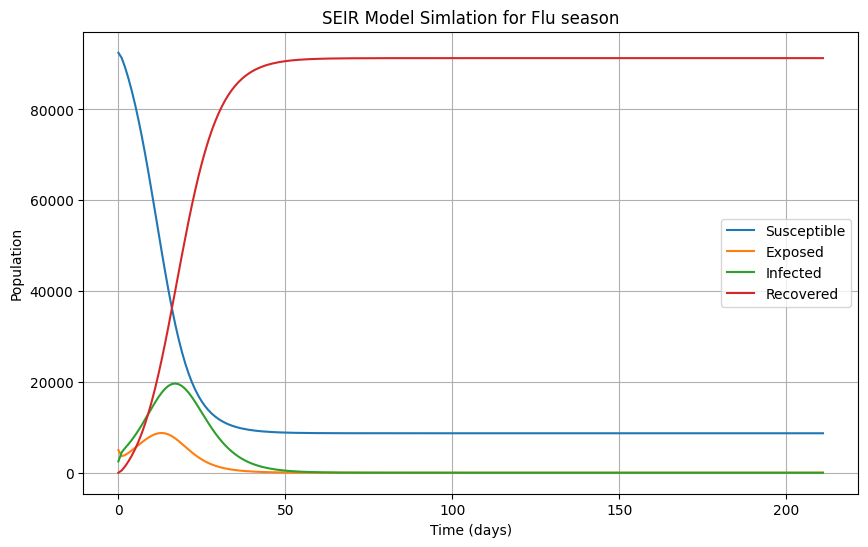

In [ ]:
for day in range(1, simulation_days):
  dS_dt = -beta * S[day-1] * I[day-1] / total_pop
  dE_dt = beta * S[day-1] * I[day-1] / total_pop - sigma * E[day-1]
  dI_dt = sigma * E[day-1] - gamma * I[day-1]
  dR_dt = gamma * I[day-1]

  S[day] = S[day-1] + dS_dt * 1.0
  E[day] = E[day-1] + dE_dt * 1.0
  I[day] = I[day-1] + dI_dt * 1.0
  R[day] = R[day-1] + dR_dt * 1.0

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(t, S, label='Susceptible')
plt.plot(t, E, label='Exposed')
plt.plot(t, I, label='Infected')
plt.plot(t, R, label='Recovered')
plt.xlabel('Time (days)')
plt.ylabel('Population')
plt.title('SEIR Model Simlation for Flu season')
plt.legend()
plt.grid(True)
plt.show()

#Second model which people start practicing social distancing and masking starting day 10, and are introduced to vaccines starting day 30#

In [ ]:
#parameters for the simulation
total_pop = 100000

simulation_days = 212
dt = 1.0           # Time step size
t = np.arange(0, simulation_days, dt)

beta = 0.5 #transmission rate

sigma = 1/2 #incubation rate

gamma = 1/5 #recovery rate

s_eff = 0.50 # Social distancing effectiveness

m_eff = 0.45  # Masking effectiveness

v_eff = 0.42 # vaccine effectiveness
v_rate = 0.01 # Vaccination rate per day

#initial parameters
E0 = 5000
I0 = 2500
R0 = 0
S0 = total_pop - E0 - I0 - R0

S = np.zeros(simulation_days)
E = np.zeros(simulation_days)
I = np.zeros(simulation_days)
R = np.zeros(simulation_days)

S[0] = S0
E[0] = E0
I[0] = I0
R[0] = R0

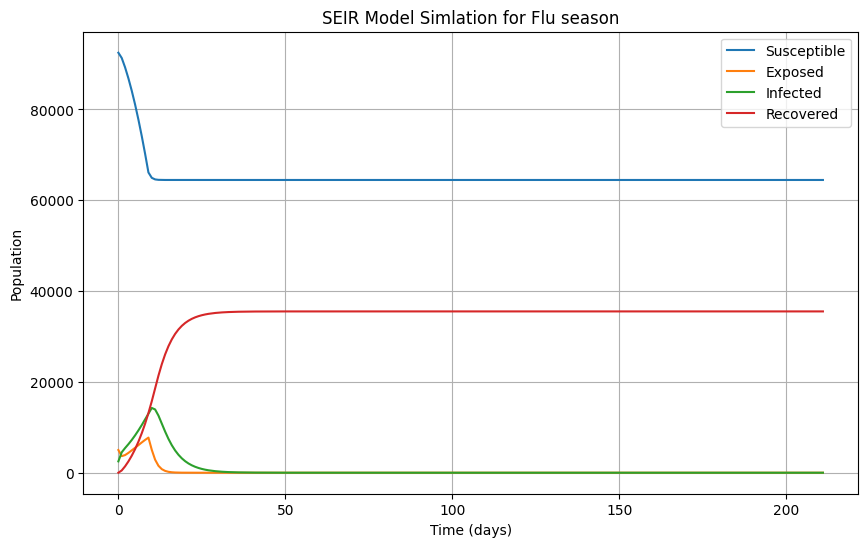

In [ ]:
for day in range(1, simulation_days):
    if day >= 10:
      beta = beta * (1 - s_eff) * (1 - m_eff)
      dS_dt = -beta * S[day-1] * I[day-1] / total_pop
      dE_dt = beta * S[day-1] * I[day-1] / total_pop - sigma * E[day-1]
      dI_dt = sigma * E[day-1] - gamma * I[day-1]
      dR_dt = gamma * I[day-1]

    if day >= 30:
      beta = beta * (1 - s_eff) * (1 - m_eff) * (1 - v_eff)
      dS_dt = -beta * S[day-1] * I[day-1] / total_pop
      dE_dt = beta * S[day-1] * I[day-1] / total_pop - sigma * E[day-1]
      dI_dt = sigma * E[day-1] - gamma * I[day-1]
      dR_dt = gamma * I[day-1]

    else:
      dS_dt = -beta * S[day-1] * I[day-1] / total_pop
      dE_dt = beta * S[day-1] * I[day-1] / total_pop - sigma * E[day-1]
      dI_dt = sigma * E[day-1] - gamma * I[day-1]
      dR_dt = gamma * I[day-1]


    S[day] = S[day-1] + dS_dt * 1.0
    E[day] = E[day-1] + dE_dt * 1.0
    I[day] = I[day-1] + dI_dt * 1.0
    R[day] = R[day-1] + dR_dt * 1.0

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(t, S, label='Susceptible')
plt.plot(t, E, label='Exposed')
plt.plot(t, I, label='Infected')
plt.plot(t, R, label='Recovered')
plt.xlabel('Time (days)')
plt.ylabel('Population')
plt.title('SEIR Model Simlation for Flu season')
plt.legend()
plt.grid(True)
plt.show()

#Third model which people start practicing social distancing, masking, and vaccines starting day 1#

In [ ]:
#first model without any guidace on social distancing, masking, vaccine
#parameters for the simulation
total_pop = 100000

simulation_days = 212
dt = 1.0           # Time step size
t = np.arange(0, simulation_days, dt)

beta = 0.5 #transmission rate

sigma = 1/2 #incubation rate

gamma = 1/5 #recovery rate

s_eff = 0.50 # Social distancing effectiveness

m_eff = 0.45  # Masking effectiveness

v_eff = 0.42 # vaccine effectiveness
v_rate = 0.01 # Vaccination rate per day

#initial parameters
E0 = 5000
I0 = 2500
R0 = 0
S0 = total_pop - E0 - I0 - R0

S = np.zeros(simulation_days)
E = np.zeros(simulation_days)
I = np.zeros(simulation_days)
R = np.zeros(simulation_days)

S[0] = S0
E[0] = E0
I[0] = I0
R[0] = R0

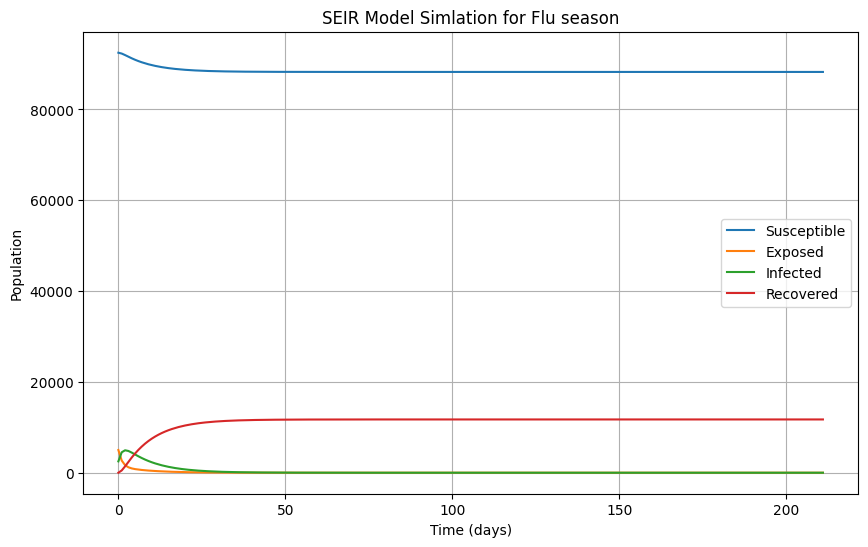

In [ ]:
for day in range(1, simulation_days):
    beta_new = beta * (1 - s_eff) * (1 - m_eff) * (1 - v_eff)
    dS_dt = -beta_new * S[day-1] * I[day-1] / total_pop
    dE_dt = beta_new * S[day-1] * I[day-1] / total_pop - sigma * E[day-1]
    dI_dt = sigma * E[day-1] - gamma * I[day-1]
    dR_dt = gamma * I[day-1]


    S[day] = S[day-1] + dS_dt * 1.0
    E[day] = E[day-1] + dE_dt * 1.0
    I[day] = I[day-1] + dI_dt * 1.0
    R[day] = R[day-1] + dR_dt * 1.0

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(t, S, label='Susceptible')
plt.plot(t, E, label='Exposed')
plt.plot(t, I, label='Infected')
plt.plot(t, R, label='Recovered')
plt.xlabel('Time (days)')
plt.ylabel('Population')
plt.title('SEIR Model Simlation for Flu season')
plt.legend()
plt.grid(True)
plt.show()

# Simulation of SEIR Model with different vaccination rate

https://www.kff.org/other/state-indicator/adult-flu-vaccination-rates-by-age/?currentTimeframe=0&selectedDistributions=all-adults&sortModel=%7B%22colId%22:%22Location%22,%22sort%22:%22asc%22%7D

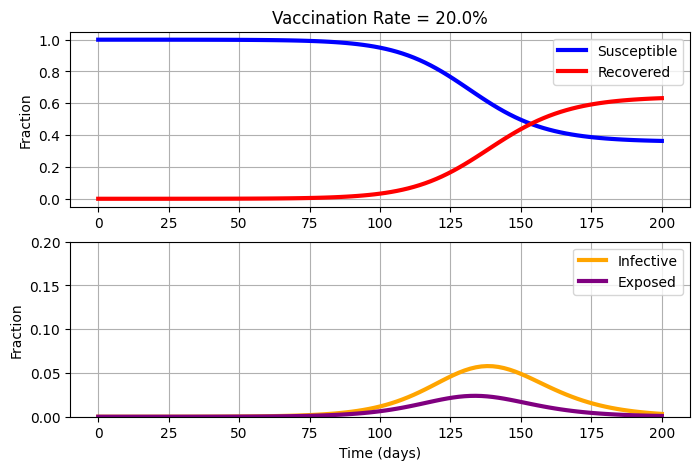

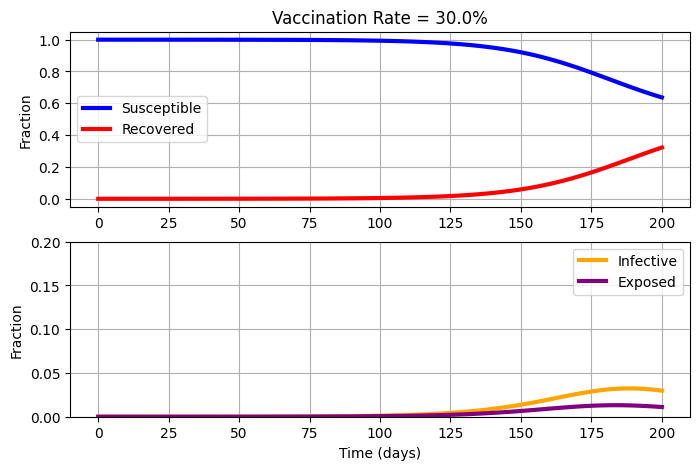

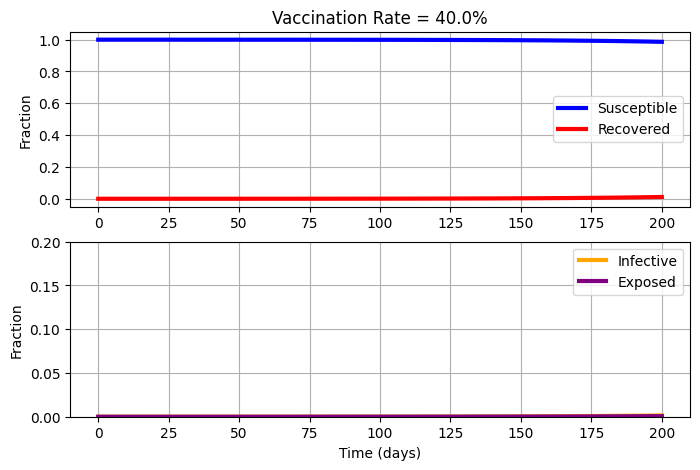

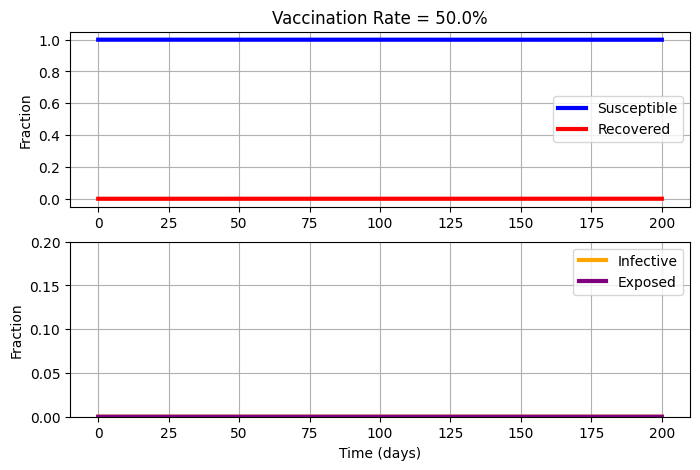

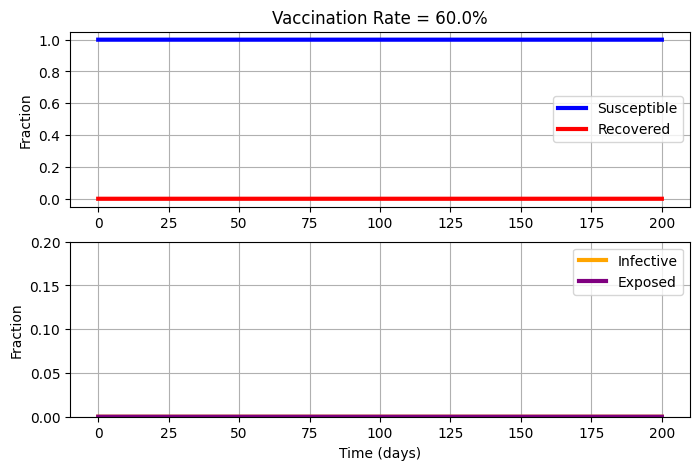

In [ ]:
#Cao's SIER model simulation

u_list = [0.2,0.3,0.4,0.5,0.6]# vaccination rate(0-1)
for u in u_list:
    t_incubation = 2
    t_infective = 5
    R0 = 2
    N = 100000

    # initial number of infected and recovered individuals
    e0 = 1/N
    i0 = 0.00
    r0 = 0.00
    s0 = 1 - e0 - i0 - r0
    x0 = [s0,e0,i0,r0]

    alpha = 1/t_incubation
    gamma = 1/t_infective
    beta = R0*gamma

    def flu(x,t):
        s,e,i,r = x
        dx = np.zeros(4)
        dx[0] = -(1-u)*beta * s * i
        dx[1] = (1-u)*beta * s * i - alpha * e
        dx[2] = alpha * e - gamma * i
        dx[3] = gamma*i
        return dx

    t = np.linspace(0, 200, 101)
    x = odeint(flu,x0,t)
    s = x[:,0]; e = x[:,1]; i = x[:,2]; r = x[:,3]

    # plot the data
    plt.figure(figsize=(8,5))

    plt.subplot(2,1,1)
    plt.title('Vaccination Rate = '+str(u*100)+'%')
    plt.plot(t,s, color='blue', lw=3, label='Susceptible')
    plt.plot(t,r, color='red',  lw=3, label='Recovered')
    plt.ylabel('Fraction')
    plt.legend()
    plt.grid()

    plt.subplot(2,1,2)
    plt.plot(t,i, color='orange', lw=3, label='Infective')
    plt.plot(t,e, color='purple', lw=3, label='Exposed')
    plt.ylim(0, 0.2)
    plt.xlabel('Time (days)')
    plt.ylabel('Fraction')
    plt.legend()
    plt.grid()
    plt.show()

# Stochastic SEIRDV Model

This model simulates the spread of a pandemic flu through a population, considering the following categories/components:

- Susceptible (S)
- Exposed (E)
- Infectious (I)
- Recovered (R)
- Dead (D)
- Vaccinated (V)

The following code block includes:

1. Parameter distributions (i.e., rates)
2. Fixed parameters
3. Sampling method for stochastic parameter generation
4. Seasonal modifier function
5. Core SEIRDV model implementation

Detailed inline notation is shown to assist with understanding the model and adaption. This block has the main components of the simulation and defines the dynamics of disease spread and interventions,

Key features of this model:
- Stochastic parameter sampling
- Seasonal variation in transmission
- Effects of non-pharmaceutical interventions such as masks and social distancing
- Vaccination dynamics
- Time-dependent vaccination rates

# SEIRDV Scenario 1
### Fixed Parameters:
- Population: 100,000
- Simulation Days: 212
- Initial Infected: 500
- Initial Exposed: 250
- Initial Vaccinated Population with 1 Dose: 5% of population
- Initial Vaccinated Population with 2 Doses: 3% of population

### Standardized Parameters (random sampling from distribution centered around mean value):
- R0_base: mean of 2 secondary infections per sick individual
- Incubation Period: mean of 2 days
- Infectious Period (effectively Recovery Period): mean of 5 days
- Mask Efficacy: mean of 45%
- Social Distancing Efficacy: mean of 50%
- Mask Prevalance: 50%
- Social Distancing Prevalence: 50%
- Vaccine Efficacy for 1 Dose: 60%
- Vaccine Efficacy for 2 Doses: 80%
- Mortality Rate: .33%

### Vaccination Rates:
Instead of a fixed vaccination rate, we use time-dependent vaccination rates:
For the first dose (vax_rate_1_function):

3% per day for the first 30 days
5% per day for the next 60 days
3% per day for the rest of the simulation

For the second dose (vax_rate_2_function):

0.1% per day for the first 60 days
0.5% per day for the next 60 days
0.2% per day for the rest of the simulation

This scenario reflects a significant outbreak of 500 infectious individuals that have exposed 250 individuals at the onset of the simulation (day 0). A total of 8% of the population have already received some level of vaccination by day 0.

The simulation randomly samples from the standardized parameters that are centered around the means specified above. The model includes seasonal variation in transmission rates using a cosine function.

Vaccinated individuals who become infected are removed from the vaccinated population ('new_exposed_V1' and 'new_exposed_V2').

The model is run 1000 times to account for stochastic variability. The results are averaged to produce the final output.


In [ ]:
from scipy.stats import gamma, beta

# Fixed Parameters for SEIRDV Model Simulation

# Total population size for the simulation
# This represents a small city
population_size = 100000

# Duration of the simulation in days
# Represents 7 months from October to April, covering a typical flu season
simulation_days = 212

# Number of initially infected individuals
# Assumes a significant outbreak has already occurred at the start of the simulation
initial_infected = 500

# Number of initially exposed individuals
# Represents those who have been in contact with infected individuals but are not yet infectious
initial_exposed = 250

# Number of initially vaccinated individuals
# Set to 8% of the population, representing those vaccinated before the flu season starts
# This could include high-risk groups or early adopters of the flu vaccine
initial_vaccinated_1 = int(0.05 * population_size)  # 5% with one dose
initial_vaccinated_2 = int(0.03 * population_size)  # 3% with two doses

###

# Parameter Distributions for Stochastic SEIRDV Model

# The 'param_distributions' dictionary defines the distributions for various model parameters.
# Each parameter is associated with a distribution type and its parameters.
# 'gamma' distributions are used for rate parameters - reference: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1181873/
# 'beta' distributions are used for proportions

param_distributions = {
    # Reproduction number (R0) - average number of secondary infections per infectious case
    # Gamma distribution with shape=8, scale=0.25 (mean R0 = 2)
    'R0_base': ('gamma', 8, 0.25),

    # Incubation period - time in days from exposure to becoming infectious
    # Gamma distribution with shape=16, scale=0.125 (mean = ~2 days)
    'incubation_period': ('gamma', 16, 0.125),

    # Infectious period - time in days an individual remains infectious
    # Gamma distribution with shape=20, scale=0.25 (mean = 5 days)
    'infectious_period': ('gamma', 20, 0.25),

    # Mask efficacy
    # Adjusted to 45%; ref: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9153293/#:~:text=Across%20all%20the%20years%20modeled,influenza%20infections%20by%20%3E90%25
    # Beta distribution with alpha=4.5, beta=5.5 (mean = 0.45)
    'mask_efficacy': ('beta', 4.5, 5.5),

    # Social distancing efficacy
    # Adjusted to 50 %; ref: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7181908/#SD1
    # Beta distribution with alpha=5, beta=5 (mean = 0.5)
    'social_distancing_efficacy': ('beta', 5, 5),

    # Mask prevalence
    # Beta distribution with alpha=5, alpha=5 (mean = 0.5)
    'mask_prevalence': ('beta', 5, 5),

    # Social distancing prevalence
    # Beta distribution with alpha=5, beta=5 (mean = 0.5)
    'social_distancing_prevalence': ('beta', 5, 5),

    # Vaccine efficacy
    'vaccine_efficacy_1': ('beta', 3, 2),  # Efficacy for 1 dose at 60%
    'vaccine_efficacy_2': ('beta', 8, 2),  # Efficacy for 2 doses at 80%

    # Vaccination rate - rate at which the population gets vaccinated - standardized at 80%; ref: https://usafacts.org/visualizations/covid-vaccine-tracker-states/
    # Beta distribution with alpha=5, beta=20 (mean = 0.8)
    # 'vaccination_rate': ('beta', 20, 5) - CHANGED TO INDEPENDENT VACCINATION RATES

    # Mortality rate - probability of death for infected individuals
    # Beta distribution with alpha=1, beta=300 (mean = ~0.0033, or about 0.33%)
    'mortality_rate': ('beta', 1, 300)
}

# Function to generate random samples from rates
def sample_params(distributions):
    params = {}

    # Iterate through distro in distributions dictionary
    for param, (dist_type, a, b) in distributions.items():
        # Check if distro type is gamma
        if dist_type == 'gamma':
            # Sample from gamma distro
            # a: shape parameter, b: scale parameter
            # gamma.rvs generates a random value from gamma distro
            params[param] = gamma.rvs(a, scale=b)

        # Check if distro type is beta
        elif dist_type == 'beta':
            # Sample from beta distro
            # a and b: shape parameters
            # beta.rvs generates a random value from beta distro
            params[param] = beta.rvs(a, b)

    # Dictionary of sampled parameter values
    return params

def seasonal_modifier(day, season_length=212): # changed to reflect 7 month flu season: https://www.cdc.gov/flu/about/season/index.html
    # Calculates the seasonal modifier for transmission rate
    # param day: Current day of simulation
    # param season_start: Day of year when flu season starts (day 0)
    # param season_length: Length of flu season in days (212 days, ~7 months)
    # return: Seasonal modifier value
    # Peak of flu season occurs at midpoint which is season_length / 2

    # Ensure day is within the season length
    t = day % season_length

    # Cosine wave with amplitude 1 centered at 1
    # Peak occurs at t = season_length / 2
    return 1 + .5 * np.cos((2 * np.pi * t) / season_length)

    # This is the paper that cites the general function:  https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7892320/
    # Additional study: https://onlinelibrary.wiley.com/doi/epdf/10.1111/j.1461-0248.2005.00879.x

# seirdv model: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10289697/
# stochastic seir reference: https://link.springer.com/article/10.1007/s00285-019-01374-z
# seir+ code references:
# http://epirecip.es/epicookbook/chapters/sir-stochastic-discretestate-discretetime/python
# https://jckantor.github.io/CBE30338/03.09-COVID-19.html


# Time-dependent vaccination rate functions for 1 and 2 shots
def vax_rate_1_function(day):
    # Set how vaccination rate for first dose changes over time

    if day < 30:
        return 0.03  # 3% per day for first 30 days
    elif day < 90:
        return 0.05   # 5% per day for next 60 days
    else:
        return 0.03  # 3% per day for rest of simulation

def vax_rate_2_function(day):
    if day < 60:
        return 0.003  # 0.3% per day for first 60 days
    elif day < 120:
        return 0.005  # 0.5% per day for next 60 days
    else:
        return 0.003  # 0.3% per day for rest of simulation

# Stochastic SEIRD Model using Independent Vaccine Rate functions for 1 and 2
def stochastic_seird_model(y, params, seasonal_mod, day):
    S, E, I, R, D, V1, V2 = y
    N = sum(y) # Calculate total population

    beta = params['R0_base'] / params['infectious_period'] * seasonal_mod # Effective contact rate 'beta' - this is the product of R0, inverse of the infectious period, and the seasonal modifier
    sigma = min(1, 1 / params['incubation_period']) # rate at which exposed become infectious (sigma) - this is inverse of the incubation period, capped at 1 as this is a probability
    gamma_val = min(1, 1 / params['infectious_period']) # recovery rate (gamma) - this is inverse of infectious period, capped at 1 as this is a probability
    mu = min(1, params['mortality_rate']) # mortality rate 'mu', capped at 1 as this is a probability

    # Vaccination rates based on time-dependent vaccination 1 and 2 rates
    nu1 = min(1, vax_rate_1_function(day))
    nu2 = min(1, vax_rate_2_function(day))

    mask_effect = params['mask_efficacy'] * params['mask_prevalence'] # effect of masking
    sd_effect = params['social_distancing_efficacy'] * params['social_distancing_prevalence'] # effect of social distancing
    effective_beta = min(max(beta * (1 - mask_effect) * (1 - sd_effect), 0), 1) # effective transmission rate after factoring in masking and social distancing

    S_effective = S + V1 * (1 - params['vaccine_efficacy_1']) + V2 * (1 - params['vaccine_efficacy_2']) # Effective susceptible population considering vaccine efficacy
    S_effective = max(S_effective, 1) # Ensure it's at least 1

    # Probability of exposure - uses formula for probability of at least one successful transmission
    # Min/max keeps it between 0 and 1
    p_exposure = min(max(1 - np.exp(-effective_beta * max(I, 0) / S_effective), 0), 1)

    new_exposed_S = np.random.binomial(int(S), p_exposure) # new exposures in susceptible population

    # New exposures in vaccinated population ('breakthrough' cases)
    new_exposed_V1 = np.random.binomial(int(V1), (1 - params['vaccine_efficacy_1']) * p_exposure)
    new_exposed_V2 = np.random.binomial(int(V2), (1 - params['vaccine_efficacy_2']) * p_exposure)

    new_exposed = new_exposed_S + new_exposed_V1 + new_exposed_V2 # Total new exposures
    new_infectious = np.random.binomial(int(E), sigma) # New infectious cases from exposed population
    new_recovered = np.random.binomial(int(I), gamma_val) # New recoveries from infectious population
    new_deaths = np.random.binomial(int(I), mu) # ew deaths from remaining infectious population

    # Ensure total outcomes don't exceed infectious population
    total_outcomes = new_recovered + new_deaths
    if total_outcomes > I:
        factor = I / total_outcomes
        new_recovered = int(new_recovered * factor)
        new_deaths = int(new_deaths * factor)

    # Newly vaccinated individuals from susceptible population
    new_vaccinated_1 = np.random.binomial(int(S), nu1)
    new_vaccinated_2 = np.random.binomial(int(V1), nu2)

    # Changes per compartment
    dS = -new_exposed_S - new_vaccinated_1
    dE = new_exposed - new_infectious
    dI = new_infectious - new_recovered - new_deaths
    dR = new_recovered
    dD = new_deaths
    dV1 = new_vaccinated_1 - new_vaccinated_2 - new_exposed_V1
    dV2 = new_vaccinated_2 - new_exposed_V2

    return np.array([dS, dE, dI, dR, dD, dV1, dV2])

In [ ]:
# Function to run simulation

def run_simulation():
    # Sample model parameters from respective distributions
    params = sample_params(param_distributions)

    # Initialize population state
    # Order: [Susceptible, Exposed, Infectious, Recovered, Dead, Vaccinated]
    y = np.array([
        population_size - initial_infected - initial_exposed - initial_vaccinated_1 - initial_vaccinated_2,  # Susceptible
        initial_exposed,  # Exposed
        initial_infected,  # Infectious
        0,  # Recovered (initially 0)
        0,  # Dead (initially 0)
        initial_vaccinated_1,  # Vaccinated with 1 dose
        initial_vaccinated_2  # Vaccinated with 2 doses
    ])

    # Array to keep results for each day of simulation
    # Shape: (number of days, number of compartments)
    results = np.zeros((simulation_days, 7))

    # Set initial state as first row of results
    results[0] = y

    # Run simulation for each day
    for day in range(1, simulation_days):
        # Calculate seasonal modifier for current day
        seasonal_mod = seasonal_modifier(day)

        # Run 1 step of stochastic SEIRDV model
        # This calculates changes in each category in 1 day
        delta = stochastic_seird_model(results[day-1], params, seasonal_mod, day)

        # Update state by adding changes to previous day's state
        results[day] = results[day-1] + delta

        # Ensure all category values are non-negative
        results[day] = np.maximum(results[day], 0)

        # Normalize results to maintain constant population size
        results[day] = results[day] * (population_size / np.sum(results[day]))

    return results

In the following code block, we:

- Run the simulation over 1000 runs
- Compute the mean results and fraction of the population in each component
- Returns the summary statistics
- Reports results for the first and last 10 days of the simulation

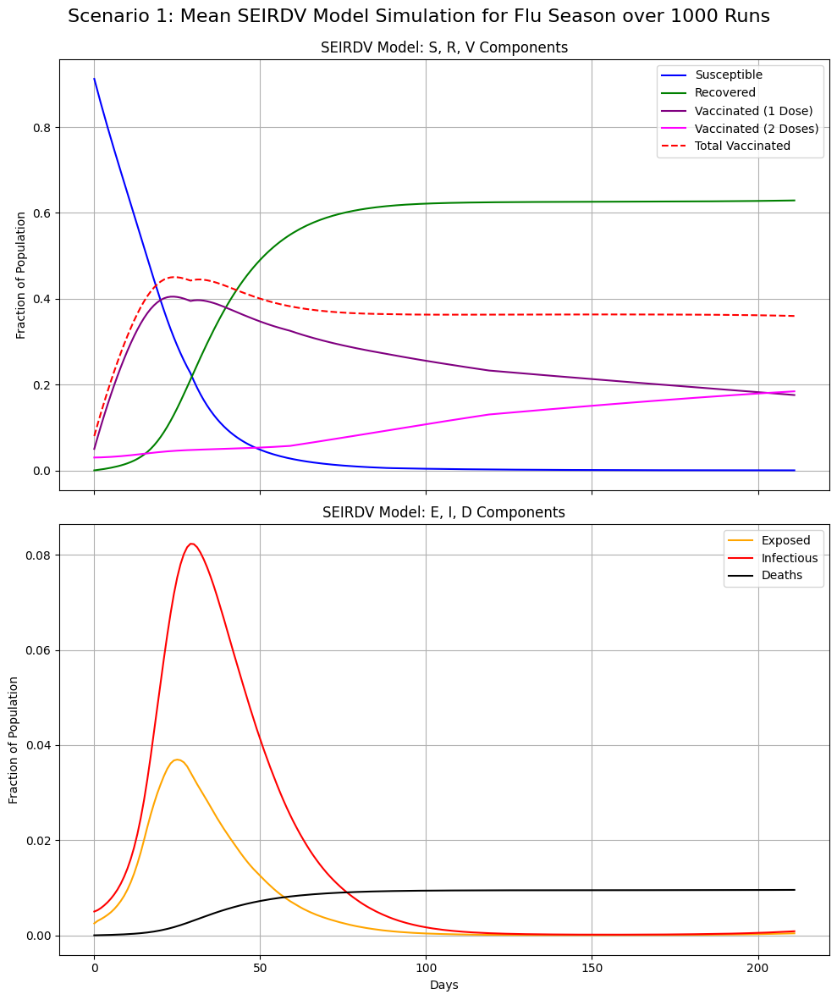

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Run simulation - new vaccine 1 and 2 code
n_runs = 1000
all_results = np.zeros((n_runs, simulation_days, 7))

for i in range(n_runs):
    all_results[i] = run_simulation()

mean_results = np.mean(all_results, axis=0)

# Convert mean results to df
df_mean_1 = pd.DataFrame(mean_results, columns=['Susceptible', 'Exposed', 'Infectious', 'Recovered', 'Deaths', 'Vaccinated_1_Dose', 'Vaccinated_2_Doses'])

# Calculate total vaccinated
df_mean_1['Total_Vaccinated'] = df_mean_1['Vaccinated_1_Dose'] + df_mean_1['Vaccinated_2_Doses']

# Convert to fraction of population
df_fraction_1 = df_mean_1 / population_size

# Add Scenario column
df_fraction_1['Scenario'] = 'Scenario 1'

# Add Day column
df_fraction_1['Day'] = df_fraction_1.index

# Plots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), sharex=True)

# Plot for S, R, V
ax1.plot(df_fraction_1['Day'], df_fraction_1['Susceptible'], label='Susceptible', color='blue')
ax1.plot(df_fraction_1['Day'], df_fraction_1['Recovered'], label='Recovered', color='green')
ax1.plot(df_fraction_1['Day'], df_fraction_1['Vaccinated_1_Dose'], label='Vaccinated (1 Dose)', color='purple')
ax1.plot(df_fraction_1['Day'], df_fraction_1['Vaccinated_2_Doses'], label='Vaccinated (2 Doses)', color='magenta')
ax1.plot(df_fraction_1['Day'], df_fraction_1['Total_Vaccinated'], label='Total Vaccinated', color='red', linestyle='--')
ax1.set_ylabel('Fraction of Population')
ax1.set_title('SEIRDV Model: S, R, V Components')
ax1.legend()
ax1.grid(True)

# Plot for E, I, D
ax2.plot(df_fraction_1['Day'], df_fraction_1['Exposed'], label='Exposed', color='orange')
ax2.plot(df_fraction_1['Day'], df_fraction_1['Infectious'], label='Infectious', color='red')
ax2.plot(df_fraction_1['Day'], df_fraction_1['Deaths'], label='Deaths', color='black')
ax2.set_xlabel('Days')
ax2.set_ylabel('Fraction of Population')
ax2.set_title('SEIRDV Model: E, I, D Components')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.suptitle('Scenario 1: Mean SEIRDV Model Simulation for Flu Season over 1000 Runs', fontsize=16)
plt.subplots_adjust(top=0.93)
plt.show()

In [ ]:
# Summary stats
summary_stats = {
    "Total infected": int(df_mean_1['Recovered'].max() + df_mean_1['Deaths'].max()),
    "Peak infected": int(df_mean_1['Infectious'].max()),
    "Total deaths": int(df_mean_1['Deaths'].max()),
    "Epidemic duration (days to peak)": int(df_mean_1['Infectious'].idxmax()),
    "Vaccinated with 1 dose at end": int(df_mean_1['Vaccinated_1_Dose'].iloc[-1]),
    "Vaccinated with 2 doses at end": int(df_mean_1['Vaccinated_2_Doses'].iloc[-1]),
    "Total vaccinated at end": int(df_mean_1['Total_Vaccinated'].iloc[-1])
}

print(f'Summary Statistics for Scenario 1:')
for key, value in summary_stats.items():
    print(f'{key}: {value:,}')

print(f'\nSEIRDV Model Results for Scenario 1 (First 10 Days):')
print(round(df_mean_1.head(10), 0))

print(f'\nSEIRDV Model Results for Scenario 1 (Last 10 Days):')
print(round(df_mean_1.tail(10), 0))

Summary Statistics for Scenario 1:
Total infected: 63,871
Peak infected: 8,231
Total deaths: 955
Epidemic duration (days to peak): 29
Vaccinated with 1 dose at end: 17,563
Vaccinated with 2 doses at end: 18,424
Total vaccinated at end: 35,988

SEIRDV Model Results for Scenario 1 (First 10 Days):
   Susceptible  Exposed  Infectious  Recovered  Deaths  Vaccinated_1_Dose  \
0      91250.0    250.0       500.0        0.0     0.0             5000.0   
1      88333.0    303.0       528.0      104.0     2.0             7716.0   
2      85495.0    340.0       574.0      215.0     3.0            10337.0   
3      82726.0    381.0       629.0      334.0     5.0            12859.0   
4      80013.0    429.0       694.0      465.0     7.0            15290.0   
5      77357.0    484.0       770.0      611.0     9.0            17623.0   
6      74744.0    550.0       859.0      772.0    12.0            19866.0   
7      72173.0    630.0       963.0      953.0    14.0            22013.0   
8      696

The SRV plot from Scenario 1 reflects the aggressive vaccination campaign from 0 to approximately 25 days, notable in the sharp rise of total vaccinations (driven mostly by first dose immunizations) over this period. The Recovered population rises dramatically from 20 day to 50 days, before the curve bends and flattens around 90 days. Interestingly, total vaccinations peak around 25 days before declining due to 'breakthrough cases', instances where vaccinated individuals get sick and are discounted from the vaccinated population. The seasonal modifier is designed to peak at the midpoint (106 days). An earlier bending of the curve could indicate the efficacy of vaccinations coupled with non-pharmaceutical measures such as masking and social distancing.

In the EID plot for Scenario 1, infections and exposed individuals spike around 30 and 25 days, at over 8% and about 3.5% respectively, similar to the peak of total vaccinations. This observation supports the conjecture that early prevention from the vaccine campaign may have bent the transmission curve prior to the expected influenza seasonal peak around day 106, assuming no preventive measures. Deaths increased from approximately 20 to 60 days before flattening.

# SEIRDV Scenario 2
### Fixed Parameters:
- Population: 100,000
- Simulation Days: 212
- Initial Infected: 500
- Initial Exposed: 250
- Initial Vaccinated Population with 1 Dose: **0% of population**
- Initial Vaccinated Population with 2 Doses: **0% of population**

### Standardized Parameters (random sampling from distribution centered around mean value):
- R0_base: mean of 2 secondary infections per sick individual
- Incubation Period: mean of 2 days
- Infectious Period (effectively Recovery Period): mean of 5 days
- Mask Efficacy: mean of 45%
- Social Distancing Efficacy: mean of 50%
- Mask Prevalance: 50%
- Social Distancing Prevalence: 50%
- Vaccination Rate: Same as Scenario 1
- Vaccine Efficacy for 1 Dose: 60%
- Vaccine Efficacy for 2 Doses: 80%
- Mortality Rate: .33% of infected individuals

**This second scenario assumes the same level of outbreak, but no early vaccinations due to supply chain issues prior to the start of the simulation. The vaccination rates, however, remains the same as scenario 1, as the supply chain issues are resolved starting at day 0.**


Summary Statistics for Scenario 2:
Total infected: 61,515
Peak infected: 7,424
Total deaths: 898
Epidemic duration (days to peak): 31
Vaccinated with 1 dose at end: 19,522
Vaccinated with 2 doses at end: 18,836
Total vaccinated at end: 38,359

SEIRDV Model Results for Scenario 2 (First 10 Days):
   Susceptible  Exposed  Infectious  Recovered  Deaths  Vaccinated_1_Dose  \
0      99250.0    250.0       500.0        0.0     0.0                0.0   
1      96088.0    303.0       523.0      107.0     2.0             2978.0   
2      93018.0    339.0       567.0      217.0     3.0             5847.0   
3      90020.0    377.0       620.0      337.0     5.0             8614.0   
4      87087.0    425.0       681.0      468.0     7.0            11280.0   
5      84212.0    478.0       754.0      612.0     9.0            13848.0   
6      81394.0    542.0       839.0      772.0    11.0            16313.0   
7      78623.0    618.0       938.0      951.0    14.0            18679.0   
8      758

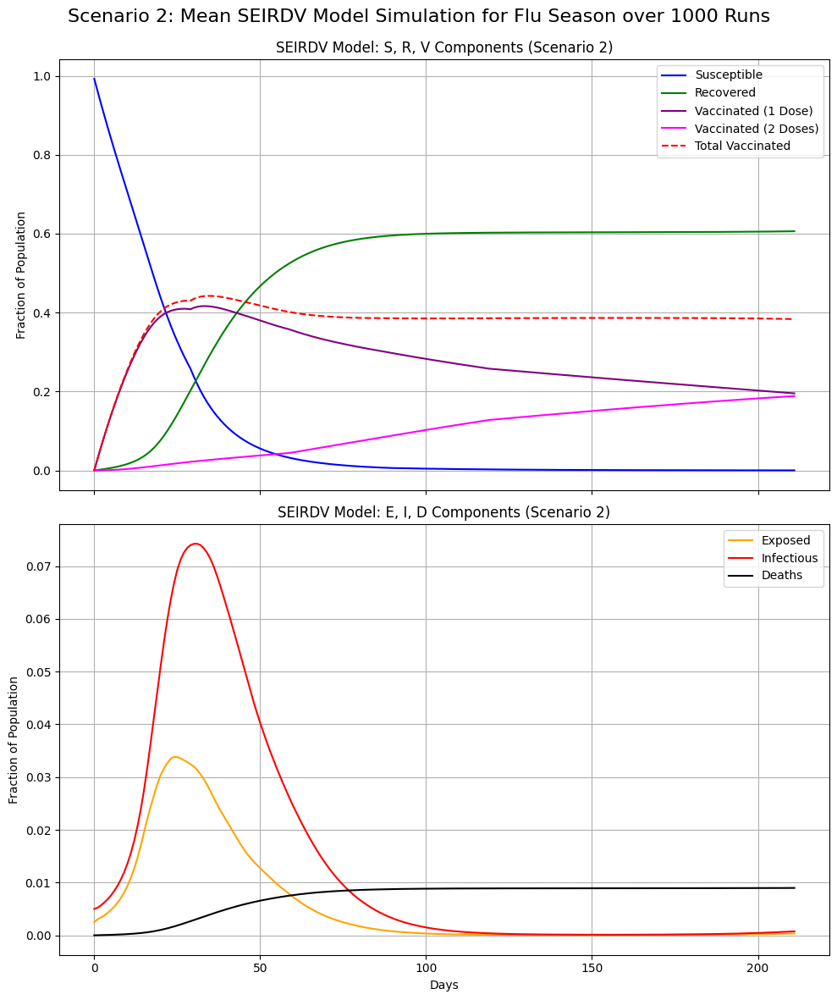

In [ ]:
# Run simulation for Scenario 2
n_runs = 1000
all_results_2 = np.zeros((n_runs, simulation_days, 7))

for i in range(n_runs):
    params = sample_params(param_distributions)

    # Initialize population state for Scenario 2
    y = np.array([
        population_size - initial_infected - initial_exposed,  # Susceptible
        initial_exposed,  # Exposed
        initial_infected,  # Infectious
        0,  # Recovered
        0,  # Dead
        0,  # Vaccinated with 1 dose
        0   # Vaccinated with 2 doses
    ])

    # Results
    results = np.zeros((simulation_days, 7))
    results[0] = y

    # Run simulation
    for day in range(1, simulation_days):
        seasonal_mod = seasonal_modifier(day)
        delta = stochastic_seird_model(results[day-1], params, seasonal_mod, day)
        results[day] = results[day-1] + delta
        results[day] = np.maximum(results[day], 0)
        results[day] = results[day] * (population_size / np.sum(results[day]))

    all_results_2[i] = results

mean_results_2 = np.mean(all_results_2, axis=0)

# Convert mean results to df
df_mean_2 = pd.DataFrame(mean_results_2, columns=['Susceptible', 'Exposed', 'Infectious', 'Recovered', 'Deaths', 'Vaccinated_1_Dose', 'Vaccinated_2_Doses'])

# Calculate total vaccinated
df_mean_2['Total_Vaccinated'] = df_mean_2['Vaccinated_1_Dose'] + df_mean_2['Vaccinated_2_Doses']

# Convert to fraction of population
df_fraction_2 = df_mean_2 / population_size

# Add Scenario column
df_fraction_2['Scenario'] = 'Scenario 2'

# Add Day column
df_fraction_2['Day'] = df_fraction_2.index

# Summary stats for Scenario 2
summary_stats_2 = {
    "Total infected": int(df_mean_2['Recovered'].max() + df_mean_2['Deaths'].max()),
    "Peak infected": int(df_mean_2['Infectious'].max()),
    "Total deaths": int(df_mean_2['Deaths'].max()),
    "Epidemic duration (days to peak)": int(df_mean_2['Infectious'].idxmax()),
    "Vaccinated with 1 dose at end": int(df_mean_2['Vaccinated_1_Dose'].iloc[-1]),
    "Vaccinated with 2 doses at end": int(df_mean_2['Vaccinated_2_Doses'].iloc[-1]),
    "Total vaccinated at end": int(df_mean_2['Total_Vaccinated'].iloc[-1])
}

print(f'Summary Statistics for Scenario 2:')
for key, value in summary_stats_2.items():
    print(f'{key}: {value:,}')

print(f'\nSEIRDV Model Results for Scenario 2 (First 10 Days):')
print(round(df_mean_2.head(10), 0))

print(f'\nSEIRDV Model Results for Scenario 2 (Last 10 Days):')
print(round(df_mean_2.tail(10), 0))

# Combine results from both scenarios
all_scenarios_df = pd.concat([df_fraction_1, df_fraction_2], ignore_index=True)

# Plots for Scenario 2
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), sharex=True)

# Plot for S, R, V
ax1.plot(df_fraction_2['Day'], df_fraction_2['Susceptible'], label='Susceptible', color='blue')
ax1.plot(df_fraction_2['Day'], df_fraction_2['Recovered'], label='Recovered', color='green')
ax1.plot(df_fraction_2['Day'], df_fraction_2['Vaccinated_1_Dose'], label='Vaccinated (1 Dose)', color='purple')
ax1.plot(df_fraction_2['Day'], df_fraction_2['Vaccinated_2_Doses'], label='Vaccinated (2 Doses)', color='magenta')
ax1.plot(df_fraction_2['Day'], df_fraction_2['Total_Vaccinated'], label='Total Vaccinated', color='red', linestyle='--')
ax1.set_ylabel('Fraction of Population')
ax1.set_title('SEIRDV Model: S, R, V Components (Scenario 2)')
ax1.legend()
ax1.grid(True)

# Plot for E, I, D
ax2.plot(df_fraction_2['Day'], df_fraction_2['Exposed'], label='Exposed', color='orange')
ax2.plot(df_fraction_2['Day'], df_fraction_2['Infectious'], label='Infectious', color='red')
ax2.plot(df_fraction_2['Day'], df_fraction_2['Deaths'], label='Deaths', color='black')
ax2.set_xlabel('Days')
ax2.set_ylabel('Fraction of Population')
ax2.set_title('SEIRDV Model: E, I, D Components (Scenario 2)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.suptitle('Scenario 2: Mean SEIRDV Model Simulation for Flu Season over 1000 Runs', fontsize=16)
plt.subplots_adjust(top=0.93)
plt.show()

The SRV plot from Scenario 2 reflects more effective results compared to Scenario 1, with fewer total recovered (infected) individuals and more total vaccinations.

The EID plot for Scenario 2 appears similar to that of Scenario 1, however, we notice that infections peak at only 7.5% and deaths hover under 1%.

These observations collectively indicate that despite a significant early vaccination rate of 8% of the population in Scenario 1, the second scenario shows evidence of being a more effective intervention strategy with respect to the mortality rate.

# SEIRDV Scenario 3
### Fixed Parameters:
- Population: 100,000
- Simulation Days: 212
- Initial Infected: 500
- Initial Exposed: 250
- Initial Vaccinated Population with 1 Dose: 0% of population
- Initial Vaccinated Population with 2 Doses: 0% of population

### Standardized Parameters (random sampling from distribution centered around mean value):
- R0_base: mean of 2 secondary infections per sick individual
- Incubation Period: mean of 2 days
- Infectious Period (effectively Recovery Period): mean of 5 days
- Mask Efficacy: mean of 45%
- Social Distancing Efficacy: mean of 50%
- Mask Prevalance: 50%
- Social Distancing Prevalence: 50%
-  Vaccination Rates: Cut in half from earlier for both vaccines 1 and 2 - 1.5% per day for time stage 1, 2.5% per day for time stage 2, and 1.5% for time stage 3
- Vaccine Efficacy for 1 Dose: 60%
- Vaccine Efficacy for 2 Doses: 80%
- Mortality Rate: .33% of infected individuals

**This third scenario assumes the same level of outbreak, no early vaccinations due to supply chain issues prior to the start of the simulation, and a 50% lower vaccination rates due to ongoing challenges with procuring vaccines.**



Summary Statistics for Scenario 3:
Total infected: 61,047
Peak infected: 7,568
Total deaths: 912
Epidemic duration (days to peak): 31
Vaccinated with 1 dose at end: 19,781
Vaccinated with 2 doses at end: 19,050
Total vaccinated at end: 38,831

SEIRDV Model Results for Scenario 3 (First 10 Days):
   Susceptible  Exposed  Infectious  Recovered  Deaths  Vaccinated_1_Dose  \
0      99250.0    250.0       500.0        0.0     0.0                0.0   
1      96089.0    299.0       527.0      106.0     2.0             2977.0   
2      93017.0    334.0       571.0      216.0     3.0             5850.0   
3      90019.0    372.0       623.0      336.0     5.0             8618.0   
4      87088.0    417.0       685.0      467.0     7.0            11284.0   
5      84215.0    470.0       757.0      611.0     9.0            13851.0   
6      81399.0    533.0       841.0      771.0    12.0            16317.0   
7      78630.0    606.0       940.0      950.0    15.0            18683.0   
8      758

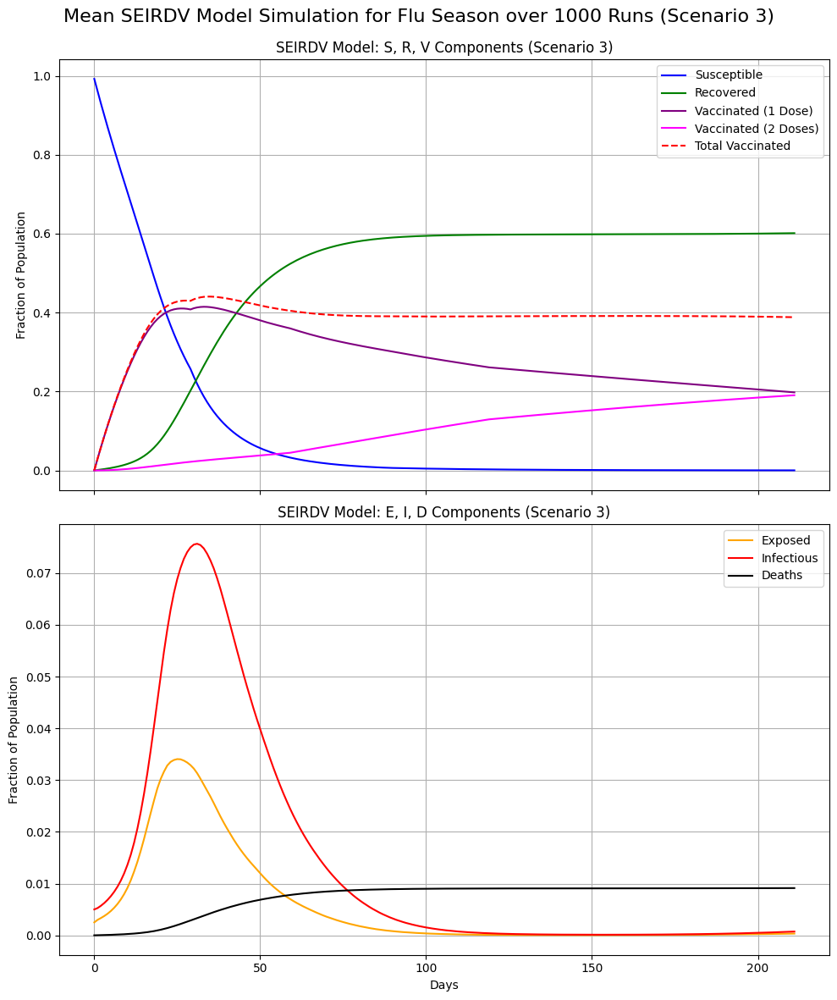

In [ ]:
# Modify the vaccination rate functions for Scenario 3
def vax_rate_1_function_scenario3(day):
    if day < 30:
        return 0.015  # 1.5% per day for first 30 days
    elif day < 90:
        return 0.025  # 2.5% per day for next 60 days
    else:
        return 0.015  # 1.5% per day for rest of simulation

def vax_rate_2_function_scenario3(day):
    if day < 60:
        return 0.015  # 1.5% per day for first 60 days
    elif day < 120:
        return 0.025  # 2.5% per day for next 60 days
    else:
        return 0.015  # 1.5% per day for rest of simulation

# Run simulation for Scenario 3
n_runs = 1000
all_results_3 = np.zeros((n_runs, simulation_days, 7))

for i in range(n_runs):
    params = sample_params(param_distributions)

    # Initialize population state for Scenario 3
    y = np.array([
        population_size - initial_infected - initial_exposed,  # Susceptible
        initial_exposed,  # Exposed
        initial_infected,  # Infectious
        0,  # Recovered (initially 0)
        0,  # Dead (initially 0)
        0,  # Vaccinated with 1 dose (initially 0)
        0   # Vaccinated with 2 doses (initially 0)
    ])

    # Array to keep results
    results = np.zeros((simulation_days, 7))
    results[0] = y

    # Run simulation for each day
    for day in range(1, simulation_days):
        seasonal_mod = seasonal_modifier(day)
        # Use the new vaccination rate functions for Scenario 3
        params['vax_rate_1'] = vax_rate_1_function_scenario3(day)
        params['vax_rate_2'] = vax_rate_2_function_scenario3(day)
        delta = stochastic_seird_model(results[day-1], params, seasonal_mod, day)
        results[day] = results[day-1] + delta
        results[day] = np.maximum(results[day], 0)
        results[day] = results[day] * (population_size / np.sum(results[day]))

    all_results_3[i] = results

mean_results_3 = np.mean(all_results_3, axis=0)

# Convert mean results to df
df_mean_3 = pd.DataFrame(mean_results_3, columns=['Susceptible', 'Exposed', 'Infectious', 'Recovered', 'Deaths', 'Vaccinated_1_Dose', 'Vaccinated_2_Doses'])

# Calculate total vaccinated
df_mean_3['Total_Vaccinated'] = df_mean_3['Vaccinated_1_Dose'] + df_mean_3['Vaccinated_2_Doses']

# Convert to fraction of population
df_fraction_3 = df_mean_3 / population_size

# Add Scenario column
df_fraction_3['Scenario'] = 'Scenario 3'

# Add Day column
df_fraction_3['Day'] = df_fraction_3.index

# Summary stats for Scenario 3
summary_stats_3 = {
    "Total infected": int(df_mean_3['Recovered'].max() + df_mean_3['Deaths'].max()),
    "Peak infected": int(df_mean_3['Infectious'].max()),
    "Total deaths": int(df_mean_3['Deaths'].max()),
    "Epidemic duration (days to peak)": int(df_mean_3['Infectious'].idxmax()),
    "Vaccinated with 1 dose at end": int(df_mean_3['Vaccinated_1_Dose'].iloc[-1]),
    "Vaccinated with 2 doses at end": int(df_mean_3['Vaccinated_2_Doses'].iloc[-1]),
    "Total vaccinated at end": int(df_mean_3['Total_Vaccinated'].iloc[-1])
}

print(f'Summary Statistics for Scenario 3:')
for key, value in summary_stats_3.items():
    print(f'{key}: {value:,}')

print(f'\nSEIRDV Model Results for Scenario 3 (First 10 Days):')
print(round(df_mean_3.head(10), 0))

print(f'\nSEIRDV Model Results for Scenario 3 (Last 10 Days):')
print(round(df_mean_3.tail(10), 0))

# Plots for Scenario 3
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), sharex=True)

# Plot for S, R, V
ax1.plot(df_fraction_3['Day'], df_fraction_3['Susceptible'], label='Susceptible', color='blue')
ax1.plot(df_fraction_3['Day'], df_fraction_3['Recovered'], label='Recovered', color='green')
ax1.plot(df_fraction_3['Day'], df_fraction_3['Vaccinated_1_Dose'], label='Vaccinated (1 Dose)', color='purple')
ax1.plot(df_fraction_3['Day'], df_fraction_3['Vaccinated_2_Doses'], label='Vaccinated (2 Doses)', color='magenta')
ax1.plot(df_fraction_3['Day'], df_fraction_3['Total_Vaccinated'], label='Total Vaccinated', color='red', linestyle='--')
ax1.set_ylabel('Fraction of Population')
ax1.set_title('SEIRDV Model: S, R, V Components (Scenario 3)')
ax1.legend()
ax1.grid(True)

# Plot for E, I, D
ax2.plot(df_fraction_3['Day'], df_fraction_3['Exposed'], label='Exposed', color='orange')
ax2.plot(df_fraction_3['Day'], df_fraction_3['Infectious'], label='Infectious', color='red')
ax2.plot(df_fraction_3['Day'], df_fraction_3['Deaths'], label='Deaths', color='black')
ax2.set_xlabel('Days')
ax2.set_ylabel('Fraction of Population')
ax2.set_title('SEIRDV Model: E, I, D Components (Scenario 3)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.suptitle('Mean SEIRDV Model Simulation for Flu Season over 1000 Runs (Scenario 3)', fontsize=16)
plt.subplots_adjust(top=0.93)
plt.show()

Going into Scenario 3, our intuition was that the end results would be far worse compared to the first two scenarios. However, we saw mixed results with slight more deaths than Scenario 2, but fewer infections and more total vaccinations. This results reflects the variability of our SEIRDV model and its multiple parameters that randomly sample from distributions.

# SEIRDV Scenario 4
### Fixed Parameters:
- Population: 100,000
- Simulation Days: 212
- Initial Infected: 500
- Initial Exposed: 250
- Initial Vaccinated Population with 1 Dose: 0% of population
- Initial Vaccinated Population with 2 Doses: 0% of population

### Standardized Parameters (random sampling from distribution centered around mean value):
- R0_base: mean of 2 secondary infections per sick individual
- Incubation Period: mean of 2 days
- Infectious Period (effectively Recovery Period): mean of 5 days
- Mask Efficacy: mean of 45%
- Social Distancing Efficacy: mean of 50%
- Mask Prevalance: 50%
- Social Distancing Prevalence: 50%
- Vaccine 1 Rate - 4.5% per day for time stage 1, 7.5% per day for time stage 2, and 4.5% for time stage 3
- Vaccine 2 Rate - .5% per day for time stage 1, 1% per day for time stage 2, and .5% for time stage 3
- Vaccine Efficacy for 1 Dose: 60%
- Vaccine Efficacy for 2 Doses: 80%
- Mortality Rate: .33% of infected individuals

**This third scenario assumes the same level of outbreak, no early vaccinations due to supply chain issues prior to the start of the simulation, high vaccine 1 rates but low vaccine 2 rates, due to ongoing supply chain challenges with procuring vaccines. The overall strategy is to vaccinate as many people as possible with 1 dose, and limit 2 doses to high risk subpopulations.**

Summary Statistics for Scenario 4:
Total infected: 58,506
Peak infected: 7,370
Total deaths: 936
Epidemic duration (days to peak): 30
Vaccinated with 1 dose at end: 21,055
Vaccinated with 2 doses at end: 20,300
Total vaccinated at end: 41,355

SEIRDV Model Results for Scenario 4 (First 10 Days):
   Susceptible  Exposed  Infectious  Recovered  Deaths  Vaccinated_1_Dose  \
0      99250.0    250.0       500.0        0.0     0.0                0.0   
1      96096.0    298.0       525.0      104.0     2.0             2975.0   
2      93028.0    333.0       565.0      212.0     3.0             5849.0   
3      90037.0    371.0       614.0      329.0     5.0             8618.0   
4      87117.0    414.0       672.0      456.0     7.0            11283.0   
5      84257.0    463.0       738.0      595.0     9.0            13851.0   
6      81456.0    521.0       815.0      749.0    12.0            16319.0   
7      78705.0    588.0       906.0      920.0    15.0            18689.0   
8      759

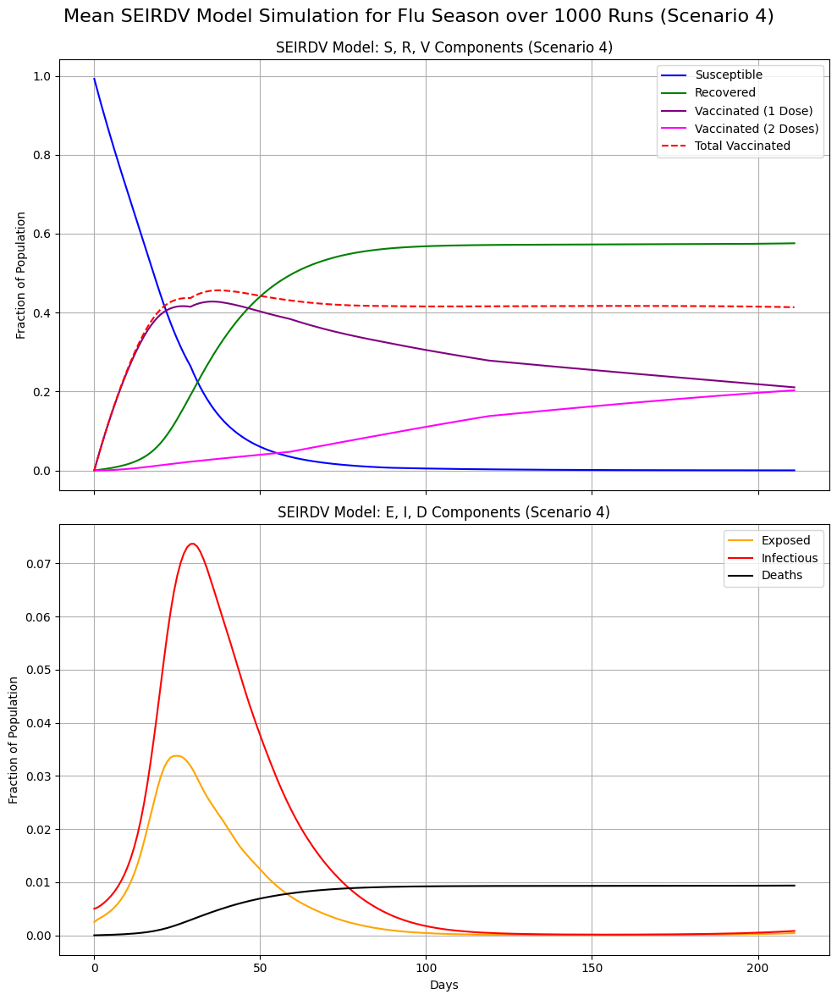

In [ ]:
# Vaccination rate functions for Scenario 4
def vax_rate_1_function_scenario4(day):
    if day < 30:
        return 0.045  # 4.5% per day for first 30 days (time stage 1)
    elif day < 90:
        return 0.075  # 7.5% per day for next 60 days (time stage 2)
    else:
        return 0.045  # 4.5% per day for rest of simulation (time stage 3)

def vax_rate_2_function_scenario4(day):
    if day < 60:
        return 0.005  # 0.5% per day for first 60 days (time stage 1)
    elif day < 120:
        return 0.010  # 1% per day for next 60 days (time stage 2)
    else:
        return 0.005  # 0.5% per day for rest of simulation (time stage 3)

# Run simulation for Scenario 4
n_runs = 1000
all_results_4 = np.zeros((n_runs, simulation_days, 7))

for i in range(n_runs):
    params = sample_params(param_distributions)

    # Initialize population state for Scenario 4
    y = np.array([
        population_size - initial_infected - initial_exposed,  # Susceptible
        initial_exposed,  # Exposed
        initial_infected,  # Infectious
        0,  # Recovered
        0,  # Dead
        0,  # Vaccinated with 1 dose
        0   # Vaccinated with 2 doses
    ])

    results = np.zeros((simulation_days, 7))
    results[0] = y

    # Run simulation for each day
    for day in range(1, simulation_days):
        seasonal_mod = seasonal_modifier(day)
        # Use new vaccination rates for Scenario 4
        params['vax_rate_1'] = vax_rate_1_function_scenario4(day)
        params['vax_rate_2'] = vax_rate_2_function_scenario4(day)
        delta = stochastic_seird_model(results[day-1], params, seasonal_mod, day)
        results[day] = results[day-1] + delta
        results[day] = np.maximum(results[day], 0)
        results[day] = results[day] * (population_size / np.sum(results[day]))

    all_results_4[i] = results

mean_results_4 = np.mean(all_results_4, axis=0)

# Convert mean results to df
df_mean_4 = pd.DataFrame(mean_results_4, columns=['Susceptible', 'Exposed', 'Infectious', 'Recovered', 'Deaths', 'Vaccinated_1_Dose', 'Vaccinated_2_Doses'])

# Total vaccinated
df_mean_4['Total_Vaccinated'] = df_mean_4['Vaccinated_1_Dose'] + df_mean_4['Vaccinated_2_Doses']

# Convert to fraction of population
df_fraction_4 = df_mean_4 / population_size

# Add Scenario column
df_fraction_4['Scenario'] = 'Scenario 4'

# Add Day column
df_fraction_4['Day'] = df_fraction_4.index

# Summary stats for Scenario 4
summary_stats_4 = {
    "Total infected": int(df_mean_4['Recovered'].max() + df_mean_4['Deaths'].max()),
    "Peak infected": int(df_mean_4['Infectious'].max()),
    "Total deaths": int(df_mean_4['Deaths'].max()),
    "Epidemic duration (days to peak)": int(df_mean_4['Infectious'].idxmax()),
    "Vaccinated with 1 dose at end": int(df_mean_4['Vaccinated_1_Dose'].iloc[-1]),
    "Vaccinated with 2 doses at end": int(df_mean_4['Vaccinated_2_Doses'].iloc[-1]),
    "Total vaccinated at end": int(df_mean_4['Total_Vaccinated'].iloc[-1])
}

print(f'Summary Statistics for Scenario 4:')
for key, value in summary_stats_4.items():
    print(f'{key}: {value:,}')

print(f'\nSEIRDV Model Results for Scenario 4 (First 10 Days):')
print(round(df_mean_4.head(10), 0))

print(f'\nSEIRDV Model Results for Scenario 4 (Last 10 Days):')
print(round(df_mean_4.tail(10), 0))

# Plots for Scenario 4
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), sharex=True)

# Plot for S, R, V
ax1.plot(df_fraction_4['Day'], df_fraction_4['Susceptible'], label='Susceptible', color='blue')
ax1.plot(df_fraction_4['Day'], df_fraction_4['Recovered'], label='Recovered', color='green')
ax1.plot(df_fraction_4['Day'], df_fraction_4['Vaccinated_1_Dose'], label='Vaccinated (1 Dose)', color='purple')
ax1.plot(df_fraction_4['Day'], df_fraction_4['Vaccinated_2_Doses'], label='Vaccinated (2 Doses)', color='magenta')
ax1.plot(df_fraction_4['Day'], df_fraction_4['Total_Vaccinated'], label='Total Vaccinated', color='red', linestyle='--')
ax1.set_ylabel('Fraction of Population')
ax1.set_title('SEIRDV Model: S, R, V Components (Scenario 4)')
ax1.legend()
ax1.grid(True)

# Plot for E, I, D
ax2.plot(df_fraction_4['Day'], df_fraction_4['Exposed'], label='Exposed', color='orange')
ax2.plot(df_fraction_4['Day'], df_fraction_4['Infectious'], label='Infectious', color='red')
ax2.plot(df_fraction_4['Day'], df_fraction_4['Deaths'], label='Deaths', color='black')
ax2.set_xlabel('Days')
ax2.set_ylabel('Fraction of Population')
ax2.set_title('SEIRDV Model: E, I, D Components (Scenario 4)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.suptitle('Mean SEIRDV Model Simulation for Flu Season over 1000 Runs (Scenario 4)', fontsize=16)
plt.subplots_adjust(top=0.93)
plt.show()

REWRITE

In Scenario 4, we saw the fewest infections and highest total vaccinations among all scenarios, but the second highest deaths. Thus, while the transmission rate was lower than in the other scenarios, and the vaccination campaign more effective, the mean mortality rate of flu in the model was more deadly based on the number of infections.

In [ ]:
# Merge summary stats
summary_df_1 = pd.DataFrame(summary_stats, index=['Scenario 1']).transpose()
summary_df_2 = pd.DataFrame(summary_stats_2, index=['Scenario 2']).transpose()
summary_df_3 = pd.DataFrame(summary_stats_3, index=['Scenario 3']).transpose()
summary_df_4 = pd.DataFrame(summary_stats_4, index=['Scenario 4']).transpose()

all_summary_stats = pd.concat([summary_df_1, summary_df_2, summary_df_3, summary_df_4], axis=1)

all_summary_stats.index.name = 'Metric'

# Display merged summary statistics
print("Merged Summary Statistics for All Scenarios:")
all_summary_stats

Merged Summary Statistics for All Scenarios:


,Scenario 1,Scenario 2,Scenario 3,Scenario 4
Metric,,,,
Total infected,63871,61515,61047,58506
Peak infected,8231,7424,7568,7370
Total deaths,955,898,912,936
Epidemic duration (days to peak),29,31,31,30
Vaccinated with 1 dose at end,17563,19522,19781,21055
Vaccinated with 2 doses at end,18424,18836,19050,20300
Total vaccinated at end,35988,38359,38831,41355


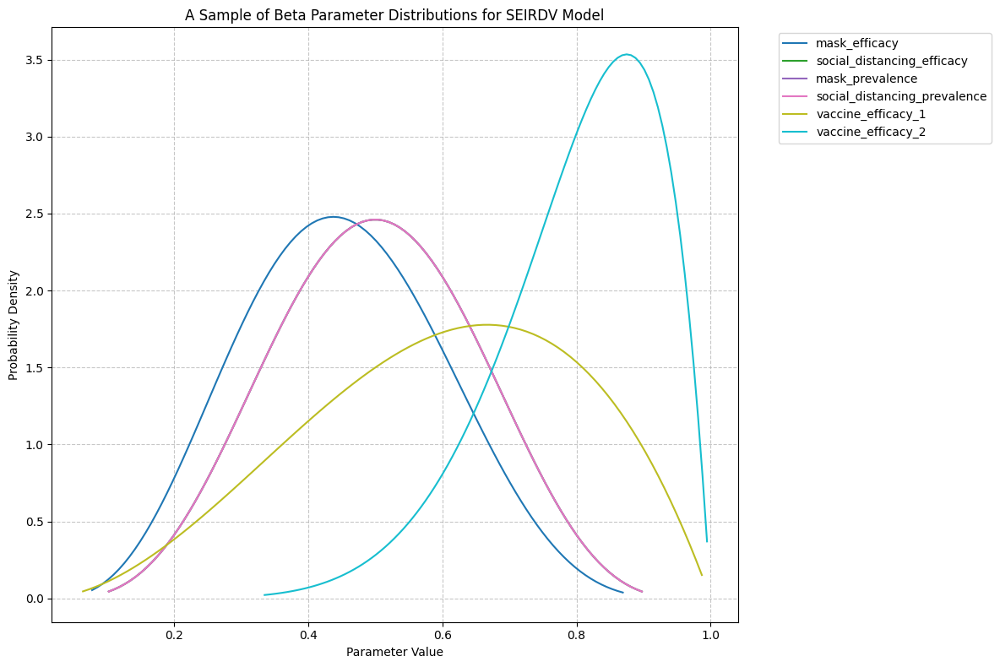

In [ ]:
# Plot subset of parameter distros for paper

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gamma, beta

# Select parameter distros
param_distros = {
    'mask_efficacy': ('beta', 4.5, 5.5),
    'social_distancing_efficacy': ('beta', 5, 5),
    'mask_prevalence': ('beta', 5, 5),
    'social_distancing_prevalence': ('beta', 5, 5),
    'vaccine_efficacy_1': ('beta', 3, 2),
    'vaccine_efficacy_2': ('beta', 8, 2),
}

fig, ax = plt.subplots(figsize=(12, 8))

# Define colors for each distro
colors = plt.cm.tab10(np.linspace(0, 1, len(param_distros)))

# Plot each distro
for (param, (dist_type, a, b)), color in zip(param_distros.items(), colors):
    if dist_type == 'gamma':
        x = np.linspace(gamma.ppf(0.001, a, scale=b), gamma.ppf(0.999, a, scale=b), 100)
        y = gamma.pdf(x, a, scale=b)
    elif dist_type == 'beta':
        x = np.linspace(beta.ppf(0.001, a, b), beta.ppf(0.999, a, b), 100)
        y = beta.pdf(x, a, b)

    ax.plot(x, y, label=param, color=color)

ax.set_xlabel('Parameter Value')
ax.set_ylabel('Probability Density')
ax.set_title('A Sample of Beta Parameter Distributions for SEIRDV Model')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()



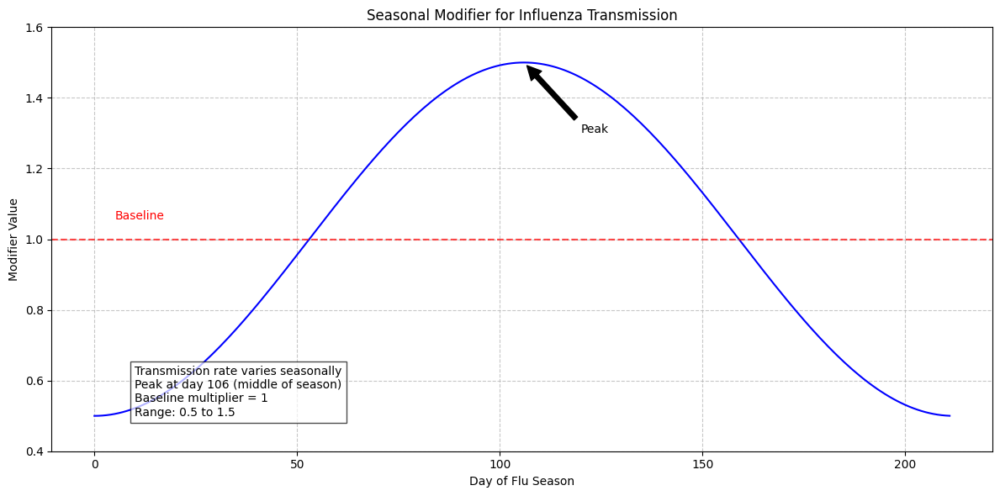

In [ ]:
# Data for plotting seasonal modifier
days = np.arange(0, 212)
modifier_values = [seasonal_modifier(day) for day in days]

def seasonal_modifier(day, season_length=212):
    t = day % season_length
    return 1 + .5 * np.cos((2 * np.pi * t) / season_length + np.pi)

plt.figure(figsize=(12, 6))
plt.plot(days, modifier_values, 'b-')
plt.title('Seasonal Modifier for Influenza Transmission')
plt.xlabel('Day of Flu Season')
plt.ylabel('Modifier Value')
plt.grid(True, linestyle='--', alpha=0.7)

plt.axhline(y=1, color='r', linestyle='--', alpha=0.7)
plt.text(5, 1.05, 'Baseline', color='r', va='bottom')
plt.annotate('Peak', xy=(106, 1.5), xytext=(120, 1.3),
             arrowprops=dict(facecolor='black', shrink=0.05))

plt.ylim(0.4, 1.6)

plt.text(10, 0.5, 'Transmission rate varies seasonally\nPeak at day 106 (middle of season)\nBaseline multiplier = 1\nRange: 0.5 to 1.5',
         bbox=dict(facecolor='white', alpha=0.7))

plt.tight_layout()
plt.show()

# Agent-Based Modeling Approach ###


This simulation uses the population density based on that of Atlanta in Georgia.

* The land area is 135.32 square mile (['Wikipedia']('https://en.wikipedia.org/wiki/Atlanta')), or 3,772,505,088 sq ft.  
* The population is 498,715 (['US Census']('https://data.census.gov/profile/Atlanta_city,_Georgia?g=160XX00US1304000'))

To reduce computation time due to large interaction from the existing population density, the actual simulation was scaled down by 400 to allow us to run multiple trials.

There are two hot spots where population are denser.


In [1]:
import scipy.stats as st
import time

# This simulation uses the population density based on that of Atlanta in Georgia.

# Land (without water) -> 135.32 sq mi (Wikipedia), or 3,772,505,088 sq ft.
land_width = 61421//10     # For simplicity, the simulation is on a square area of 61,421 ft x 61,421 ft

# https://data.census.gov/profile/Atlanta_city,_Georgia?g=160XX00US1304000
population = 498715//100


np.random.seed(0)

# land_width = land_width//2
# population = population//4


location_1 = np.random.normal(0, land_width/7, (2, population//2)) + land_width*1.5/5
location_2 = np.random.normal(0, land_width/7, (2, population//2)) + land_width*3.5/5
locations = np.concatenate([location_1, location_2], axis=1)

locations = locations[: , (locations[0]>0) & (locations[0]<land_width) &
                      (locations[1]>0) & (locations[1]<land_width)]

# randomly define the location for the remaining populations
# setting up dataframe to record the location and infection status
location_ = np.random.randint(land_width, size=(2,population-locations.shape[1]))
locations = np.concatenate([locations, location_], axis=1)

In [2]:
# Here are some variables


# return the mean and standard deviation based on the % confidence inteval and the upper/lower limits
def cal_mean_stdev (lower_limit, upper_limit, CI):
    assert CI < 1
    assert CI > 0
    z = st.norm.ppf(CI)
    mean = (upper_limit + lower_limit) / 2
    stdev = (upper_limit - mean)/z
    return mean, stdev

# calculate death risk based on age and immunity
# referenced https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8215490/ for the range and scale
# 3 age groups:  0 = children, 1 = adult, 2 = elderly
# Each age group has the lower and upper limit for 95% CI.

death_risk_by_age_range = {0:(0.003, 0.03), 1:(0.03, 0.13), 2:(2.19, 3.50)}

# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7386533/#:~:text=We%20found%20evidence%20that%20compared,efforts%20for%20protection%20against%20infection.

# construct dict to return mu and standard deviation for age_group.
# For example, death_risk_by_age_stat[0] returns (0.0165, 0.0082) for mu and sigma, respectively.

death_risk_by_age_stat = {k: cal_mean_stdev (v[0], v[1], 0.95) for k,v in death_risk_by_age_range.items() }


# plot the population density as well as the location of the infected.
# It'll show the hot spots and the spread of the virus over time.

def plot_population (df, title):
    plt.scatter(df['loc_x'], df['loc_y'], c ="blue", s=0.025, marker = '.')
    plt.scatter(df[df['infected'] & df['alive']]['loc_x'],
                df[df['infected']& df['alive']]['loc_y'], c ="red", s=3, marker = 'o')
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.show()


# mapping out all the neighbors at the first trial so we won't have to run this at each iteration.

def find_neighbors (df, distance = 60):
    neighbor = []
    for _, row in df.iterrows():
        x, y = row['loc_x'], row['loc_y']
        ind = df[(x - distance <= df['loc_x']) & (df['loc_x'] <= x + distance) &
                 (y - distance <= df['loc_y']) & (df['loc_y'] <= y + distance)].index.tolist()
        neighbor.append(ind[1:])
    df['neighbor'] = neighbor
#     return df


# The age distribution is simulated based on the population age ratio in Atlanta City in Georgia.
# https://data.census.gov/table/ACSST1Y2022.S0101?g=160XX00US1304000
# 0:  Children (up to 19 years): 20.65%
# 1:  Adult (20-59 years):  62.87%
# 2:  Elderly (60 and over): 16.48%

def set_age_group (df, seed):
    np.random.seed(seed)
    age = np.random.choice([0, 1, 2], population, p=[0.2065, 0.6287, 0.1648])
    df['age_group'] = age


# vaccine protection period:
# https://www.ahcancal.org/News-and-Communications/Documents/GetVaccinated/GETVAX-Recovered-Individuals-handout.pdf

max_days_immune_vaccine = cal_mean_stdev (90, 180, 0.95)     # cal_mean_stdev() returns a tuple of (mu, sigma)
max_days_immune_preinfected = cal_mean_stdev (45, 90, 0.95)   # cal_mean_stdev() returns a tuple of (mu, sigma)
recovery_time = cal_mean_stdev (12, 16, 0.9)      # about 2 weeks for a full recovery +/- 2 days, at 90% CI

# the death risk is approximated by using a normal distribution.
def cal_death_risk(age, seed, immunity):
    np.random.seed(seed)
    mu, sigma = death_risk_by_age_stat[age]
    return max(0, np.random.normal(loc=mu, scale=sigma)) / immunity

# setting the incubation period in which the agents who are infected may not be contagious immediately.
# It is approximated with a discrete model.
def set_incubation (df, seed):
    np.random.seed(seed)
    incubation = np.random.choice([0, 1, 2], population)
    df['incubation'] = incubation


def initiate_df (seed, masked=0, dose1=0, dose2=0, initial_infected = 50):

    np.random.seed(seed)
    df = pd.DataFrame({'loc_x':locations[0],'loc_y':locations[1], 'infected':False, 'contagious':False, 'date_infected':0,
                       'date_infected':0, 'date_recovered':0, 'alive':True, 'mask':False, 'vaccinated':0, 'date_vaccinated':0 })

    # initiate the first group of infected population who are immediately contagious
    infected_id = np.random.choice(population, initial_infected)
    # print('infected_id: ', infected_id[:10])   # for debugging only
    df.loc[infected_id, 'infected'] = True
    df.loc[infected_id, 'contagious'] = True

    # randomly initiating each agent with masked and vaccinations.
    # initiate mask
    if masked > 0:
        if masked <= 1:
            masked = int(population * masked)
        masked_id = np.random.choice(population, masked)
        df.loc[masked_id, 'mask'] = True

    # initiate mask
    if dose1 > 0:
        if dose1 <= 1:
            dose1 = int(population * dose1)
        masked_id = np.random.choice(population, dose1)
        df.loc[masked_id, 'vaccinated'] = 1
        df.loc[masked_id, 'date_vaccinated'] = 1

    if dose2 > 0:
        if dose2 <= 1:
            dose2 = int(population * dose2)
        masked_id = np.random.choice(population, dose2)
        df.loc[masked_id, 'vaccinated'] = 2
        df.loc[masked_id, 'date_vaccinated'] = 1

    # adding age, namely 0=children, 1=adult, 2=elderly
    set_age_group(df, seed)

    # adding the 'death_risk' attribute: a conditional probably that is approximate using normal distribution and age group.
    df['death_risk'] = df['age_group'].apply(cal_death_risk, seed=seed, immunity=1)

    # Adding the 'max_days_immune_vaccine' and 'max_days_immune_preinfected' attribute.  Those are duration of
    # effectiveness of both vaccine and from preinfected with the virus. They are approximated by normal distribution and
    # are different for each person based on how their body react to vaccine or to the virus.
    duration_vaccine = np.random.normal(loc=max_days_immune_vaccine[0], scale=max_days_immune_vaccine[1], size=population)
    duration_recovery = np.random.normal(loc=max_days_immune_preinfected[0], scale=max_days_immune_preinfected[1], size=population)
    df['max_days_immune_vaccine'] = duration_vaccine
    df['max_days_immune_preinfected'] = duration_recovery

    # set incubation period, which is a approximate by using a uniform discrete distribution of 1,2,3
    set_incubation (df, seed)

    # Find all the entities that are connected
    t0 = time.time()
    find_neighbors (df)
    print('Time spent joining all neighbors: ', time.time() - t0, 'seconds')

    df['recovery_time'] = np.random.normal(loc=recovery_time[0], scale=recovery_time[1], size=population).astype(int)
    df['neighbor_count'] = df['neighbor'].apply(lambda x: len(x))

    return df


Time spent joining all neighbors:  12.927191972732544 seconds


<function matplotlib.pyplot.show(close=None, block=None)>

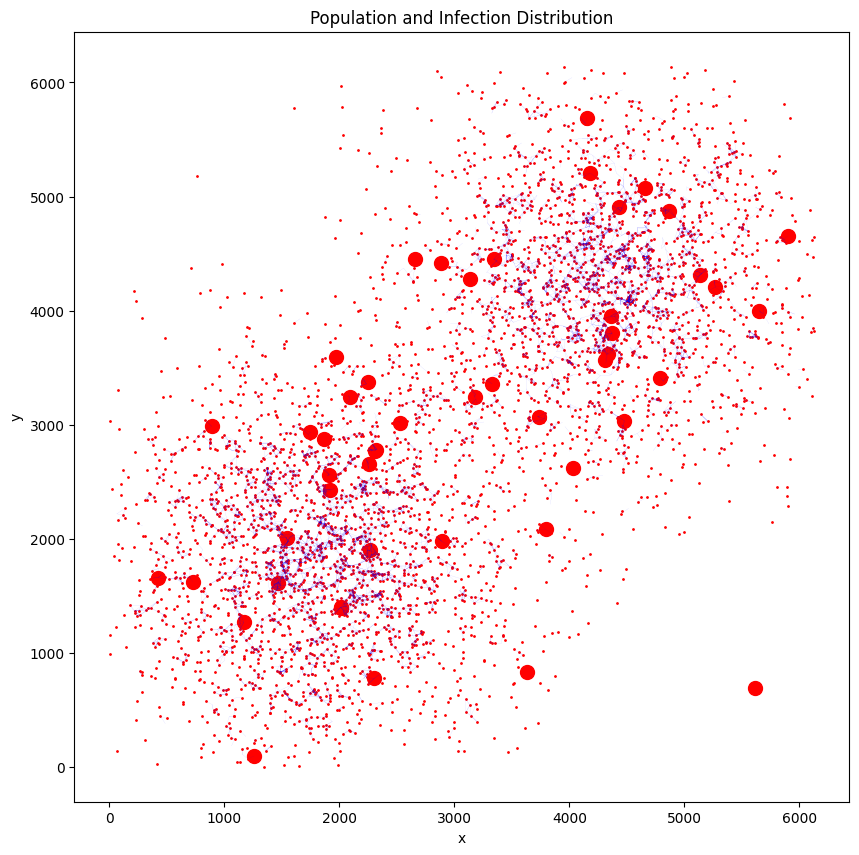

In [3]:
# Construct the network graph to demonstrate the connections between agents.
# This part is used only for generating the images for the final report and is not used for any calculation.
# Also, in the function find_neighbors () the distance argument was set to 150 for a better demonstration of
# the connection network. The default argument is 60 instead of 150.

df_conn = initiate_df(0)
df_conna = df_conn[df_conn['neighbor'].apply(lambda x: x != [])].reset_index()

df_conna.shape

# Setting plot fixture size
plt.figure(figsize=(10,10))

f_x, f_y  = [], []
for i in range(df_conna.shape[0]):
    x, y = [df_conn.loc[i,'loc_x']], [df_conn.loc[i,'loc_y']]
    f_x.append(df_conn.loc[i,'loc_x'])
    f_y.append(df_conn.loc[i,'loc_y'])

    for j in df_conn.loc[i,'neighbor']:
        x.append(df_conn.loc[j,'loc_x'])
        y.append(df_conn.loc[j,'loc_y'])
    plt.plot(x, y, 'b-', lw=0.03)

plt.scatter(f_x, f_y, c ="red", s=4, marker = '.')
plt.scatter(df_conn[df_conn['infected']]['loc_x'], df_conn[df_conn['infected']]['loc_y'], c ="red", s=400, marker = '.')

plt.xlabel('x')
plt.ylabel('y')
plt.title('Population and Infection Distribution')
plt.show

In [4]:
# a preview of the dataframe:

df_conn = initiate_df(0)
display(df_conn.columns)
df_conn.head(10)

Time spent joining all neighbors:  5.930037021636963 seconds


Index(['loc_x', 'loc_y', 'infected', 'contagious', 'date_infected',
       'date_recovered', 'alive', 'mask', 'vaccinated', 'date_vaccinated',
       'age_group', 'death_risk', 'max_days_immune_vaccine',
       'max_days_immune_preinfected', 'incubation', 'neighbor',
       'recovery_time', 'neighbor_count'],
      dtype='object')

,loc_x,loc_y,infected,contagious,date_infected,date_recovered,alive,mask,vaccinated,date_vaccinated,age_group,death_risk,max_days_immune_vaccine,max_days_immune_preinfected,incubation,neighbor,recovery_time,neighbor_count
0,3390.429930,3084.737220,False,False,0,0,True,False,0,0,1,0.133623,145.947524,79.979132,0,[4395],14,1
1,2193.709368,1576.961995,False,False,0,0,True,False,0,0,1,0.133623,161.776370,84.457324,1,"[209, 438, 635, 1921, 2299]",14,5
2,2701.372671,2710.973019,False,False,0,0,True,False,0,0,1,0.133623,196.306485,59.656891,0,"[528, 1091, 1995]",14,3
3,3808.823718,2356.642236,False,False,0,0,True,False,0,0,1,0.133623,186.092759,73.312075,1,"[4664, 4967]",12,2
4,3481.248739,2839.699367,False,False,0,0,True,False,0,0,1,0.133623,108.263576,63.789426,1,[1681],12,1
5,985.108466,2431.895569,False,False,0,0,True,False,0,0,1,0.133623,160.992573,58.149460,2,"[1048, 1051, 1411, 1945]",12,4
6,2676.234723,987.837659,False,False,0,0,True,False,0,0,1,0.133623,130.859161,46.469347,0,"[650, 1199, 4932]",12,3
7,1709.794861,421.442486,False,False,0,0,True,False,0,0,2,3.547466,132.176133,66.113296,2,"[121, 201, 1955]",14,3
8,1752.032830,2345.039306,False,False,0,0,True,False,0,0,2,3.547466,146.233177,77.713662,0,"[749, 1550, 1957, 2108]",10,4
9,2202.870857,3512.011568,False,False,0,0,True,False,0,0,1,0.133623,138.940752,80.210305,0,[568],15,1


In [5]:
# approximate the transmission probability distribution with beta distribution.
# this approximate how strong the agent who is carrying the disease would spread it

def get_contagion_prob(df, i, time_now):

    # duration of infection, including the incubation period
    duration = time_now - df.loc[i, 'date_infected']

    # incubation period
    incubation = df.loc[i, 'incubation']

    '''
    https://www.nytimes.com/interactive/2020/10/02/science/charting-a-coronavirus-infection.html

    We approximate the scenario with a right-skewed beta function, where the transmission probability would
    raise and peaked at the beginning, and the starting to fade even if the person is not fully recovered.
    The following statements were used as reference, although contrary to the article, the virus is not
    contagious during the incubation period.

    'The time between initial exposure to the virus and the appearance of symptoms
    is known as the incubation period. This period is typically four to five days, although it can last up
    to 14 days, or perhaps even longer in rare cases.'

    '''

    a = 2  # Shape parameter for peak at x=5
    b = 8  # Shape parameter to control distribution shape
    scale = 14  # Scale parameter for range 0 to 14

    '''
    # The following codes were used to plot and to examine the distribution before it was put into use.
    # Uncomment to see the plot of the beta distribution with the specified a and b values.
    beta_pdf = 3*st.beta.pdf(x-2, a, b, scale=scale)
    x = np.linspace(0, scale, 100)
    plt.plot(x, beta_pdf, 'r-', lw=2, label='Beta Distribution')

    '''

    # The intensity is approximate by using a normal distribution with the coefficient 2.5 to 3.5 at CI=95%.
    # Intensity coefficient of 4 is almost 100% and 3 ~ 75%, etc.
    intensity = np.random.normal(3, 0.3039784)

    return intensity*st.beta.pdf((duration-incubation), a, b, scale=scale)


'''
#  test code, retained for debugging purpose only
for j in [0,1,4983]:
    l = []
    for i in range (20):
        l.append(get_contagion_prob(df, j, i))
    print(df.loc[j,'incubation'])
    print(l)
'''

''' '''

' '

In [7]:

# In contrary to the get_contagion_prob() function, this function approximate the probability of
# how strong the agent is immuned against surrounding agents who carry the disease.
# It is a factor of age, vaccination status, masked or not masked, health conditions, and reactions to
# vaccines (e.g. how long the vaccine will last is not the same to everyone).

def is_infected (df, people, risk_contagion_from_source, time_now):

    for i in people:

        # The following are used as reference to approximate the effectiveness of antibody from vaccine and
        # from previous infection.  They are only used for reference only to allow us to set a reasonable range.
        #
        # https://www.frontiersin.org/journals/public-health/articles/10.3389/fpubh.2022.873596/full
        # Pooled Vaccine Effectiveness (PVE)
        # The PVE against SARS-COV 2 infection were 71% [odds ratio (OR) = 0.29, 95% confidence intervals (CI): 0.23–0.36]
        # in the first dose and 87% (OR = 0.13, 95% CI: 0.08–0.21) in the second dose.
        #
        # https://www.ahcancal.org/News-and-Communications/Documents/GetVaccinated/GETVAX-Recovered-Individuals-handout.pdf
        # Recovered are 2.3 times more likely to get reinfected compared to vaccinated individuals
        #
        # Based on these, here are the immunity strengths:
        # Vaccination, 1 dose    -> (mu,var) = (0.4306, 0.0802)  # transmission prob reduced from 1.000 to 0.431 if vaccinated
        # Vaccination, 2 doses   -> (mu,var) = (0.1764, 0.0544)
        # Vaccination, recovered -> (mu,var) = (0.8612, 0.0802)  # approximated by 2x magnitude of 1-dose strength


        # check to see if the individual was previous infected, and assign a '1' otherwise to represent no
        # risk reduction.  We approximate the risk with exponential function
        if df.loc[i, 'date_recovered'] > 0:
            duration = df.loc[i, 'date_recovered']-time_now
            max_effectiveness = df.loc[i, 'max_days_immune_preinfected']

            # Vaccine strength is model using logistic function, in which the strength remains 100% in the beginning and
            # gradually diminishes towards zero when a renewal dose is required

            # This calculate the effective [0,1] of the half-life effectiveness at mu of both distributions.
            # How long has the vaccination been applied?  Given that the effectiveness degrades over time,
            # Is that still effective now?

            effectiveness_recovery = 1.0-1.0/(1.0+np.exp(-0.1*(duration-max_effectiveness)))
            risk_reduced_recovery = np.random.normal(0.8612, 0.0802)
            immunity_from_recovery =  risk_reduced_recovery + (1-effectiveness_recovery) * (1-risk_reduced_recovery)
        else:
            immunity_from_recovery = 1

        # Instead of using transmission prob, we are looking at prevention probability instead,
        # which is 1 - transmission probability.  It degrades as 'effectiveness_over_time' is decreased.
        # That represents the downgrade of immunity strength over time.

        duration = df.loc[i, 'date_vaccinated']-time_now
        max_effectiveness = df.loc[i, 'max_days_immune_vaccine']
        effectiveness_vaccine = 1-1/(1+np.exp(-0.1*(duration-max_effectiveness)))

        dose = df.loc[i, 'vaccinated']
        if dose == 1:
            risk_reduced_vaccine = np.random.normal(0.4306, 0.0802)
        if dose == 2:
            risk_reduced_vaccine = np.random.normal(0.1764, 0.0544)

        if dose == 0:
            immunity_from_vaccine = 1
        else:
            immunity_from_vaccine =  risk_reduced_vaccine + (1-effectiveness_vaccine) * (1-risk_reduced_vaccine)


        # immunity of
        reduced_transmission_rate = min(immunity_from_vaccine, immunity_from_recovery)

        # https://www.cdc.gov/mmwr/volumes/71/wr/mm7106e1.htm
        # ' Always using a face mask or respirator in indoor public settings was associated with lower
        # adjusted odds of a positive test result compared with never wearing a face mask or respirator
        # in these settings (adjusted odds ratio [aOR] = 0.44; 95% CI = 0.24–0.82). '
        # Converting the adjusted odds ratio, we have 0.306; 0.194-0.451 95% CI.
        # We have (mu, var) = (0.3225, 0.0781) as calcuated from function cal_mean_stdev()

        if df.loc[i, 'mask']:
            risk_lowed_with_mask = df.loc[i, 'mask'] * np.random.normal(0.3225, 0.0781)
        else:
            risk_lowed_with_mask = 1

        # https://www.cdph.ca.gov/Programs/CID/DCDC/Pages/COVID-19/Age-Race-Ethnicity.aspx
        # It is hypothetical breakdown based one of the range observed, where children=17.5%, adult=66.7%, and elder=15.8%
        # in all reported cases
        age_based_infection_risk = [0.26, 0, 0.24]
        risk_by_age_group = 1.0 - age_based_infection_risk[df.loc[i, 'age_group']]

        risk = risk_contagion_from_source * risk_lowed_with_mask * reduced_transmission_rate * risk_by_age_group
#         print('infection risk: ', risk_contagion_from_source, risk_lowed_with_mask * reduced_transmission_rate * risk_by_age_group, risk)

#         if risk < 0.5:
#             print('risk_contagion_from_source: ', risk_contagion_from_source)
#             print('risk_lowed_with_mask: ', risk_lowed_with_mask)
#             print('reduced_transmission_rate: ', reduced_transmission_rate)
#             print('risk_by_age_group', risk_by_age_group)
#             print()

        # This person is infected if the PRD [0,1] is higher than the calculated risk above.
        risk_infection = np.random.rand()
        if  risk_infection < risk:
            df.loc[i, 'infected'] = True
            df.loc[i, 'date_infected'] = time_now
#             print(time_now, 'infected', risk_infection, risk)

        # death rate
        # https://www.cdc.gov/mmwr/volumes/70/wr/mm7018e1.htm
        risk_after_vaccination = [1, 0.36, 0.06]     # the factors for no vaccination, 1 dose, 2 doses
#         risk_after_vaccination = [1, 0.80, 0.06]     # the factors for no vaccination, 1 dose, 2 doses
        if (np.random.rand() < (df.loc[i,'death_risk']* risk_after_vaccination[df.loc[i,'vaccinated']])):
            df.loc[i,'alive'] = False


# this function updates the dataframe with infection, contagion, and death on each date, as well as updating the
# different dates that we are keeping track of, such as the date of infection and recovery.  Thaose data are used
# for calculating the immunity of each individual since anti-body from previous infection and effectiveness
# of vaccine would fade over time.

def single_day_forward (clock, df):
    # Get indices for the 'contagious' individuals only
    # Iterate through 'contagious' index
    for person in df[df['contagious']].index:

        # calculate contagious probability
        p_contagion = get_contagion_prob(df, person, clock)

        # pull neighbors
        neighbor = df.loc[person,'neighbor']

        # filter !('infected') and 'alive' in neighbor index and iterate through all neighbors
        neighbor = df[df.index.isin(neighbor) & (df['alive']) & (df['infected']==False)].index

        # determine if infected based on age, vaccination status, and strength of contagion
        # if infected, update 'infected' and set 'days_infected' = 1
        is_infected (df, neighbor, p_contagion, clock)

        # if 'days_infected' > 'recovery_time': clear 'infected' and 'contagious'
        if (clock - df.loc[person,'date_infected']) > df.loc[person,'recovery_time']:
            df.loc[person,'infected'] = False
            df.loc[person,'contagious'] = False
            df.loc[person,'date_recovered'] = clock

            # the following line is preserved for debugging only
            # print('freed!!!!!!!!!!!!!!', clock, df.loc[person,'date_infected'], df.loc[person,'recovery_time'])

    # for all 'infected' and not 'contagious', check to see if they have passed the contagious period
    for suspected in df[df['alive'] & df['infected'] & (df['contagious']==False)].index:

        #update 'contagious' by checking if incubation is over and update 'date_infected'
        if df.loc[suspected, 'incubation'] < (clock - df.loc[suspected,'date_infected']):
            df.loc[suspected,'contagious'] =  True


# We explored the effect in a closed system.  Now let's review an open system

def add_new_infectious (df, days, period, lower_bound, upper_bound):
    assert int(upper_bound) > int(lower_bound)

    if days%period == 0:
        ind = df[df['infected']==False].index
        initial_infected = np.random.randint(low = int(lower_bound), high = int(upper_bound), size = 1)
        infected_id = np.random.choice(ind, initial_infected)
        df.loc[infected_id,'infected'] = True


# this function runs the simulation over a duration.
# -  seed is the random seed that can be configured, so all simulations are repeatable.
# -  days is the number of days to simulate that is being iterated using a for-loop.
# -  masked is the ratio of the masked population [0,1]
# -  dose1 and dose2 are the ratio of vaccinated population.
# -  initial_infected is the initial state as the number of agents who are infected.
# -  note is the string to be transferred to the title of the plots
# -  period is the during in which we introduce new infects.  That is not fully utilized in this analysis.
# -  upper and lower defines the range, in discrete uniform distribution, for the new infected agents that came
# -  from outside of the boundary.

def run (seed=0, days=30, masked=0, dose1=0, dose2=0, initial_infected = 50, note='', period=5000, lower=0, upper=5):

    # initializing the simulation time clock
    clock = 0

    # initialize df
    df = initiate_df (seed, masked=masked, dose1=dose1, dose2=dose2, initial_infected = initial_infected)
    plot_population(df, note + ': disease distribution at t = 0')

    t0 = time.time()
    infected = []
    contagious = []
    death = []

    for trial in range(days):
        single_day_forward(clock, df)
        clock += 1
        infected.append(df[df['infected'] & df['alive']].shape[0])
        contagious.append(df[df['contagious'] & df['alive']].shape[0])
        death.append(df[df['alive']==False].shape[0])
        add_new_infectious (df, trial, period, lower, upper)
    plot_population(df, note + ': disease distribution at t = ' + str(days))
    print('Time spent: ', time.time() - t0, 'seconds')
    return {'infected': infected, 'contagious': contagious, 'death': death}





Time spent joining all neighbors:  5.305170774459839 seconds


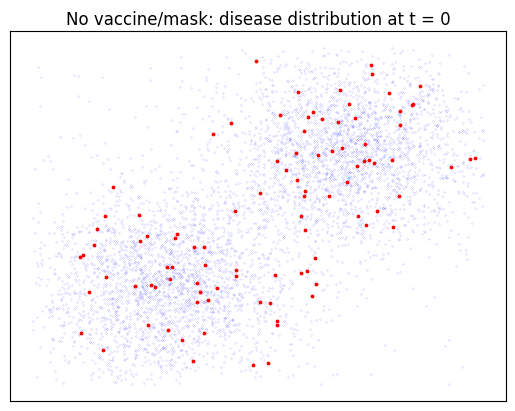

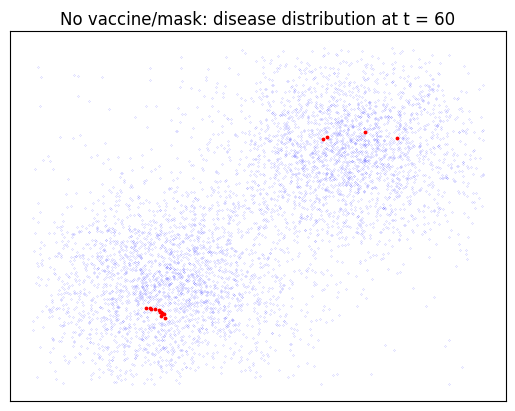

Time spent:  22.456714153289795 seconds
Time spent joining all neighbors:  5.571856737136841 seconds


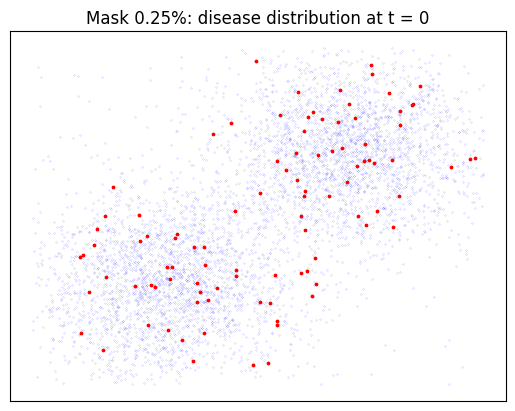

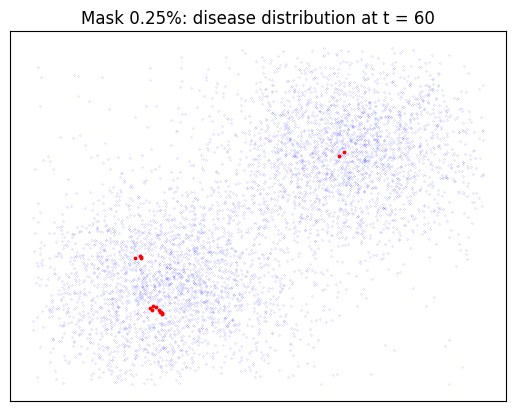

Time spent:  19.99850869178772 seconds
Time spent joining all neighbors:  6.0364720821380615 seconds


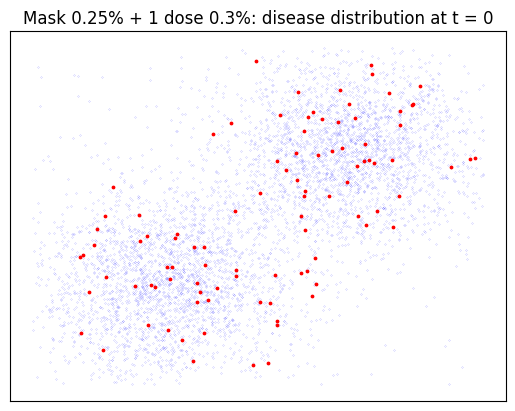

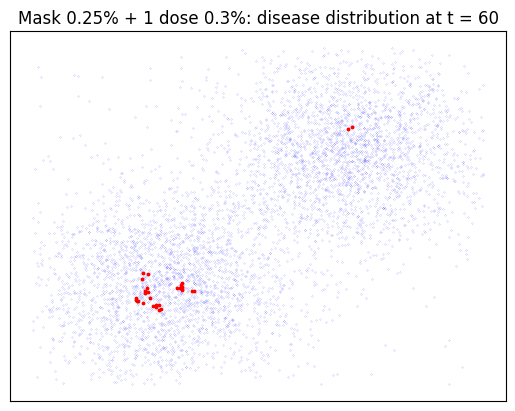

Time spent:  20.59657883644104 seconds
Time spent joining all neighbors:  5.3467888832092285 seconds


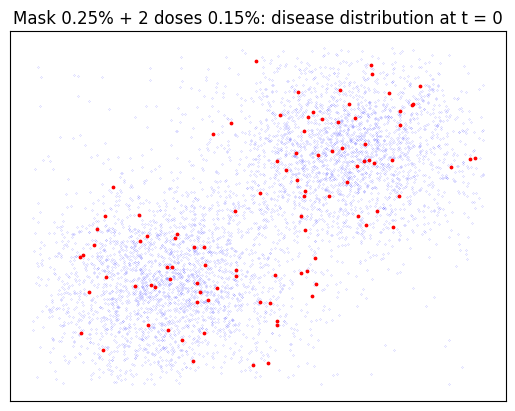

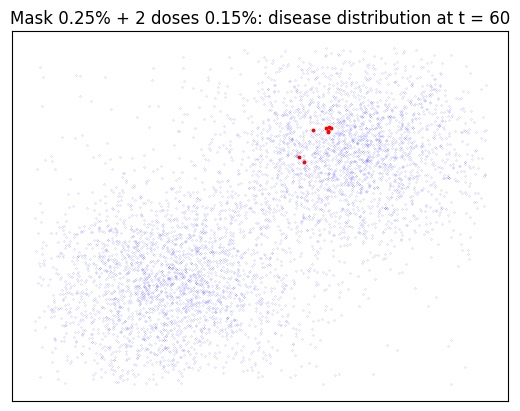

Time spent:  18.17504906654358 seconds


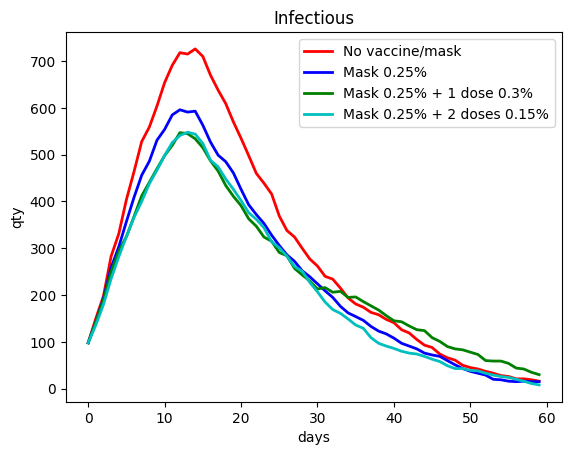

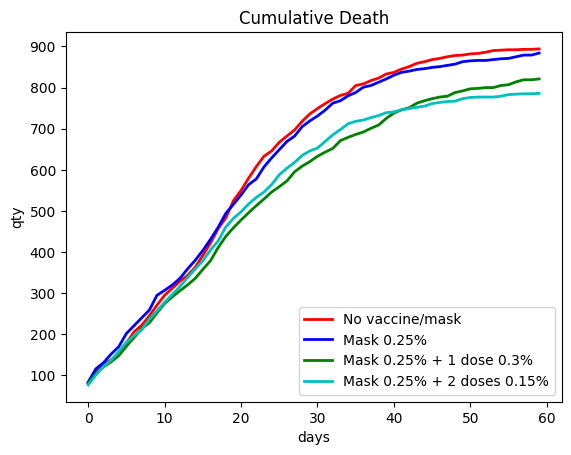

In [8]:

#  See run() above for more information.
#  This function runs multiple scenarios sequentially.
def run_multiple (seed = 1, days=60, period=1, mask_ratio = 0.25, vaccine_ratio = 0.3, initial_infected = 100):

    masked = (0, mask_ratio, mask_ratio, mask_ratio)
    dose1 = (0, 0, vaccine_ratio, 0)
    dose2 = (0, 0, 0, vaccine_ratio/2)

    note = ['No vaccine/mask',
            'Mask '+str(masked[1])+'%',
            'Mask '+str(masked[2])+'% + 1 dose '+str(vaccine_ratio)+'%',
            'Mask '+str(masked[3])+'% + 2 doses '+str(vaccine_ratio/2)+'%']

    trial1 = run (seed, days=days, masked=0, dose1=0, dose2=0, initial_infected = initial_infected, note=note[0], period=period, lower=1, upper=3)
    trial2 = run (seed, days=days, masked=masked[1], dose1=dose1[1], dose2=dose2[1], initial_infected = initial_infected, note=note[1], period=period, lower=1, upper=3)
    trial3 = run (seed, days=days, masked=masked[2], dose1=dose1[2], dose2=dose2[2], initial_infected = initial_infected, note=note[2], period=period, lower=1, upper=3)
    trial4 = run (seed, days=days, masked=masked[3], dose1=dose1[3], dose2=dose2[3], initial_infected = initial_infected, note=note[3], period=period, lower=1, upper=3)

    status = ['infected', 'death']
    legend_loc = ['upper right', 'lower right']
    title = ['Infectious', 'Cumulative Death']
    for i in range(2):
        #plt.figure(figsize=(17,5))
        plt.figure()
        plt.plot(range(days), trial1[status[i]], 'r-', lw=2, label='No vaccine/mask')
        plt.plot(range(days), trial2[status[i]], 'b-', lw=2, label=note[1])
        plt.plot(range(days), trial3[status[i]], 'g-', lw=2, label=note[2])
        plt.plot(range(days), trial4[status[i]], 'c-', lw=2, label=note[3])
        plt.legend(loc=legend_loc[i])
        plt.xlabel('days')
        plt.ylabel('qty')
        plt.title(title[i])
        plt.show

run_multiple (seed = 1, days=60, period=1000, mask_ratio = 0.25, vaccine_ratio = 0.3, initial_infected = 100)

In [9]:
# this function was used to run the scenario with 1-dose vs 2-doses.

def run_multiple_vaccination_only (seed = 1, days=60, period=1, mask_ratio = 0.25, vaccine_ratio = 0.3, initial_infected = 100):

    masked = (0, mask_ratio, mask_ratio, mask_ratio)
    dose1 = (0, 0, vaccine_ratio, 0)
    dose2 = (0, 0, 0, vaccine_ratio/2)

    note = ['No vaccine/mask',
            'Mask '+str(masked[1])+'%',
            'Mask '+str(masked[2])+'% + 1 dose '+str(vaccine_ratio)+'%',
            'Mask '+str(masked[3])+'% + 2 doses '+str(vaccine_ratio/2)+'%']

#     trial1 = run (seed, days=days, masked=0, dose1=0, dose2=0, initial_infected = initial_infected, note=note[0], period=period, lower=1, upper=3)
#     trial2 = run (seed, days=days, masked=masked[1], dose1=dose1[1], dose2=dose2[1], initial_infected = initial_infected, note=note[1], period=period, lower=1, upper=3)
    trial3 = run (seed, days=days, masked=masked[2], dose1=dose1[2], dose2=dose2[2], initial_infected = initial_infected, note=note[2], period=period, lower=1, upper=3)
    trial4 = run (seed, days=days, masked=masked[3], dose1=dose1[3], dose2=dose2[3], initial_infected = initial_infected, note=note[3], period=period, lower=1, upper=3)

    status = ['infected', 'death']
    legend_loc = ['upper right', 'lower right']
    title = ['Infectious', 'Cumulative Death']
    for i in range(2):
        #plt.figure(figsize=(17,5))
        plt.figure()
#         plt.plot(range(days), trial1[status[i]], 'r-', lw=2, label='No vaccine/mask')
#         plt.plot(range(days), trial2[status[i]], 'b-', lw=2, label=note[1])
        plt.plot(range(days), trial3[status[i]], 'g-', lw=2, label=note[2])
        plt.plot(range(days), trial4[status[i]], 'c-', lw=2, label=note[3])
        plt.legend(loc=legend_loc[i])
        plt.xlabel('days')
        plt.ylabel('qty')
        plt.title(title[i])
        plt.show
    return (trial3, trial4)
# run_multiple (seed = 1, days=60, period=1000, mask_ratio = 0.25, vaccine_ratio = 0.3, initial_infected = 100)

In [10]:

# this function runs the simulation with the base case (unprotected, no mask, no vaccine) and also with mask

def run_unprotected_and_masked_only (seed = 1, days=60, period=1, mask_ratio = 0.25, vaccine_ratio = 0.3, initial_infected = 100):

    masked = (0, mask_ratio, mask_ratio, mask_ratio)
    dose1 = (0, 0, vaccine_ratio, 0)
    dose2 = (0, 0, 0, vaccine_ratio/2)

    note = ['No vaccine/mask',
            'Mask '+str(masked[1])+'%',
            'Mask '+str(masked[2])+'% + 1 dose '+str(vaccine_ratio)+'%',
            'Mask '+str(masked[3])+'% + 2 doses '+str(vaccine_ratio/2)+'%']

    trial1 = run (seed, days=days, masked=0, dose1=0, dose2=0, initial_infected = initial_infected, note=note[0], period=period, lower=1, upper=3)
    trial2 = run (seed, days=days, masked=masked[1], dose1=dose1[1], dose2=dose2[1], initial_infected = initial_infected, note=note[1], period=period, lower=1, upper=3)
#     trial3 = run (seed, days=days, masked=masked[2], dose1=dose1[2], dose2=dose2[2], initial_infected = initial_infected, note=note[2], period=period, lower=1, upper=3)
#     trial4 = run (seed, days=days, masked=masked[3], dose1=dose1[3], dose2=dose2[3], initial_infected = initial_infected, note=note[3], period=period, lower=1, upper=3)

    status = ['infected', 'death']
    legend_loc = ['upper right', 'lower right']
    title = ['Infectious', 'Cumulative Death']
    for i in range(2):
        #plt.figure(figsize=(17,5))
        plt.figure()
        plt.plot(range(days), trial1[status[i]], 'r-', lw=2, label='No vaccine/mask')
        plt.plot(range(days), trial2[status[i]], 'b-', lw=2, label=note[1])
#         plt.plot(range(days), trial3[status[i]], 'g-', lw=2, label=note[2])
#         plt.plot(range(days), trial4[status[i]], 'c-', lw=2, label=note[3])
        plt.legend(loc=legend_loc[i])
        plt.xlabel('days')
        plt.ylabel('qty')
        plt.title(title[i])
        plt.show
    return (trial1, trial2)
# run_multiple (seed = 1, days=60, period=1000, mask_ratio = 0.25, vaccine_ratio = 0.3, initial_infected = 100)

Time spent joining all neighbors:  6.107419013977051 seconds


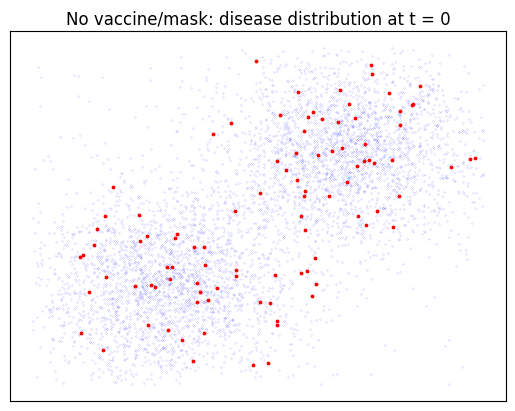

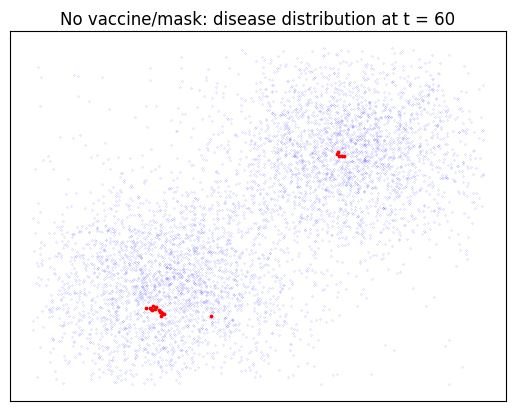

Time spent:  19.851664543151855 seconds
Time spent joining all neighbors:  5.861735820770264 seconds


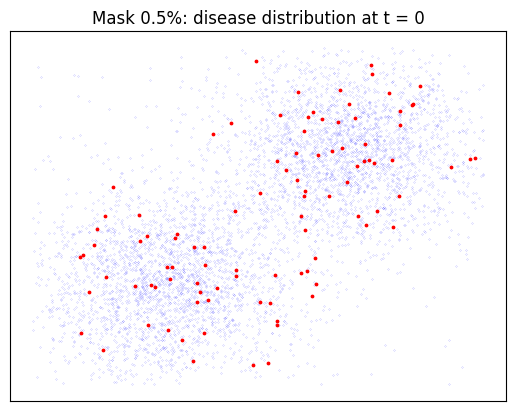

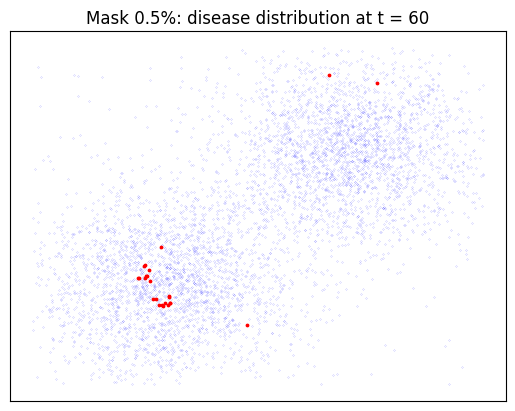

Time spent:  18.9591166973114 seconds
Time spent joining all neighbors:  5.482002019882202 seconds


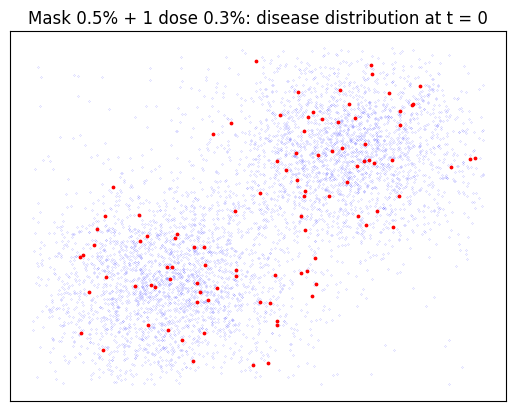

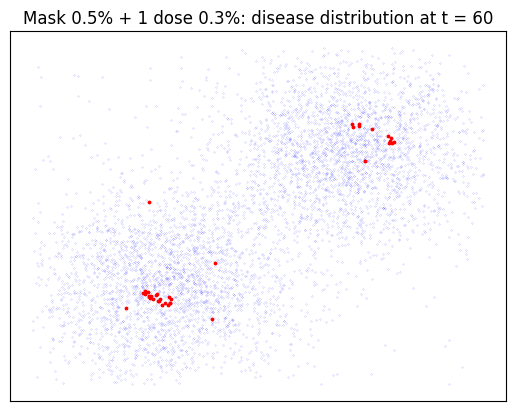

Time spent:  15.547374725341797 seconds
Time spent joining all neighbors:  5.335235595703125 seconds


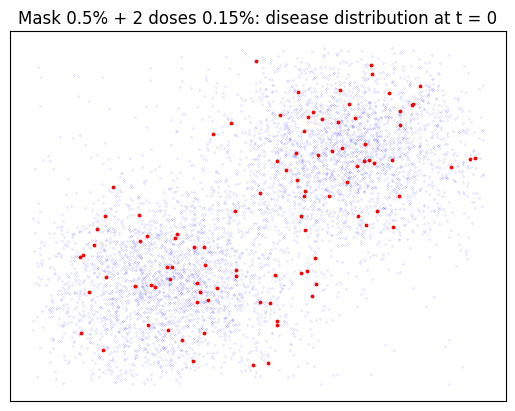

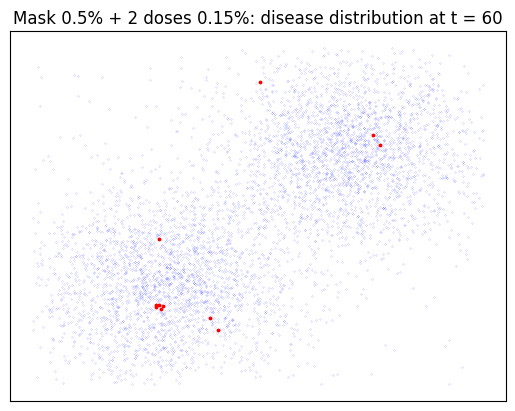

Time spent:  15.649070262908936 seconds


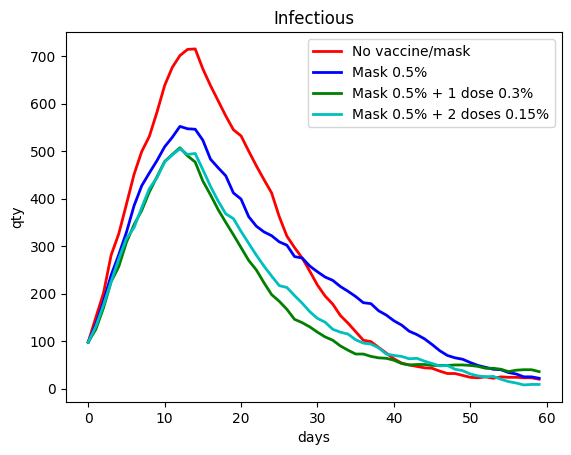

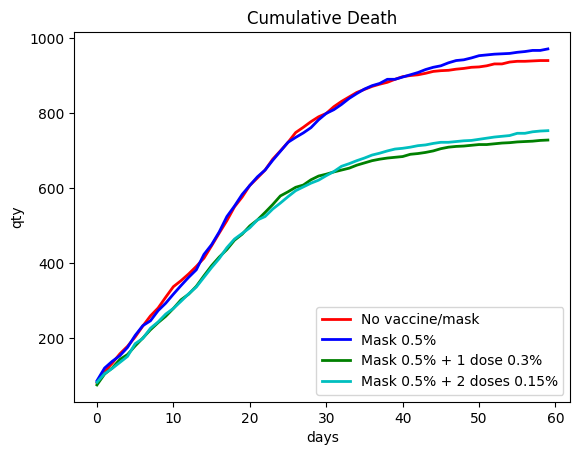

In [11]:
run_multiple (seed = 1, days=60, period=1, mask_ratio = 0.50, vaccine_ratio = 0.3, initial_infected = 100)

trial # 0
Time spent joining all neighbors:  6.108884572982788 seconds


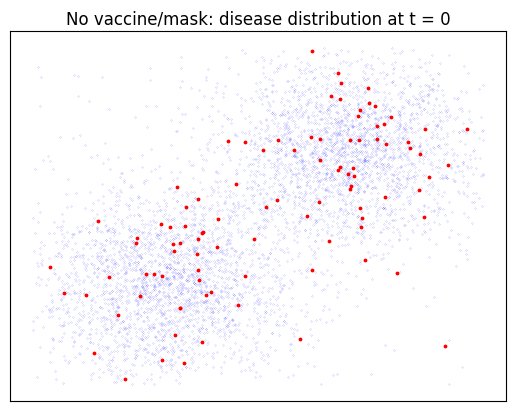

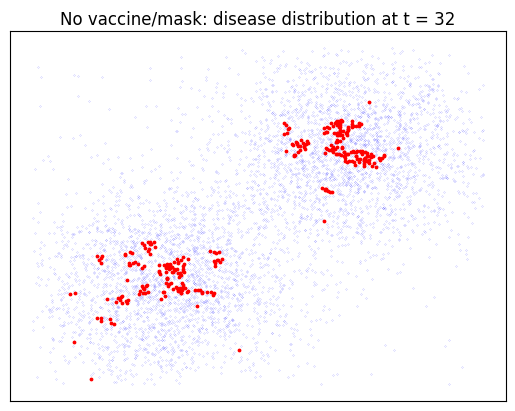

Time spent:  17.559767484664917 seconds
Time spent joining all neighbors:  5.592665910720825 seconds


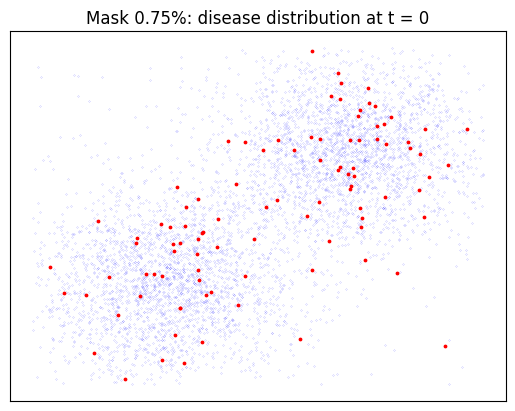

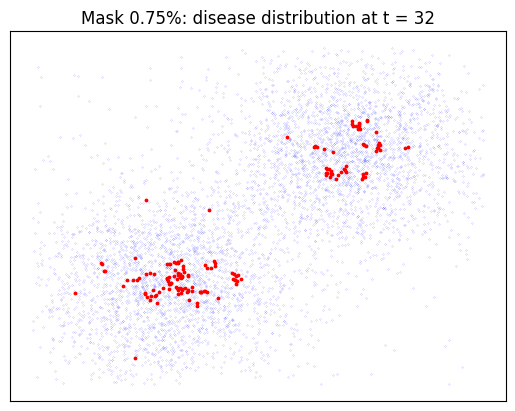

Time spent:  11.80613899230957 seconds
Time spent joining all neighbors:  6.057283878326416 seconds


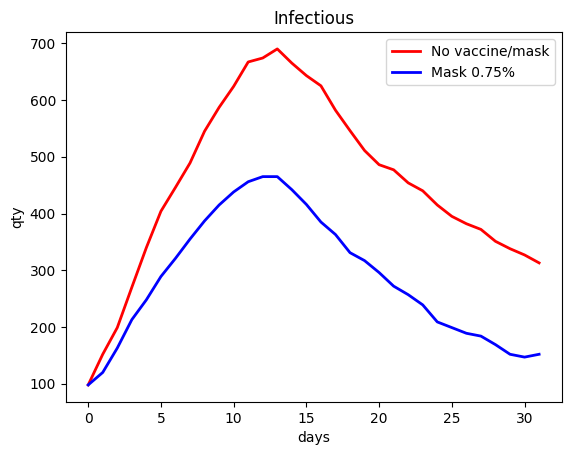

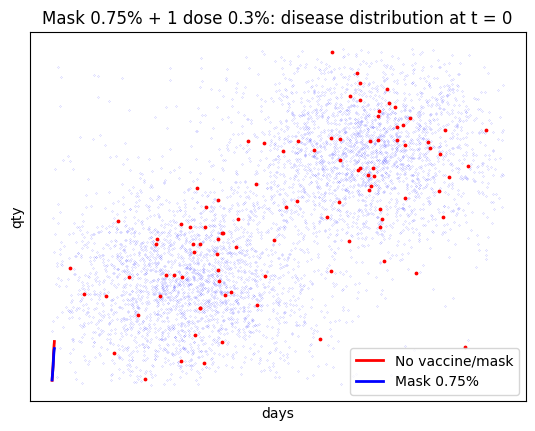

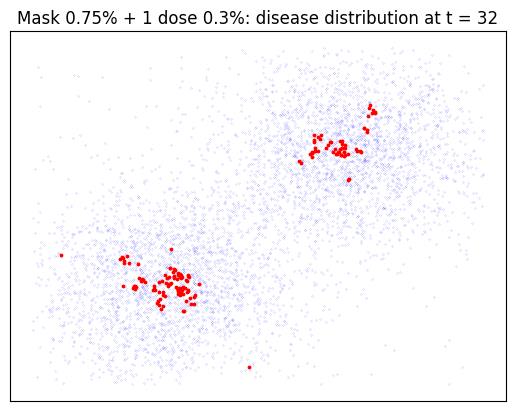

Time spent:  11.643833637237549 seconds
Time spent joining all neighbors:  5.224406003952026 seconds


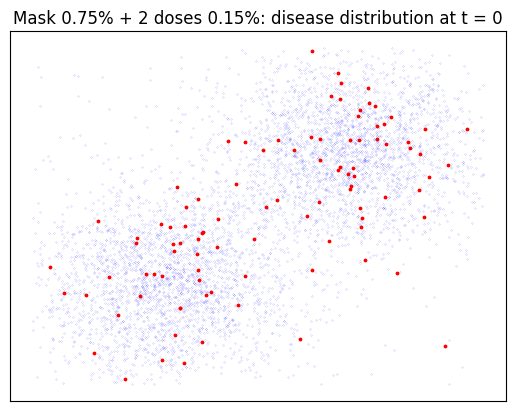

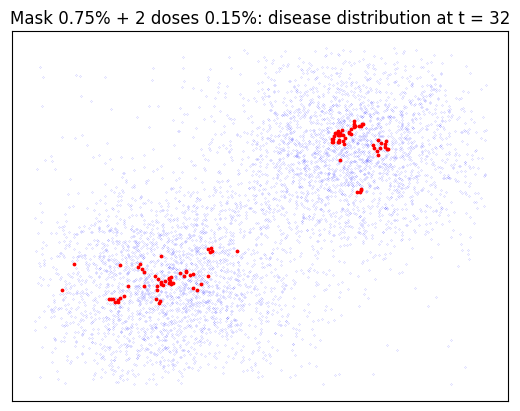

Time spent:  10.918410778045654 seconds
trial # 1
Time spent joining all neighbors:  5.284953355789185 seconds


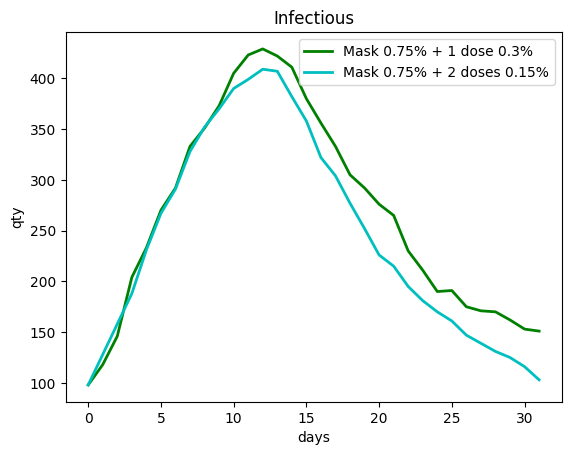

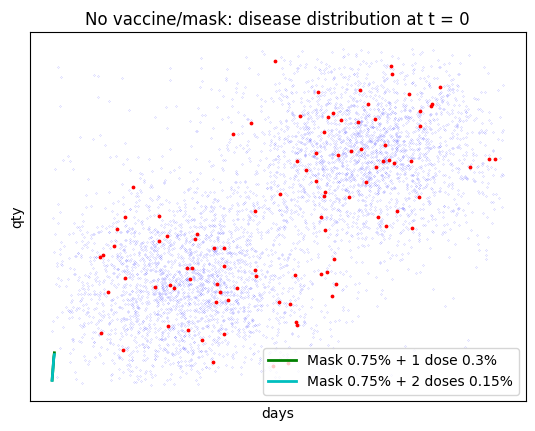

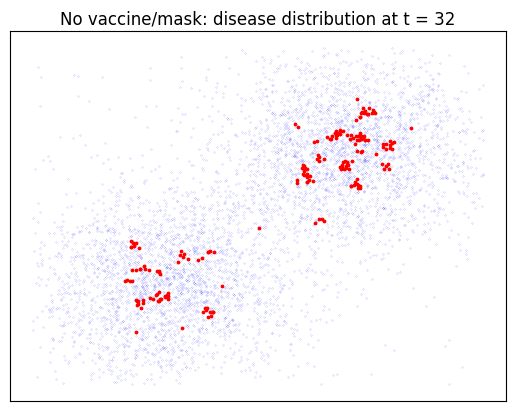

Time spent:  18.303161144256592 seconds
Time spent joining all neighbors:  5.209909915924072 seconds


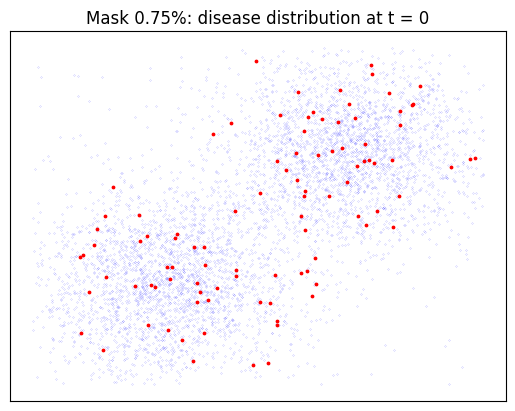

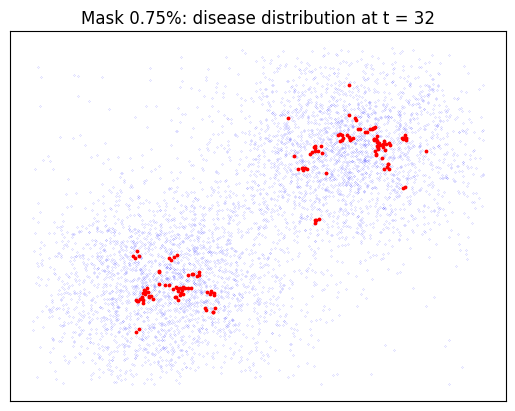

Time spent:  12.301971673965454 seconds
Time spent joining all neighbors:  6.101405143737793 seconds


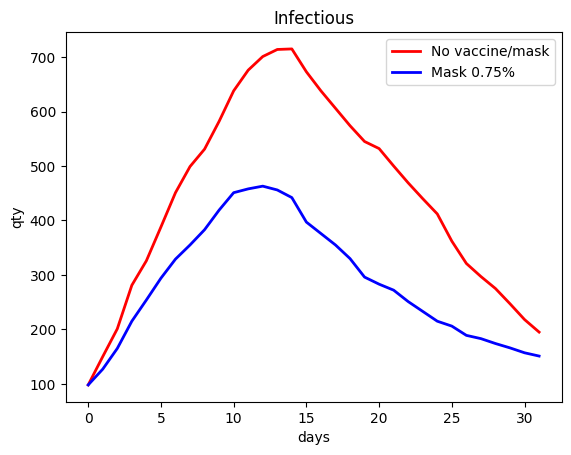

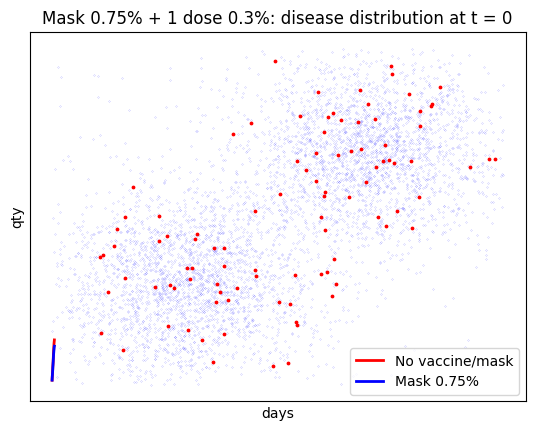

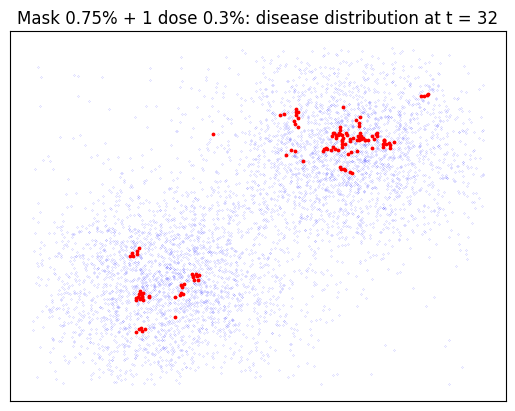

Time spent:  12.018970489501953 seconds
Time spent joining all neighbors:  6.170691251754761 seconds


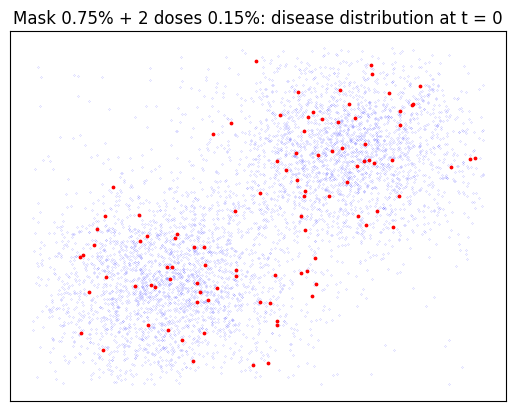

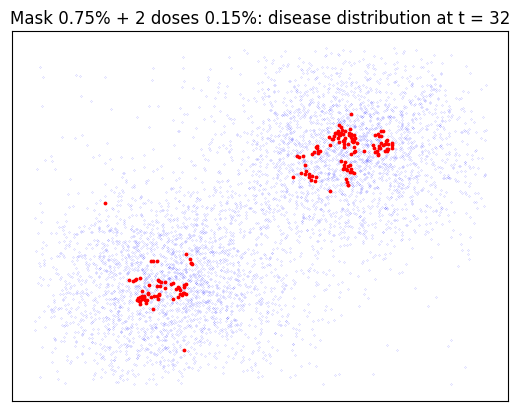

Time spent:  14.763774394989014 seconds
trial # 2
Time spent joining all neighbors:  6.10144829750061 seconds


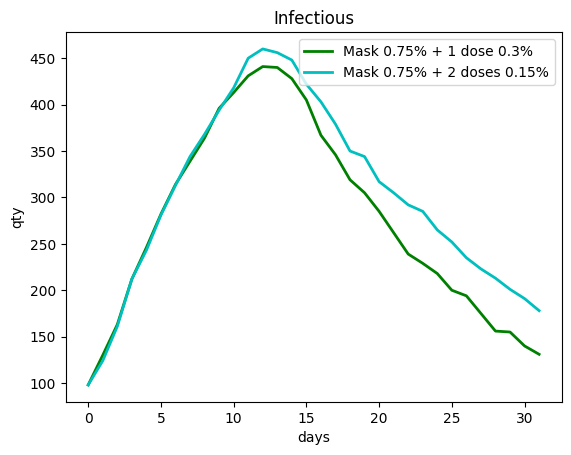

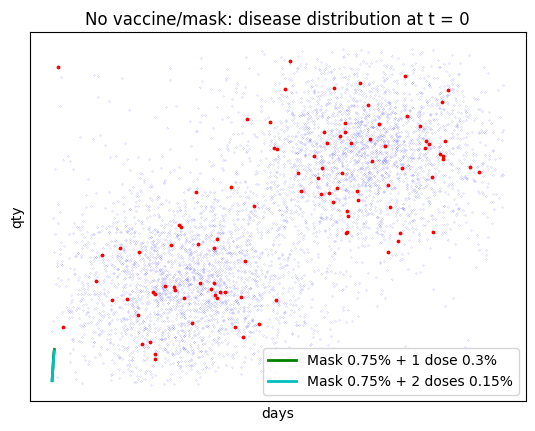

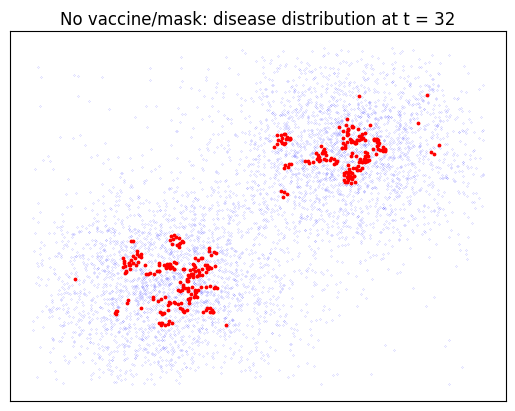

Time spent:  21.714312314987183 seconds
Time spent joining all neighbors:  6.1165385246276855 seconds


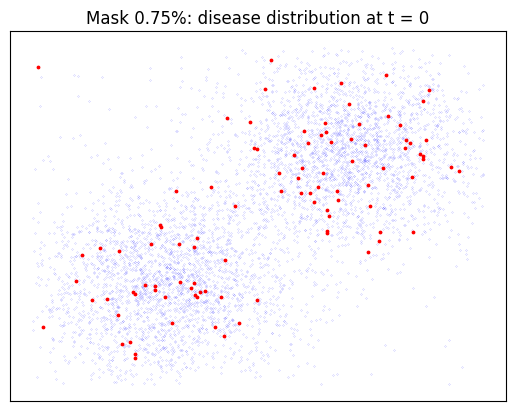

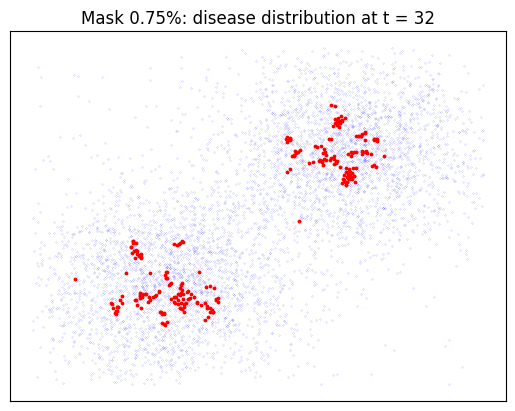

Time spent:  16.449354648590088 seconds
Time spent joining all neighbors:  5.526966094970703 seconds


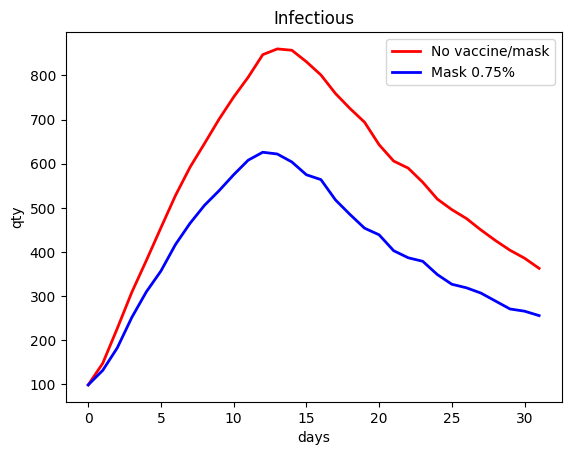

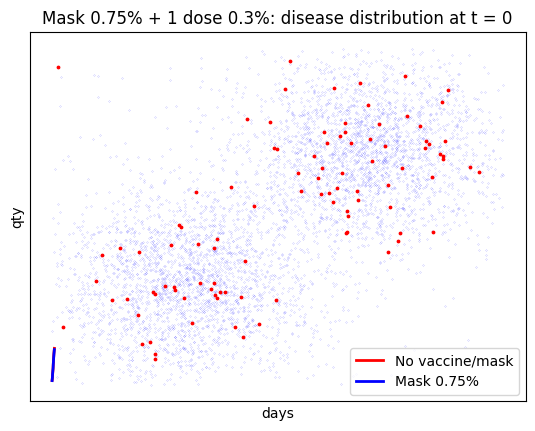

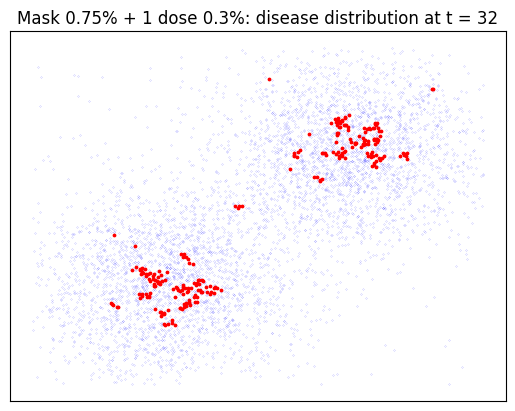

Time spent:  15.753410816192627 seconds
Time spent joining all neighbors:  5.31583833694458 seconds


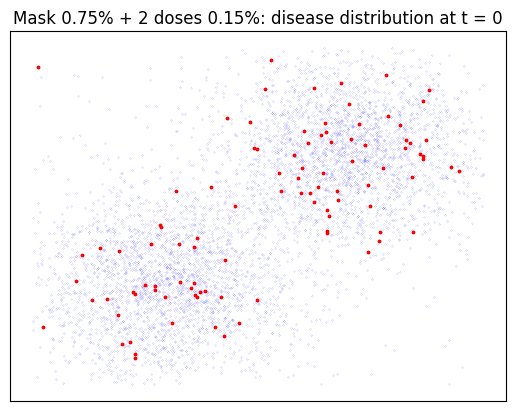

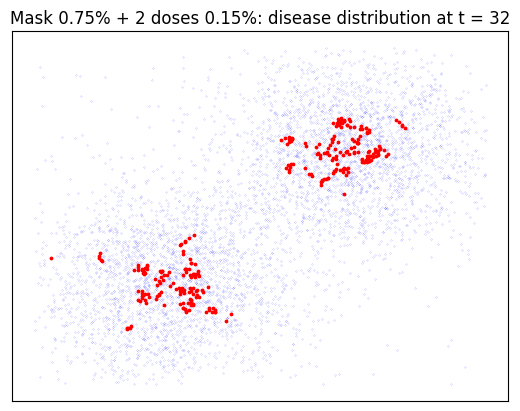

Time spent:  16.406649589538574 seconds
trial # 3
Time spent joining all neighbors:  6.092950344085693 seconds


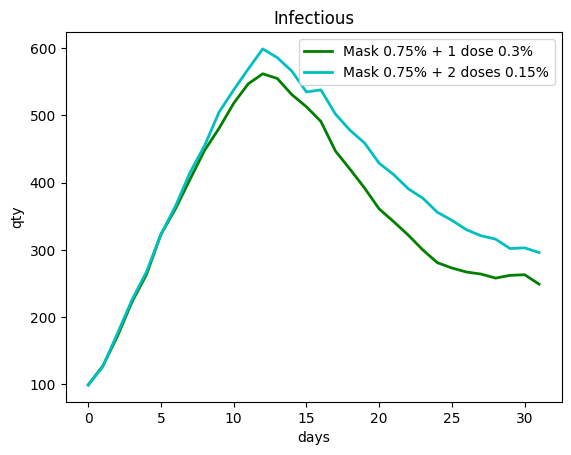

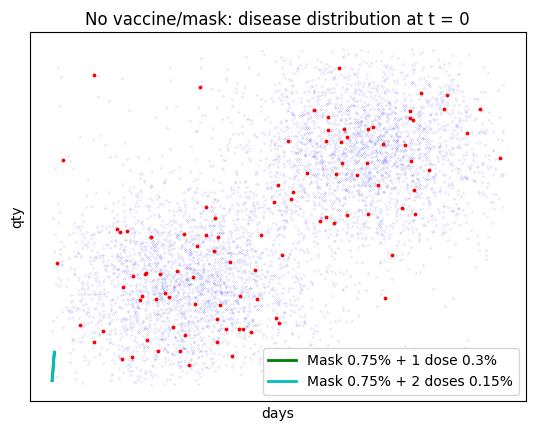

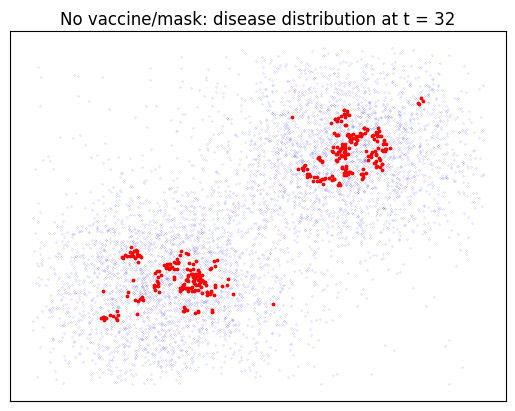

Time spent:  18.522714853286743 seconds
Time spent joining all neighbors:  6.177575588226318 seconds


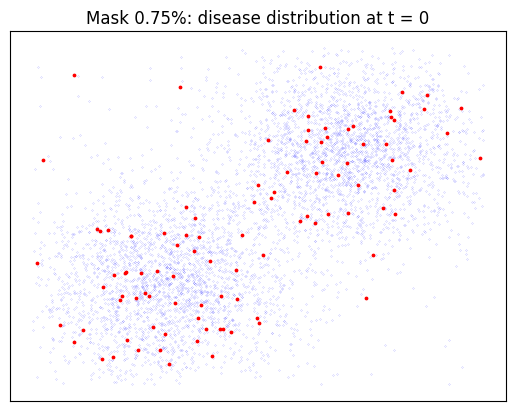

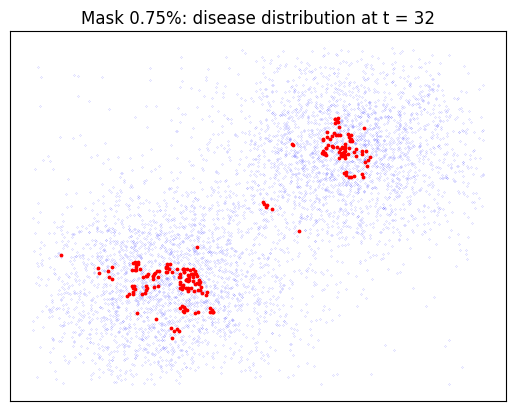

Time spent:  13.08000898361206 seconds
Time spent joining all neighbors:  5.396404027938843 seconds


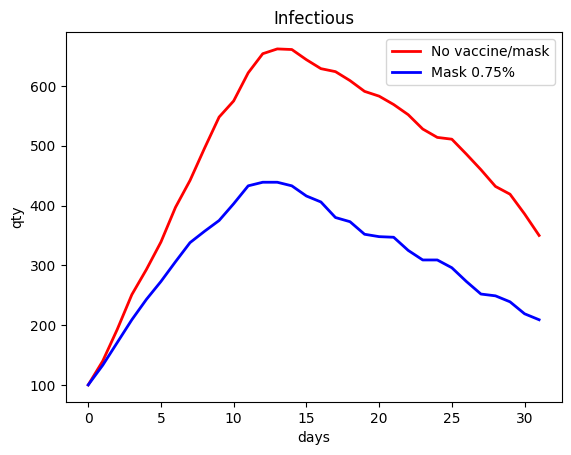

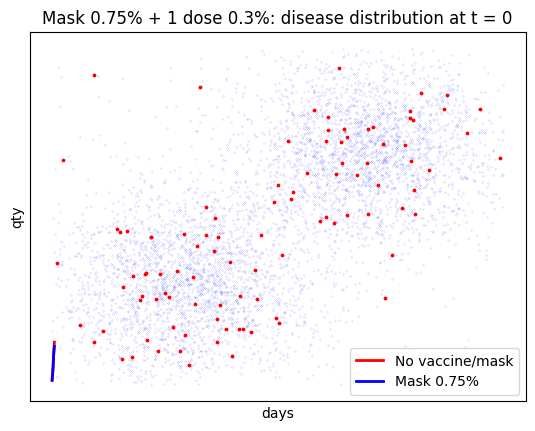

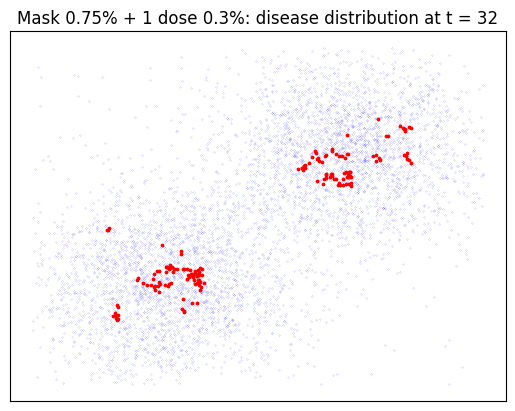

Time spent:  13.012706995010376 seconds
Time spent joining all neighbors:  6.077019929885864 seconds


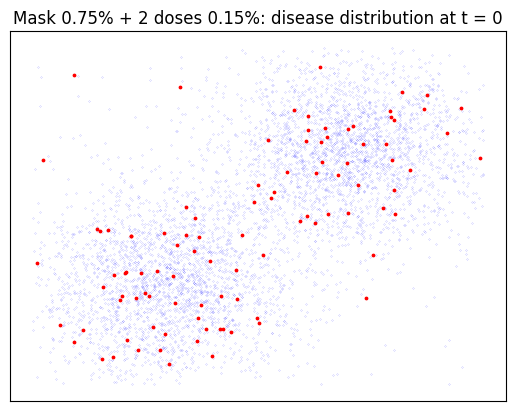

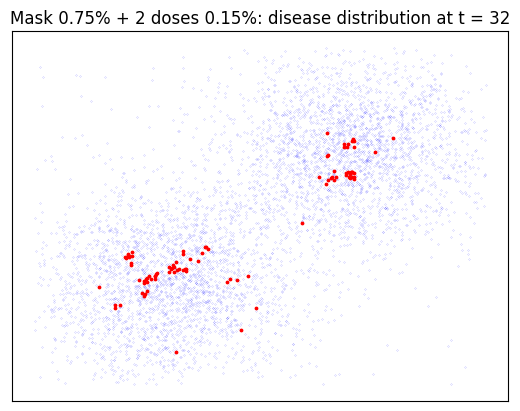

Time spent:  9.838577270507812 seconds
trial # 4
Time spent joining all neighbors:  6.149330377578735 seconds


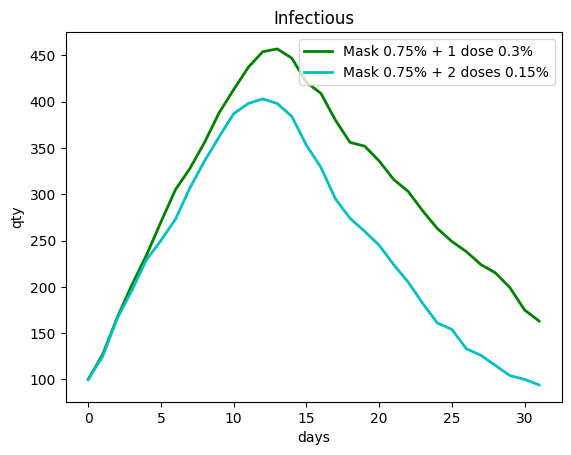

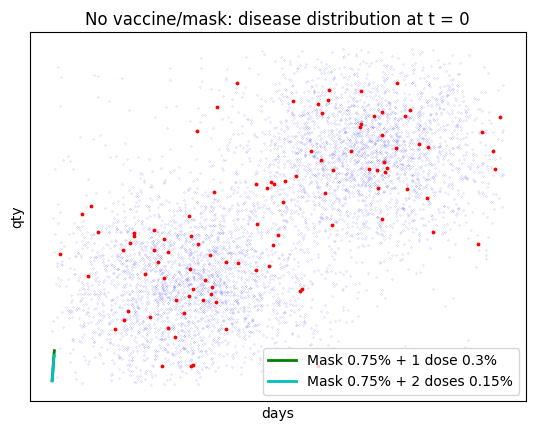

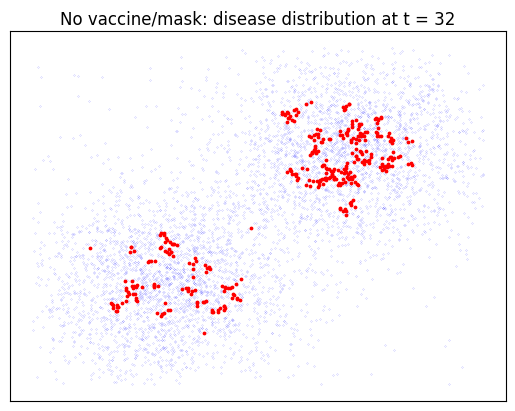

Time spent:  29.24013900756836 seconds
Time spent joining all neighbors:  11.153449773788452 seconds


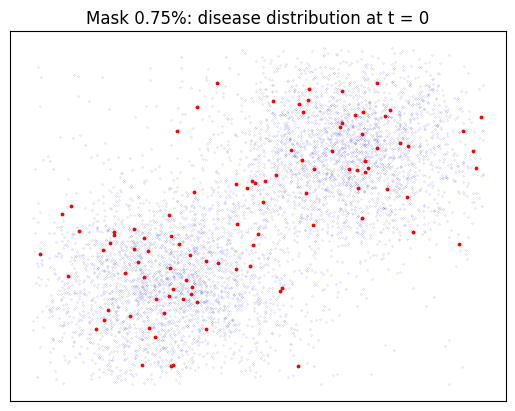

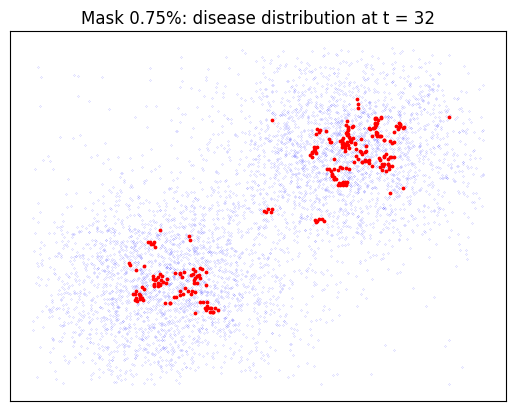

Time spent:  17.085371494293213 seconds
Time spent joining all neighbors:  6.1236279010772705 seconds


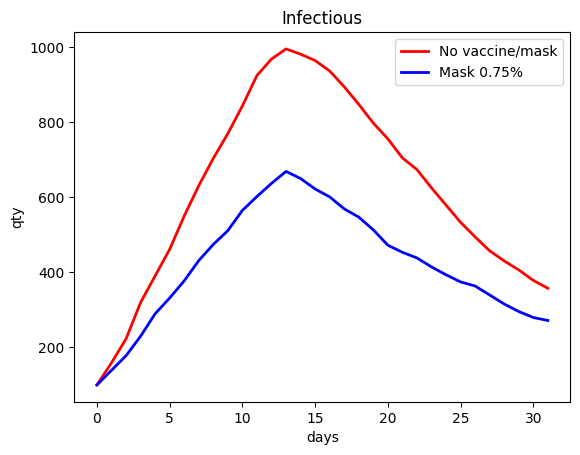

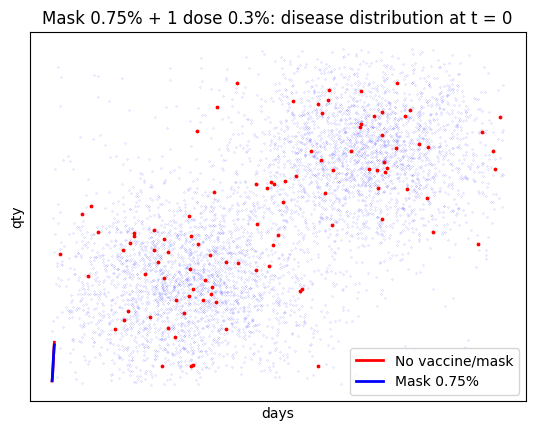

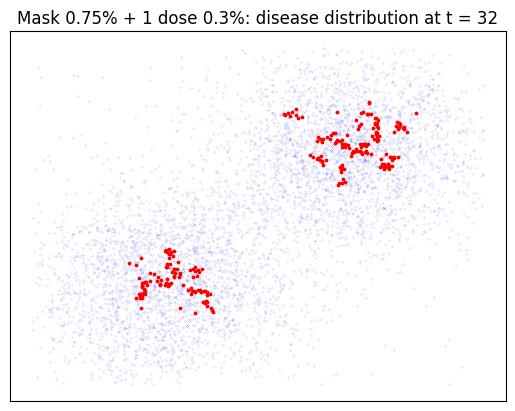

Time spent:  15.809733152389526 seconds
Time spent joining all neighbors:  5.290282487869263 seconds


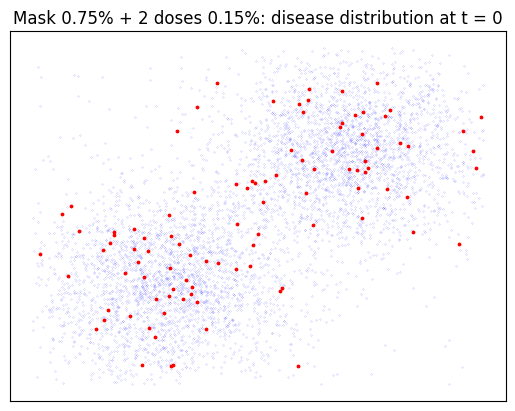

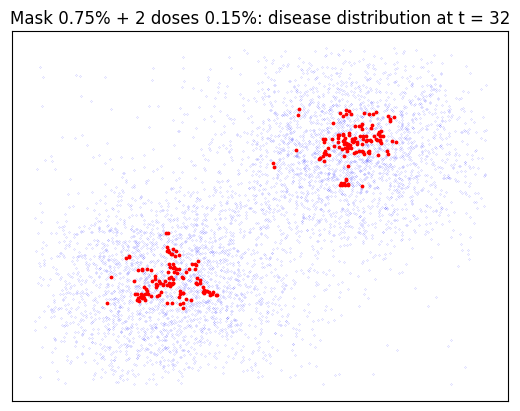

Time spent:  16.23314929008484 seconds
trial # 5
Time spent joining all neighbors:  5.65135931968689 seconds


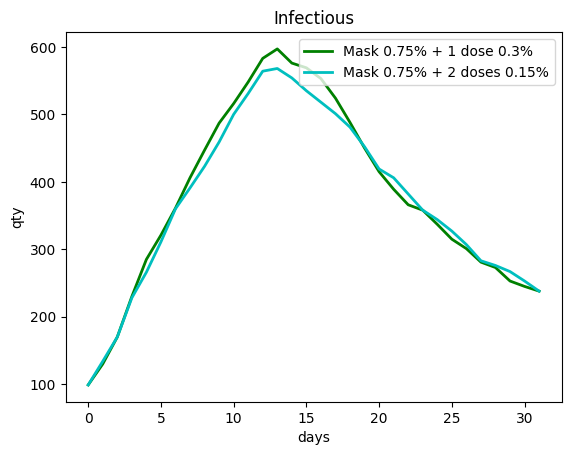

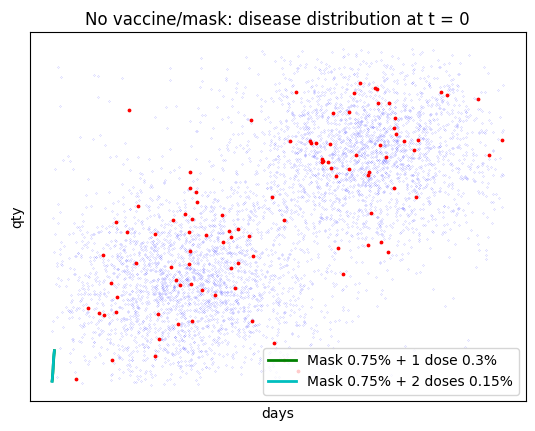

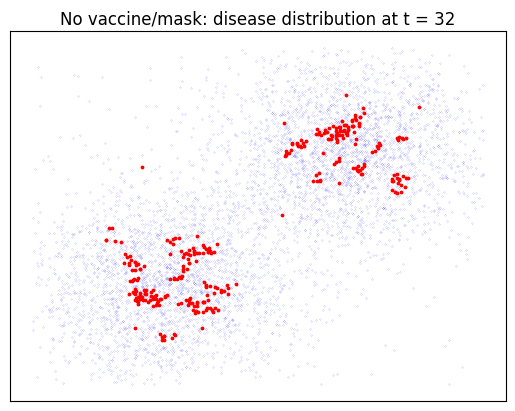

Time spent:  21.765130758285522 seconds
Time spent joining all neighbors:  5.381857633590698 seconds


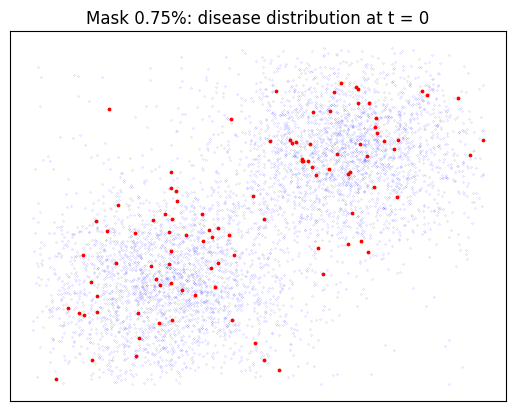

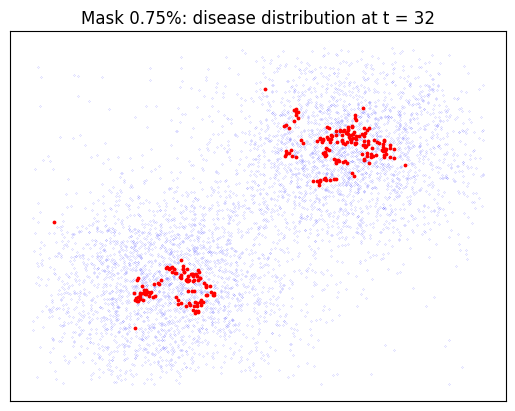

Time spent:  14.73384404182434 seconds
Time spent joining all neighbors:  7.608099460601807 seconds


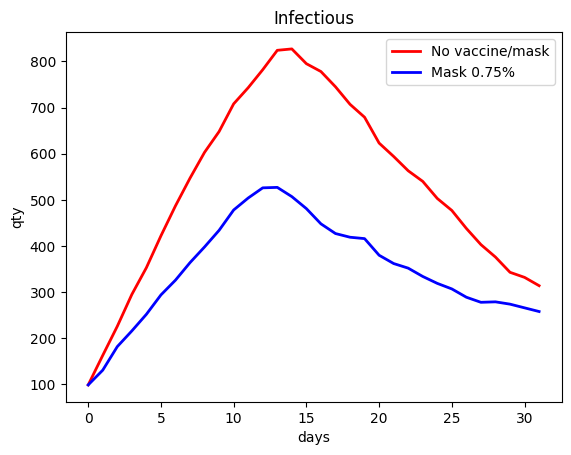

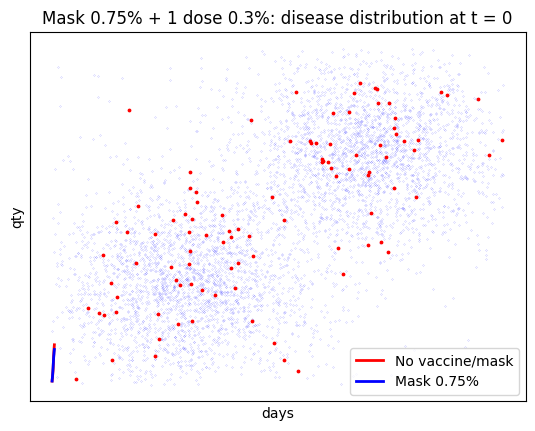

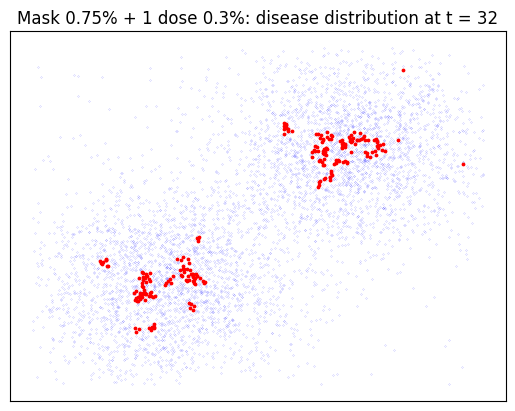

Time spent:  13.124792337417603 seconds
Time spent joining all neighbors:  5.55205512046814 seconds


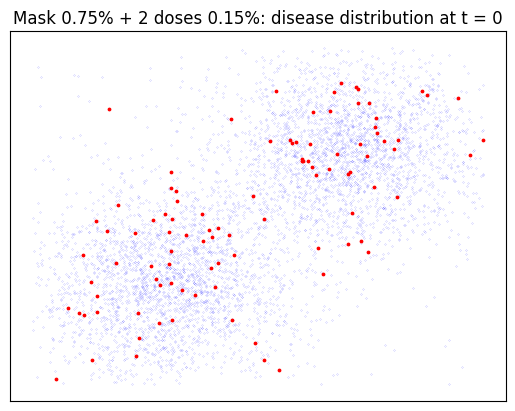

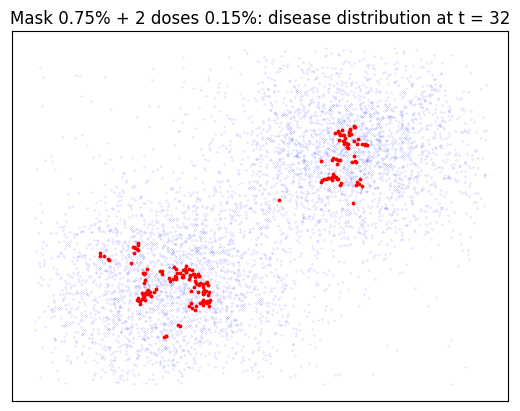

Time spent:  13.238927125930786 seconds
trial # 6
Time spent joining all neighbors:  6.15157675743103 seconds


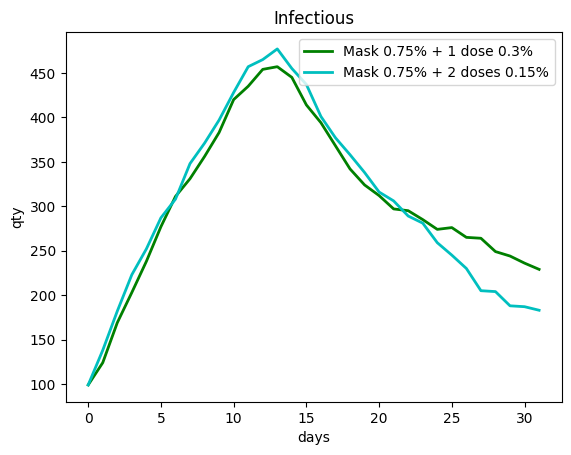

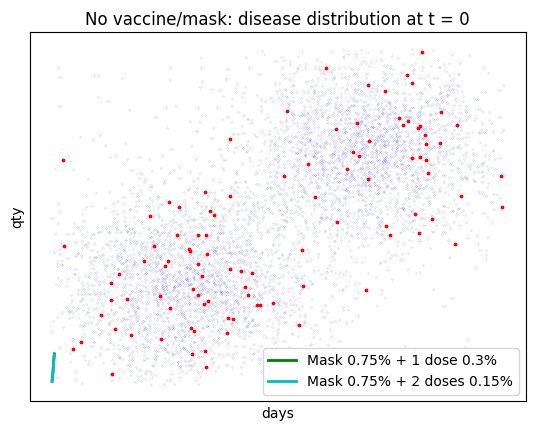

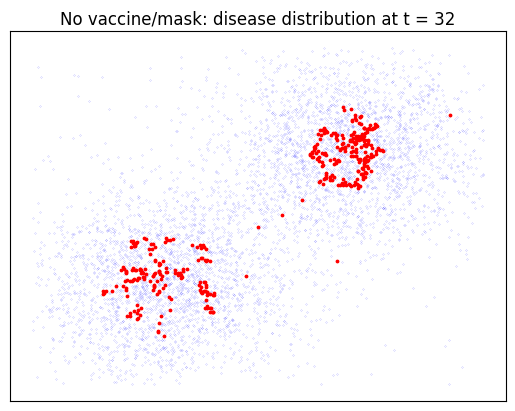

Time spent:  21.03614830970764 seconds
Time spent joining all neighbors:  6.169125556945801 seconds


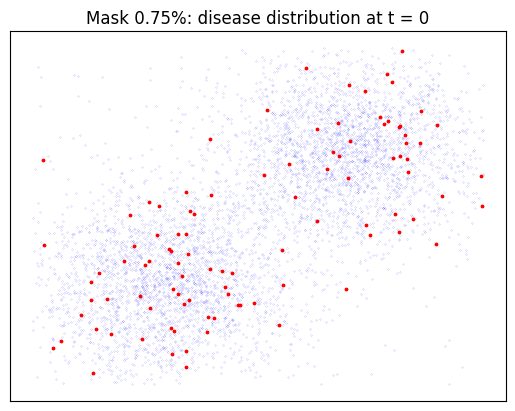

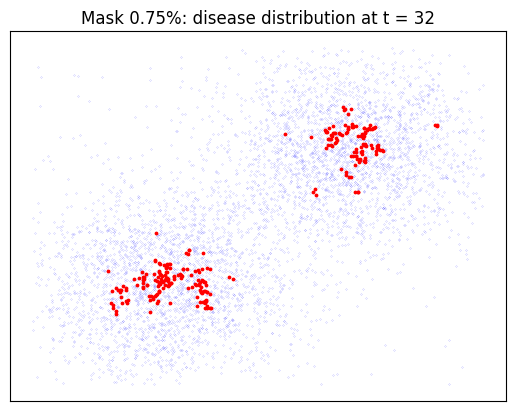

Time spent:  15.175393342971802 seconds
Time spent joining all neighbors:  5.254455089569092 seconds


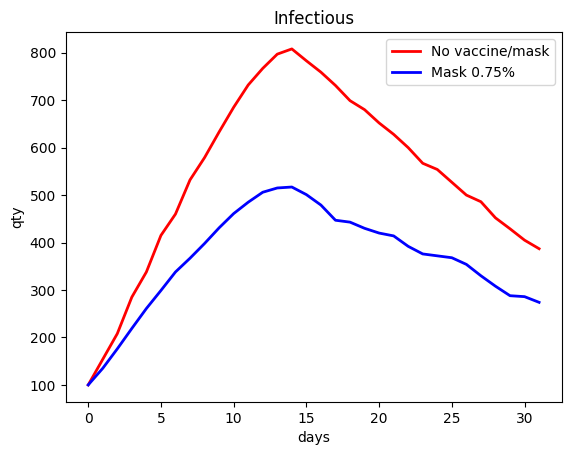

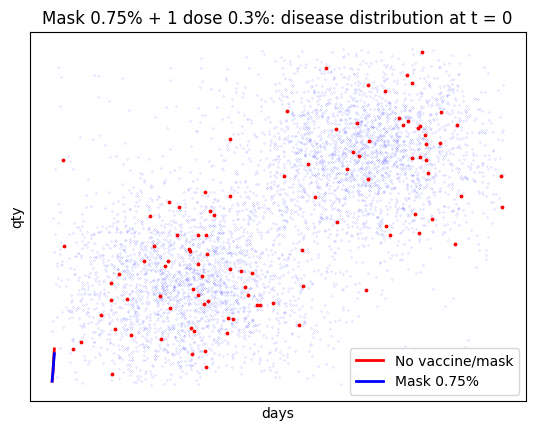

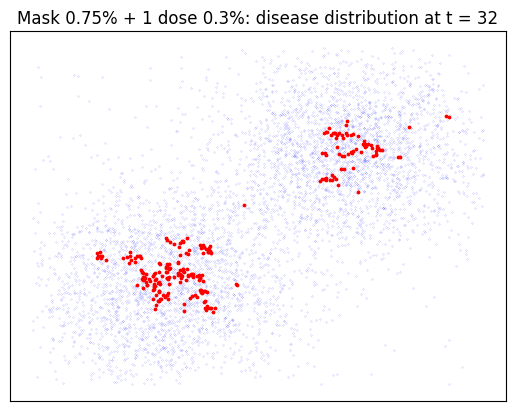

Time spent:  14.642025232315063 seconds
Time spent joining all neighbors:  5.906010150909424 seconds


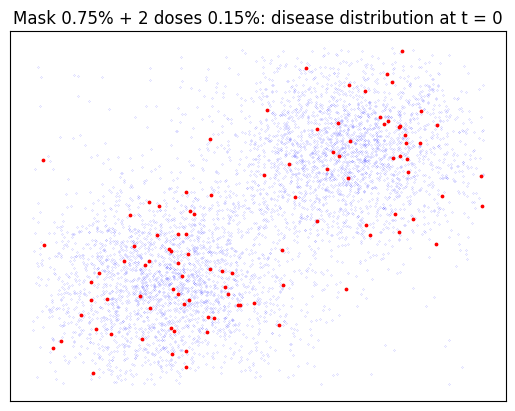

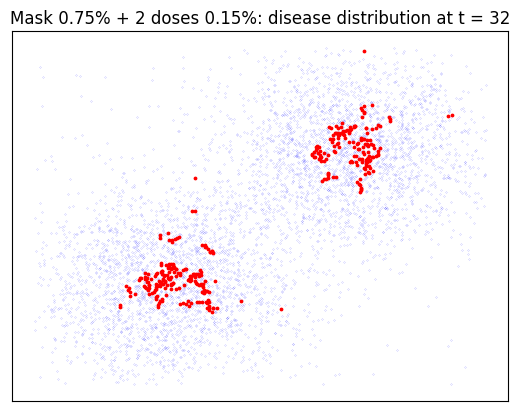

Time spent:  14.969064950942993 seconds
trial # 7
Time spent joining all neighbors:  5.885042190551758 seconds


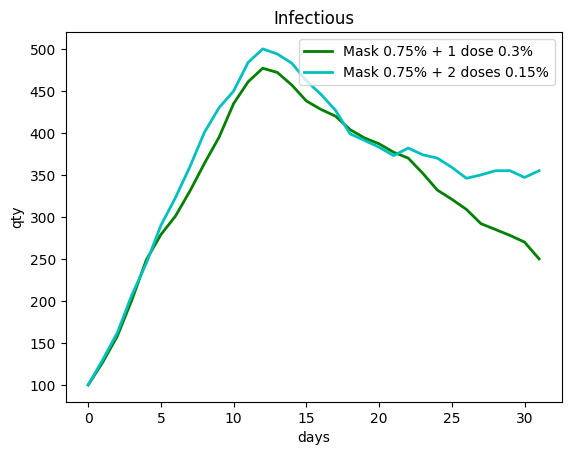

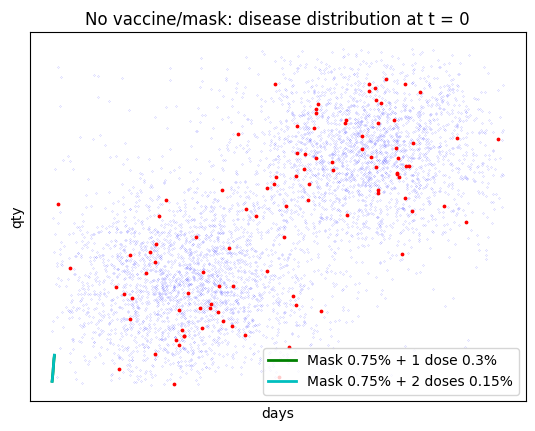

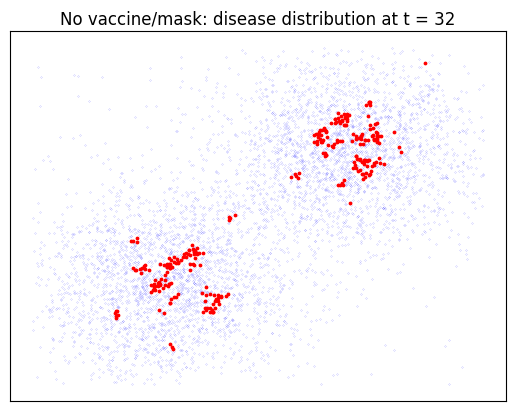

Time spent:  17.71248149871826 seconds
Time spent joining all neighbors:  5.416207551956177 seconds


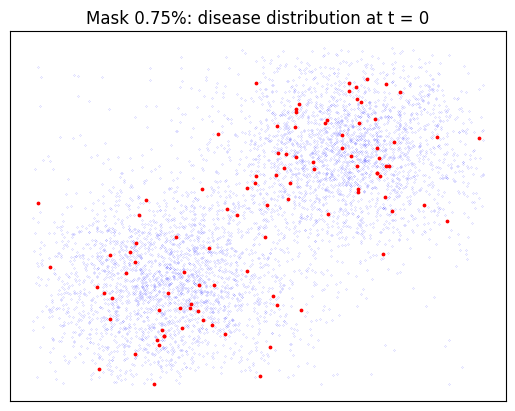

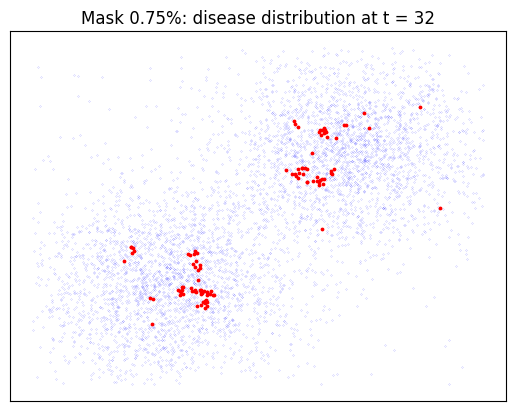

Time spent:  11.148355960845947 seconds
Time spent joining all neighbors:  6.14314603805542 seconds


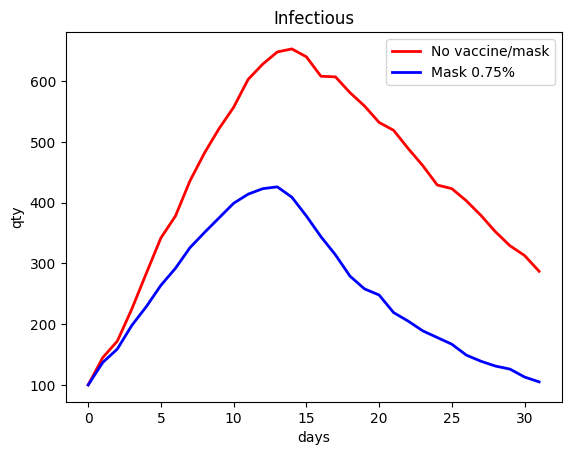

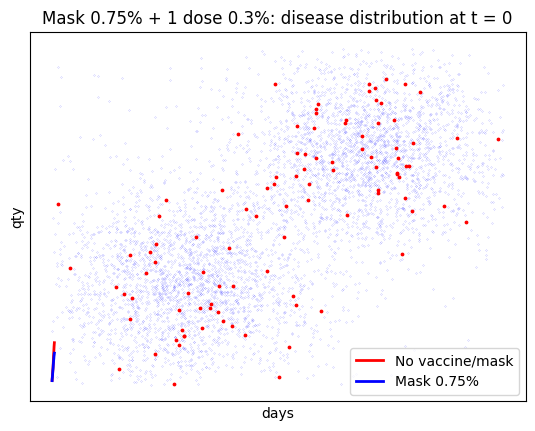

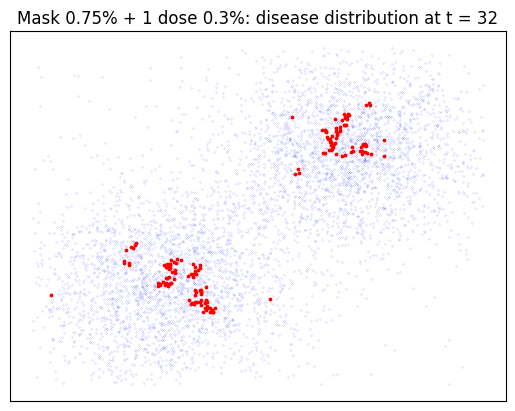

Time spent:  11.206873893737793 seconds
Time spent joining all neighbors:  5.7872865200042725 seconds


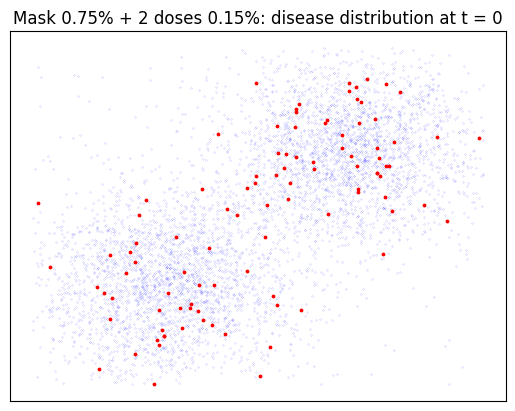

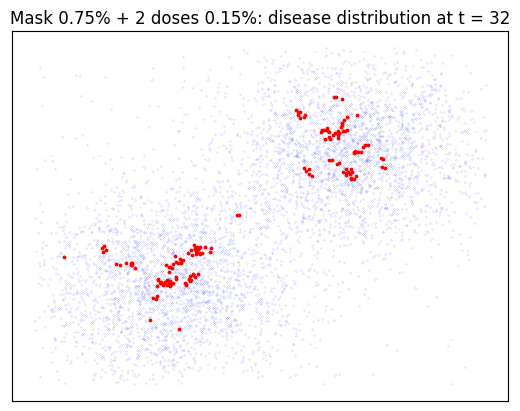

Time spent:  11.514507055282593 seconds
trial # 8
Time spent joining all neighbors:  5.4222986698150635 seconds


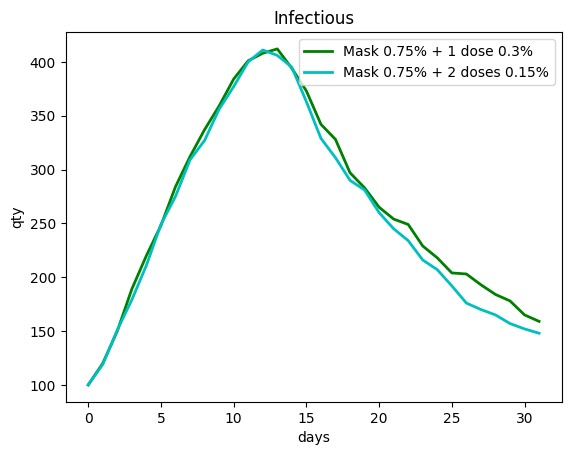

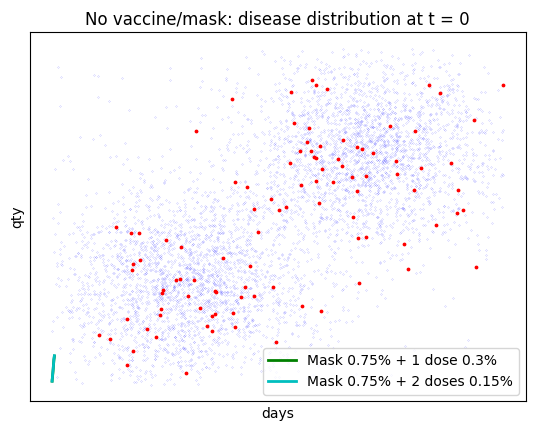

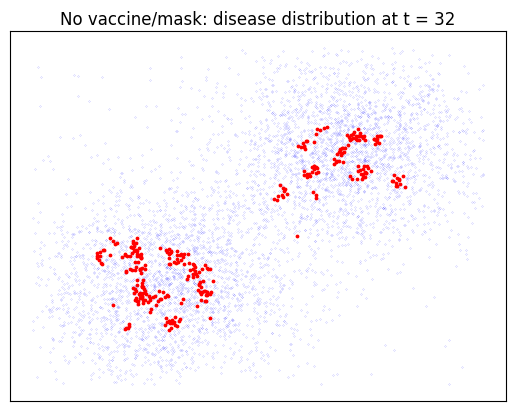

Time spent:  22.210980892181396 seconds
Time spent joining all neighbors:  5.5576417446136475 seconds


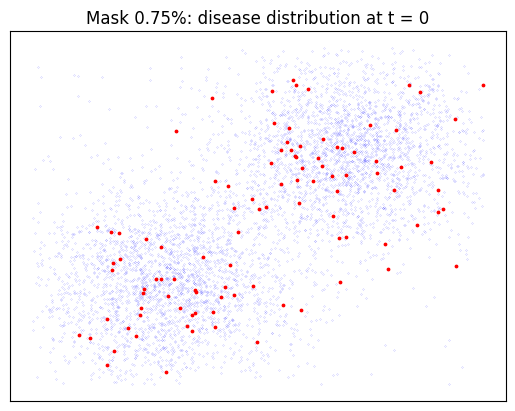

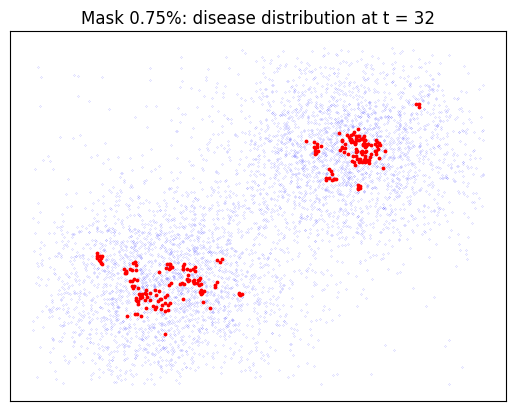

Time spent:  16.638397216796875 seconds
Time spent joining all neighbors:  5.342090129852295 seconds


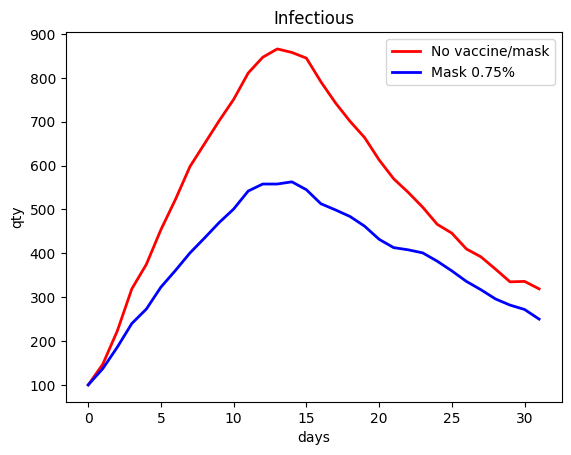

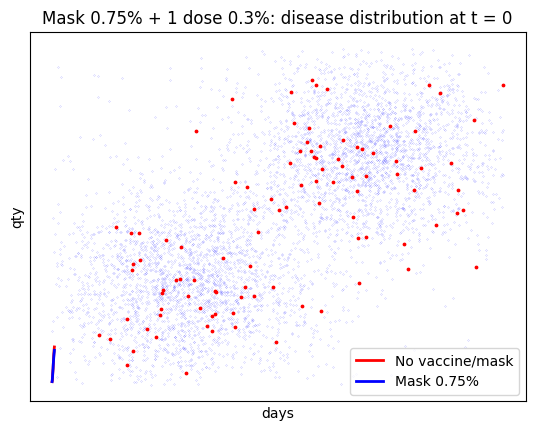

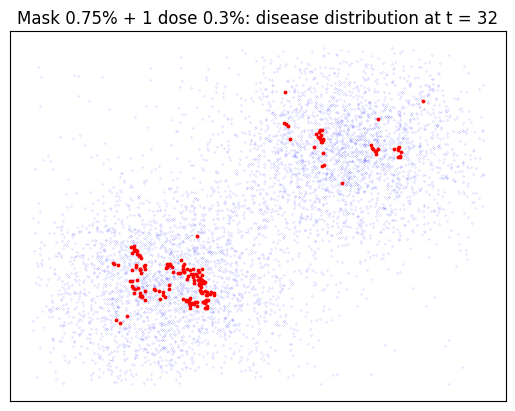

Time spent:  14.228325843811035 seconds
Time spent joining all neighbors:  6.211517333984375 seconds


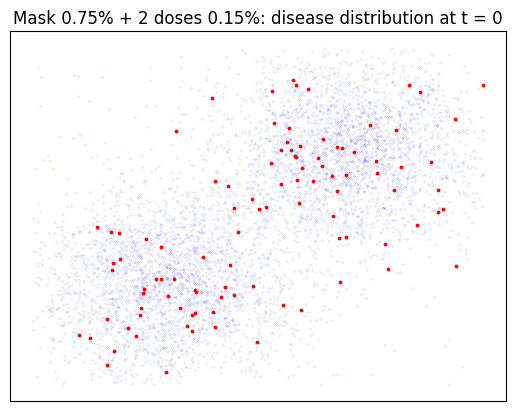

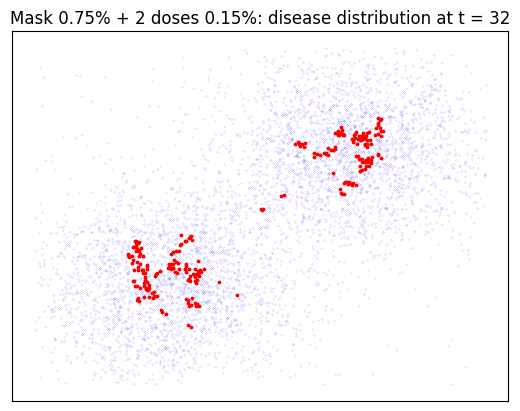

Time spent:  15.845245122909546 seconds
trial # 9
Time spent joining all neighbors:  5.4430577754974365 seconds


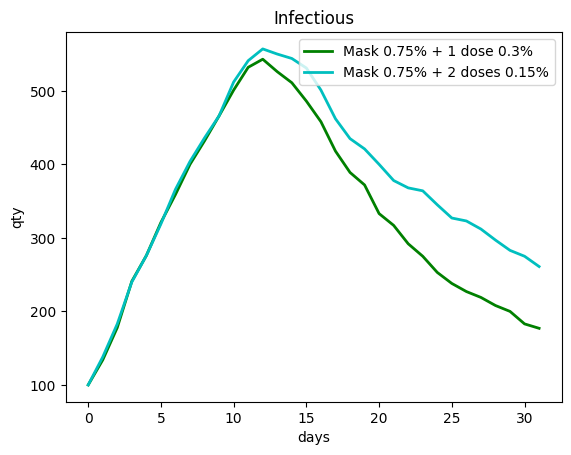

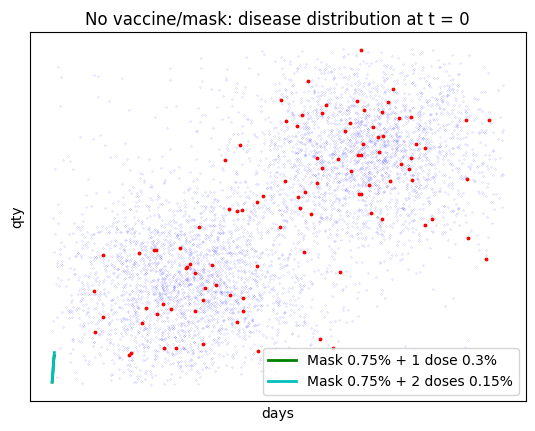

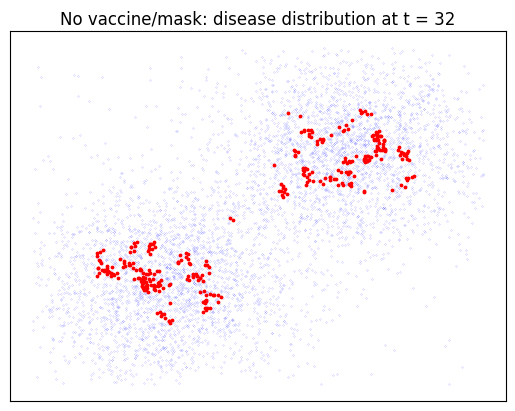

Time spent:  22.216910362243652 seconds
Time spent joining all neighbors:  5.665605068206787 seconds


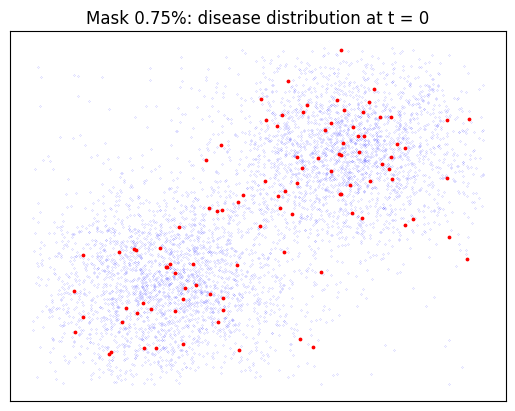

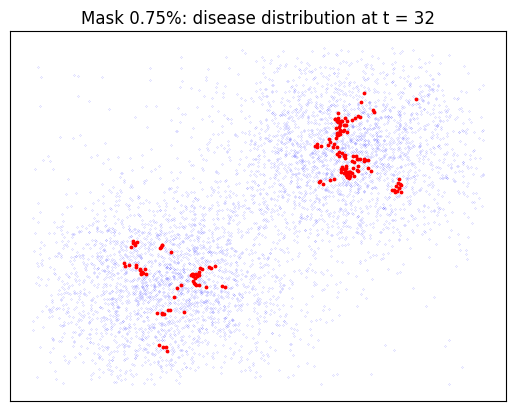

Time spent:  16.207940101623535 seconds
Time spent joining all neighbors:  5.416448593139648 seconds


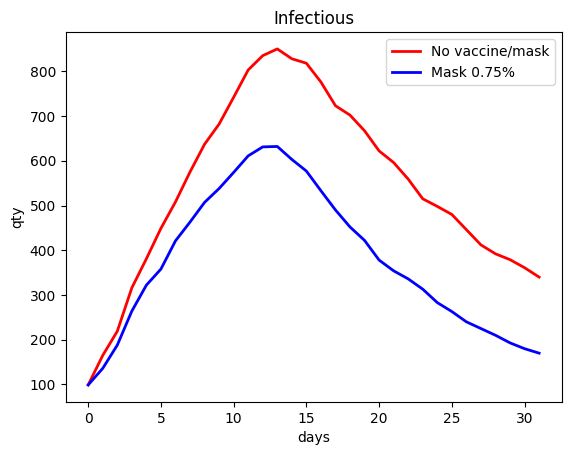

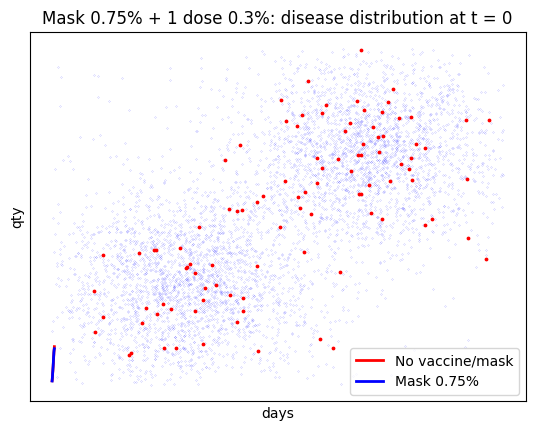

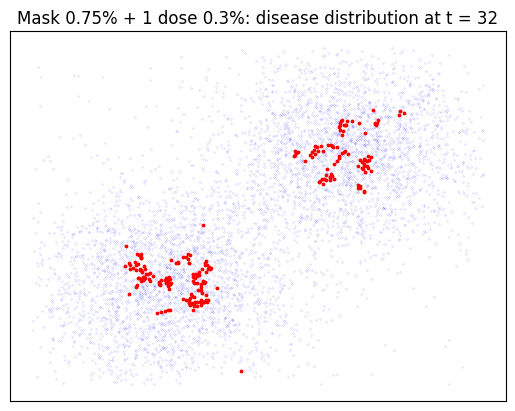

Time spent:  15.939272403717041 seconds
Time spent joining all neighbors:  6.153053522109985 seconds


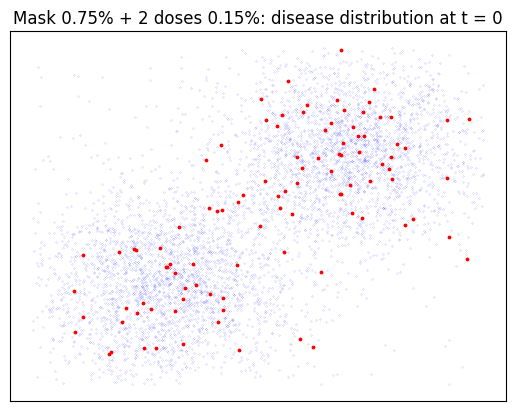

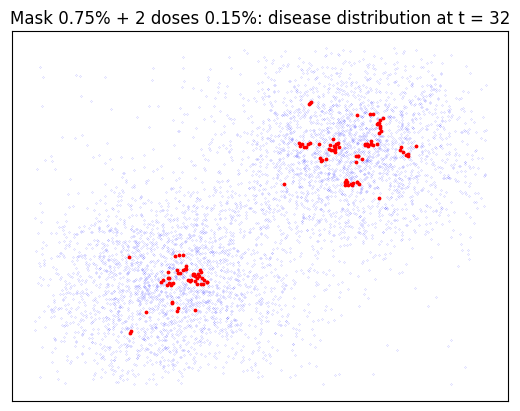

Time spent:  13.636052370071411 seconds
trial # 10
Time spent joining all neighbors:  5.4284913539886475 seconds


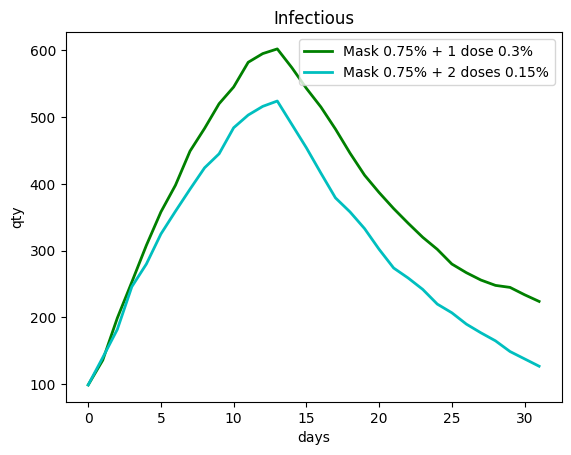

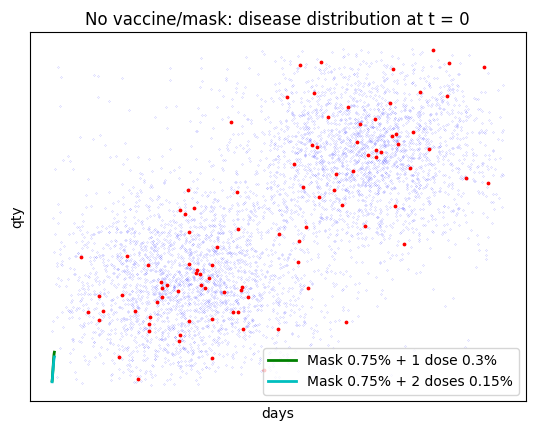

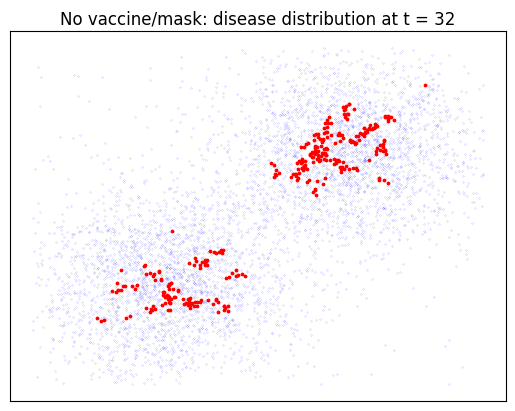

Time spent:  20.807464122772217 seconds
Time spent joining all neighbors:  5.3572070598602295 seconds


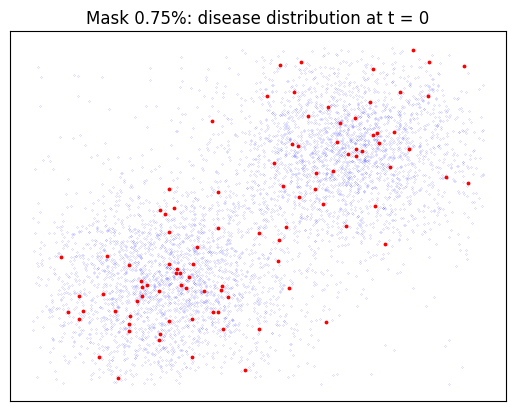

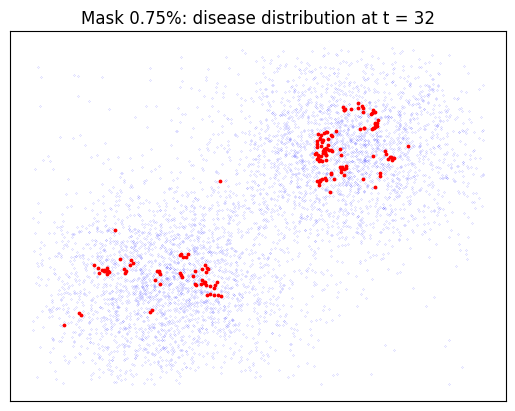

Time spent:  15.476943969726562 seconds
Time spent joining all neighbors:  5.683854103088379 seconds


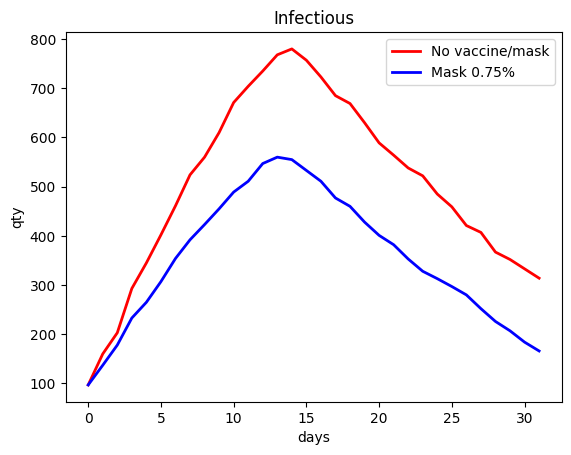

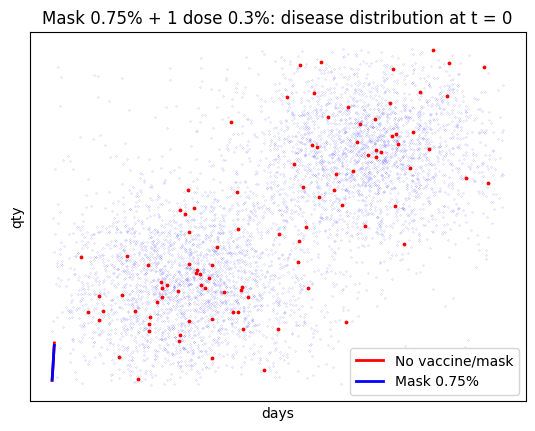

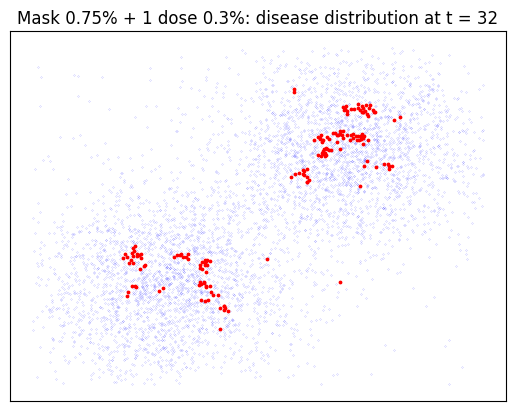

Time spent:  13.039260149002075 seconds
Time spent joining all neighbors:  5.468833923339844 seconds


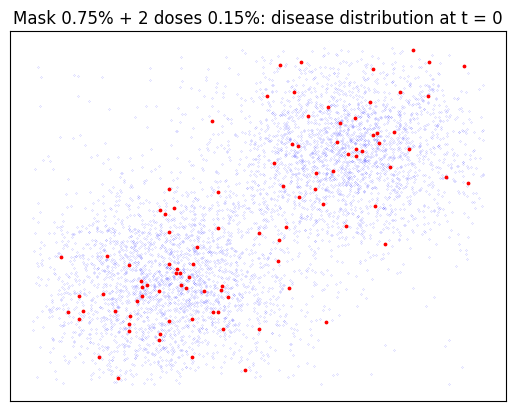

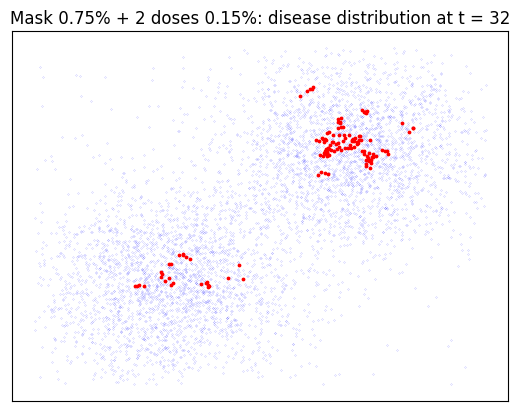

Time spent:  12.098249912261963 seconds
trial # 11
Time spent joining all neighbors:  6.216475486755371 seconds


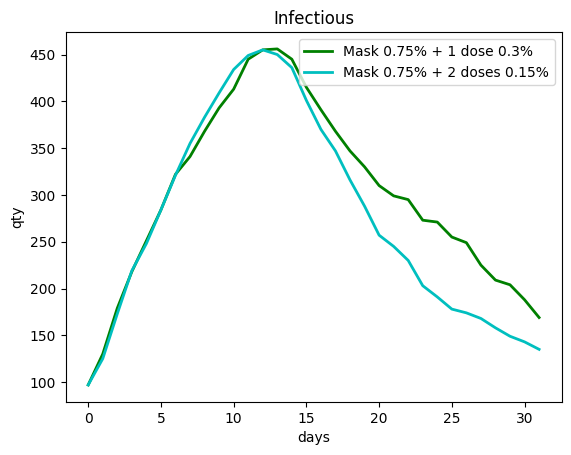

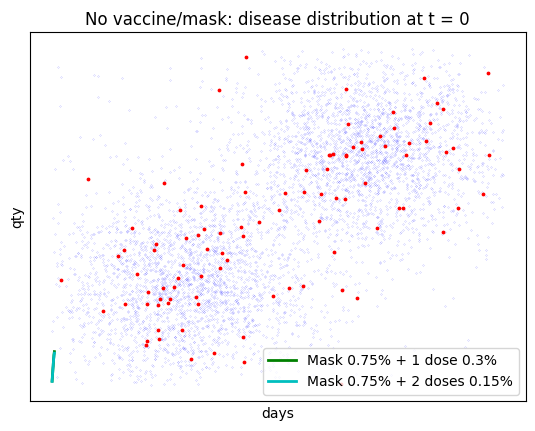

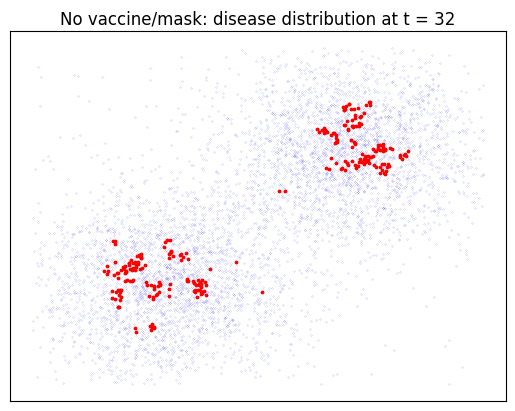

Time spent:  18.8049054145813 seconds
Time spent joining all neighbors:  6.219908237457275 seconds


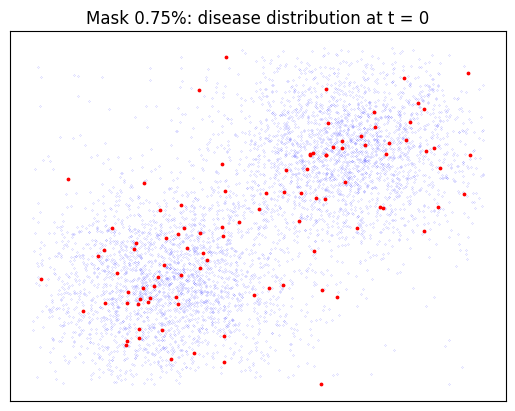

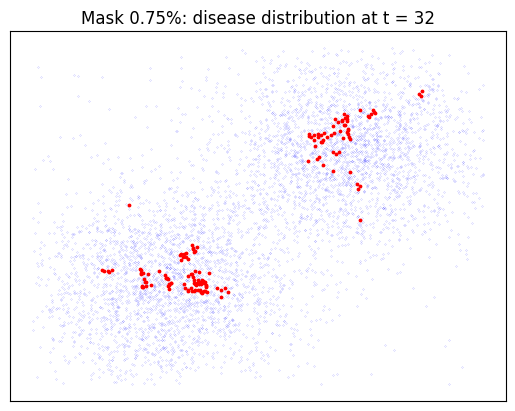

Time spent:  12.906601667404175 seconds
Time spent joining all neighbors:  5.376893043518066 seconds


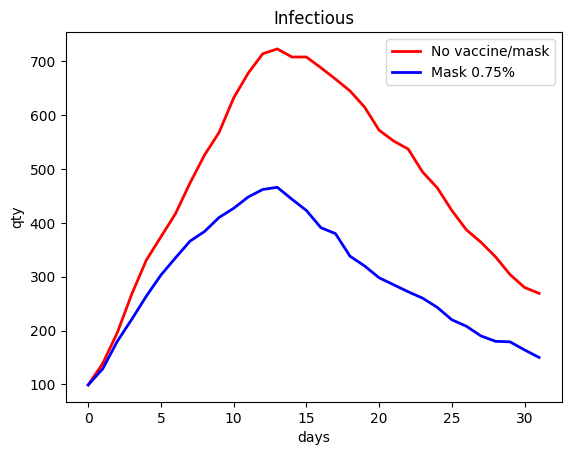

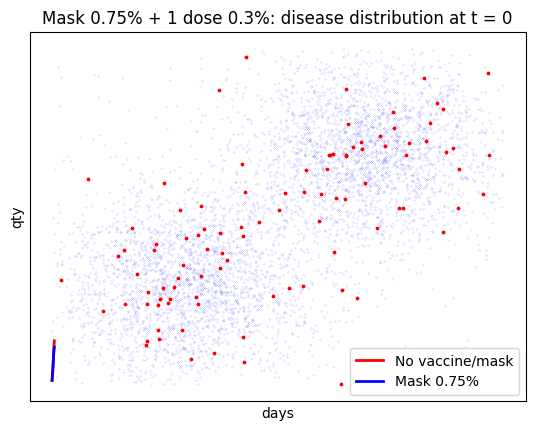

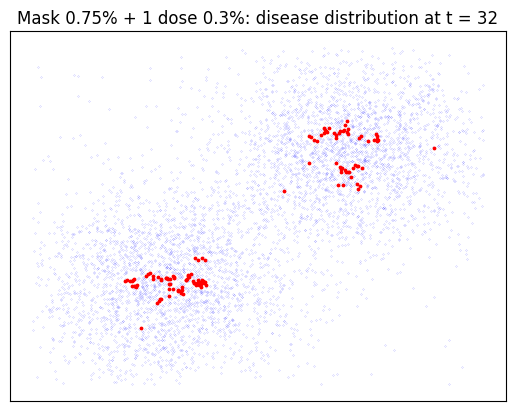

Time spent:  11.977822065353394 seconds
Time spent joining all neighbors:  5.884097576141357 seconds


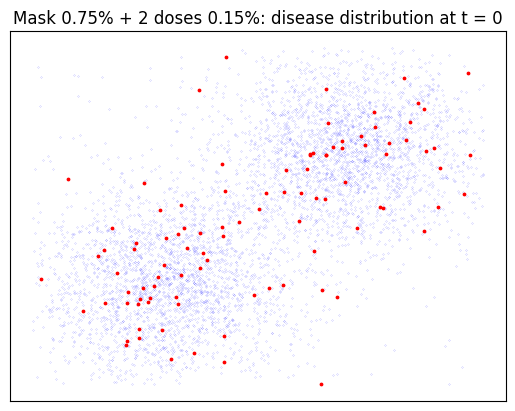

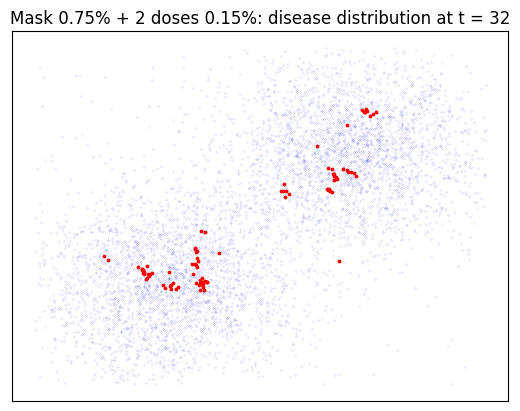

Time spent:  11.288898229598999 seconds
trial # 12
Time spent joining all neighbors:  6.15613579750061 seconds


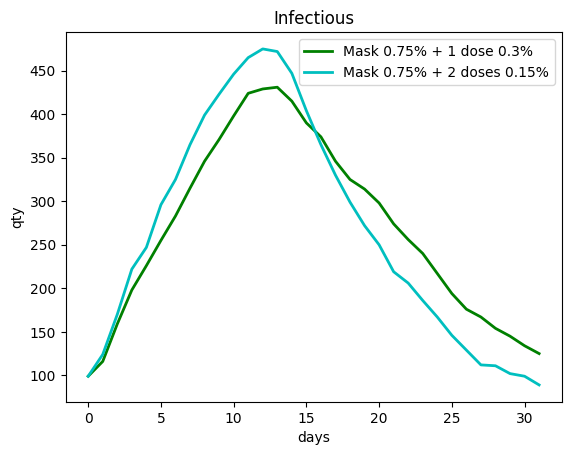

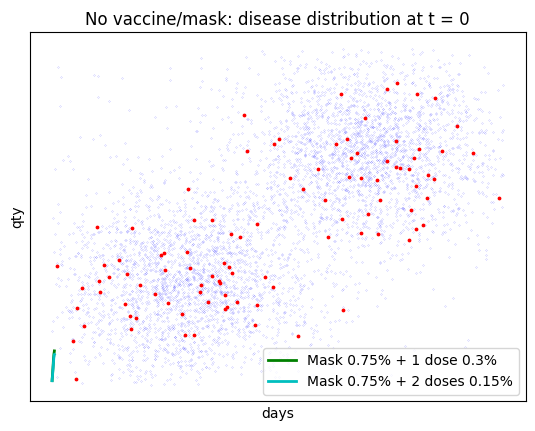

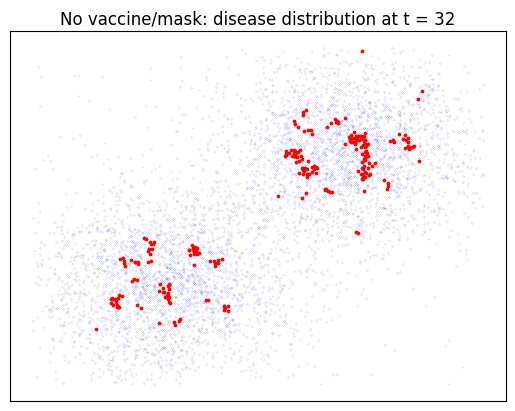

Time spent:  23.764423370361328 seconds
Time spent joining all neighbors:  5.526216268539429 seconds


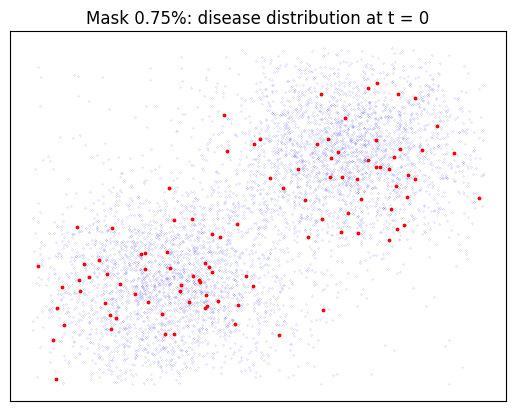

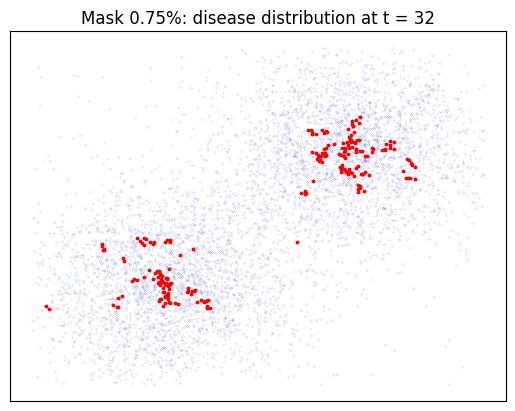

Time spent:  16.477988243103027 seconds
Time spent joining all neighbors:  6.100725889205933 seconds


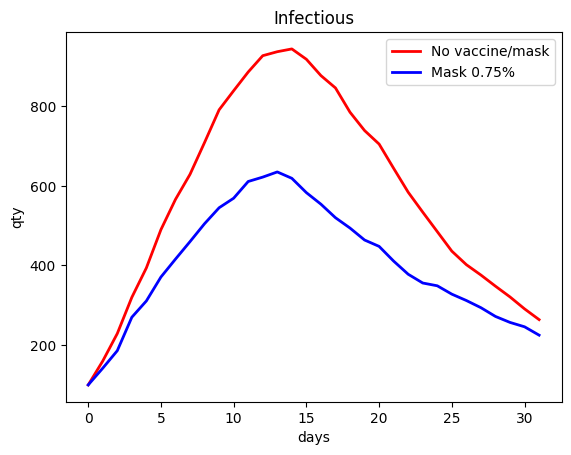

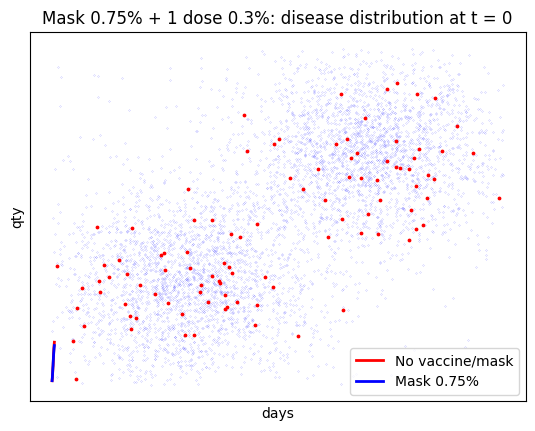

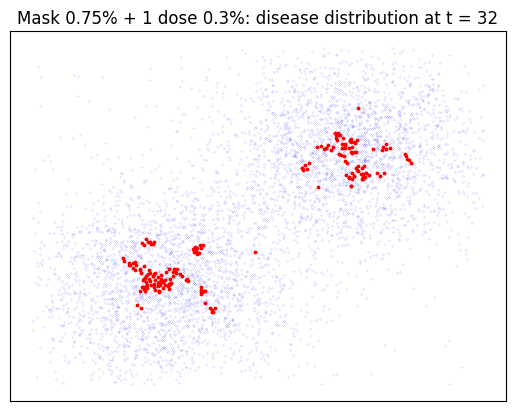

Time spent:  14.301214456558228 seconds
Time spent joining all neighbors:  5.503230571746826 seconds


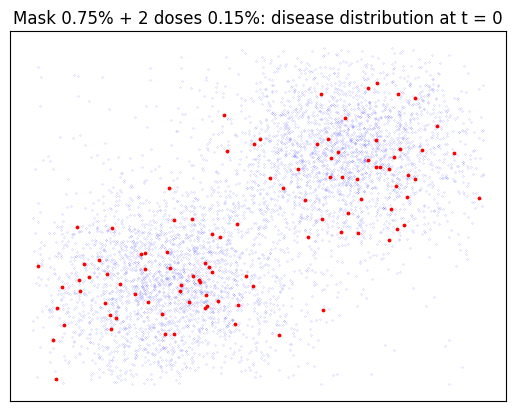

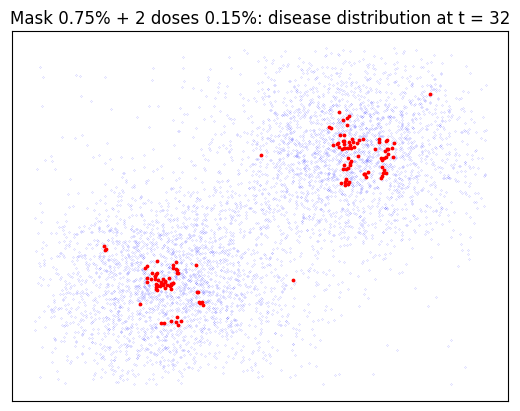

Time spent:  16.243401765823364 seconds
trial # 13
Time spent joining all neighbors:  5.528031587600708 seconds


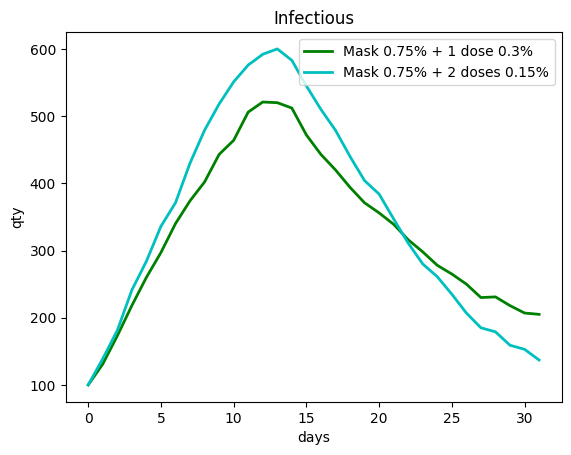

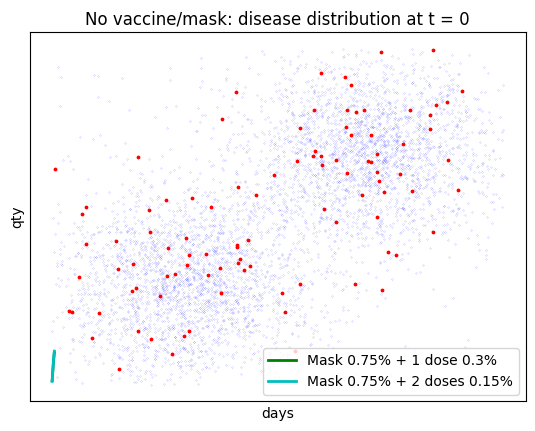

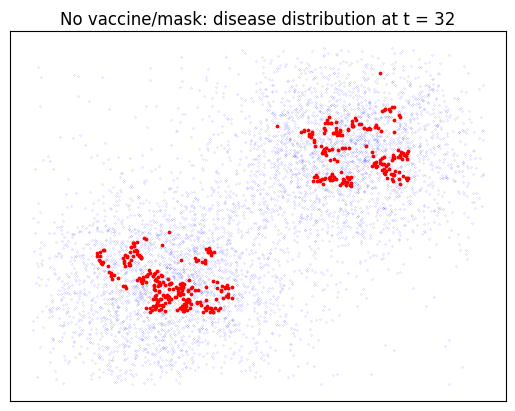

Time spent:  24.135639905929565 seconds
Time spent joining all neighbors:  5.4737372398376465 seconds


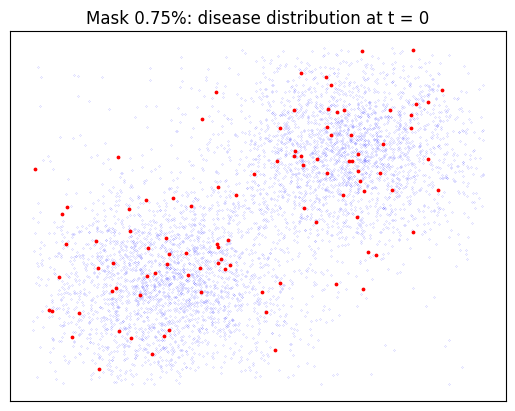

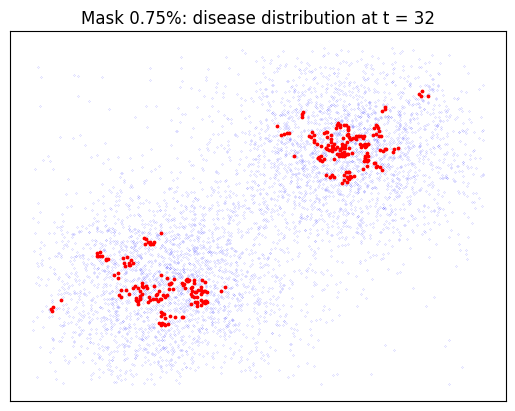

Time spent:  17.796173095703125 seconds
Time spent joining all neighbors:  5.453139543533325 seconds


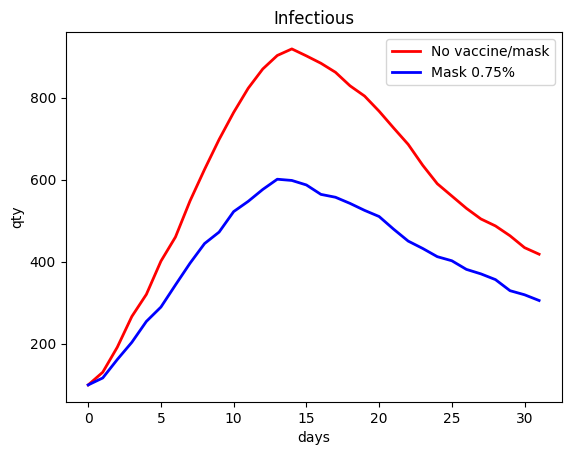

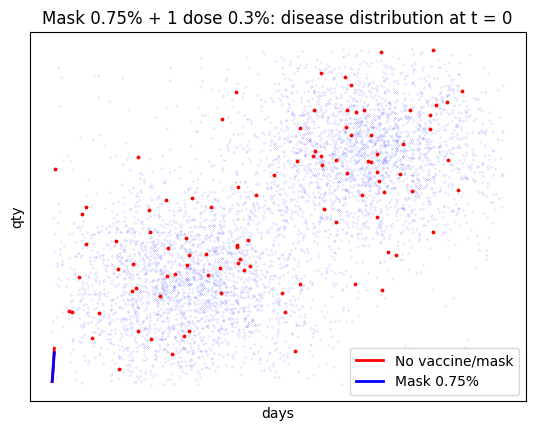

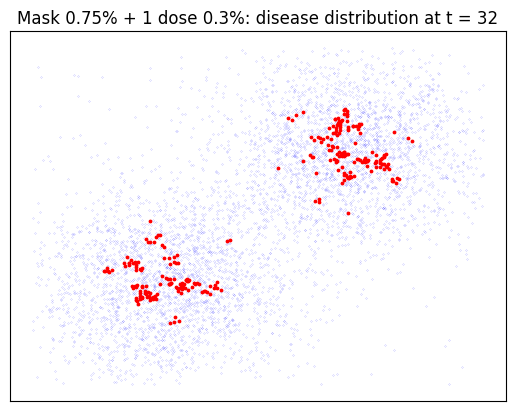

Time spent:  16.363449335098267 seconds
Time spent joining all neighbors:  6.163994073867798 seconds


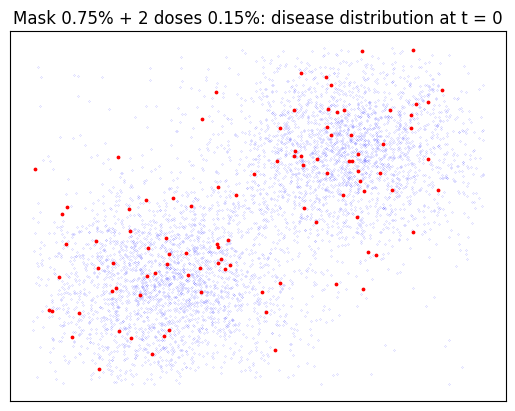

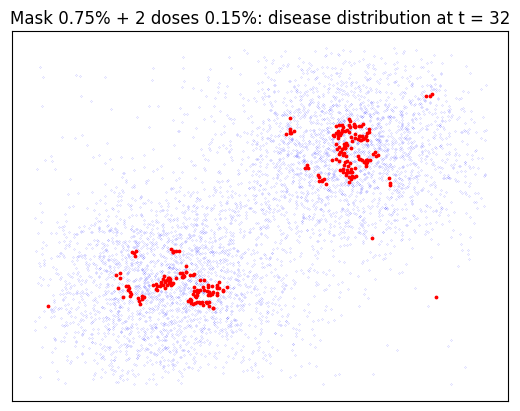

Time spent:  15.334352016448975 seconds
trial # 14
Time spent joining all neighbors:  5.735071182250977 seconds


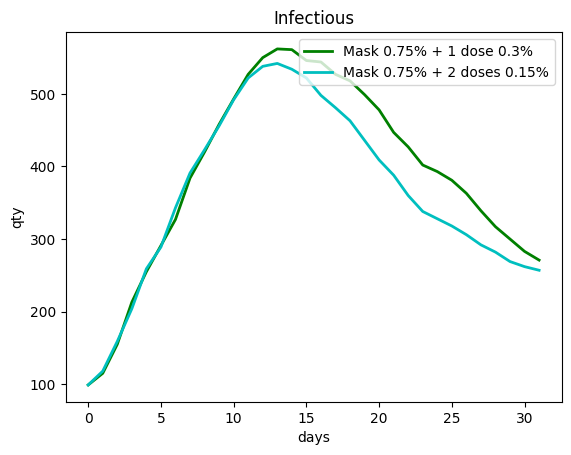

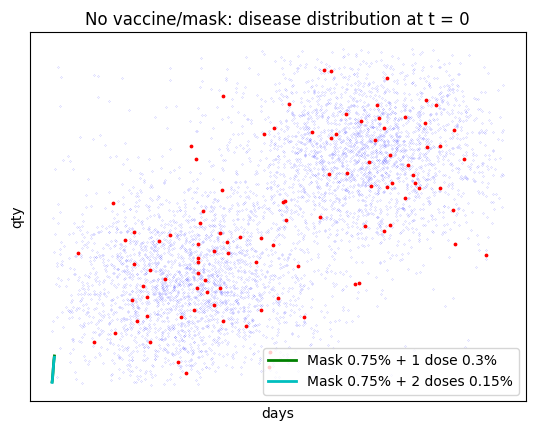

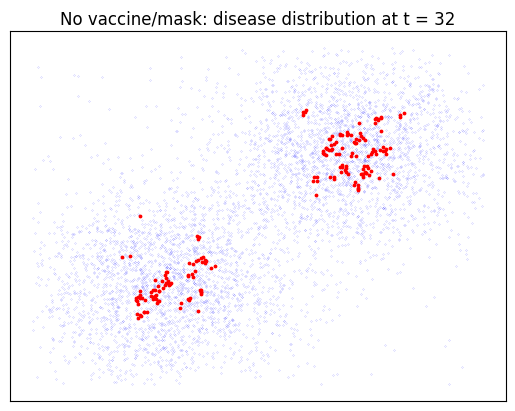

Time spent:  30.78438687324524 seconds
Time spent joining all neighbors:  5.375143051147461 seconds


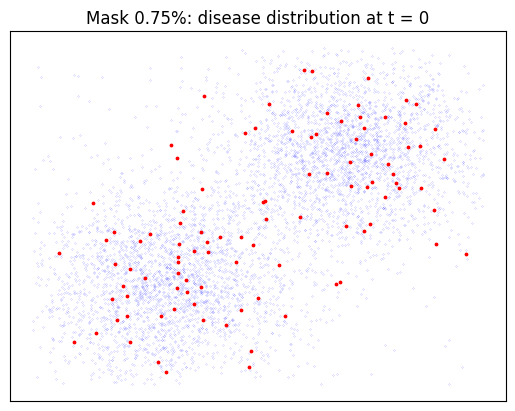

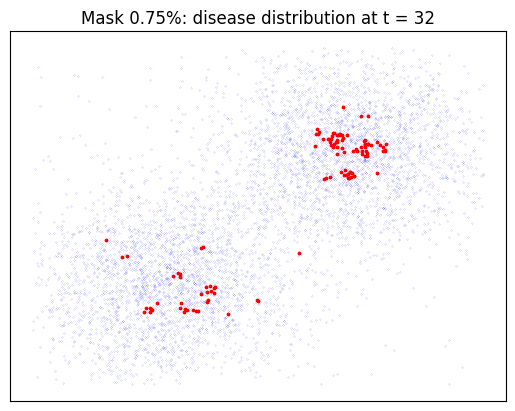

Time spent:  12.335777282714844 seconds
Time spent joining all neighbors:  6.036092758178711 seconds


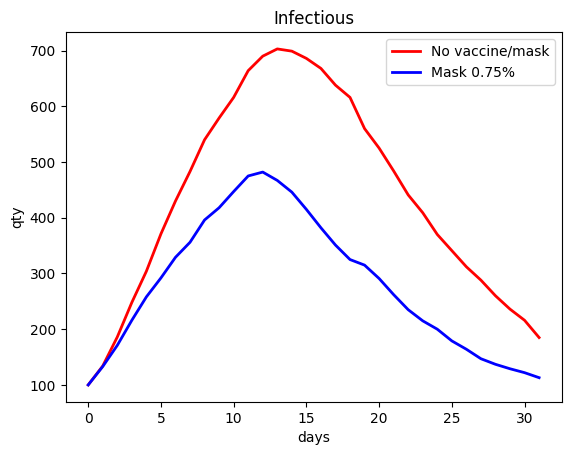

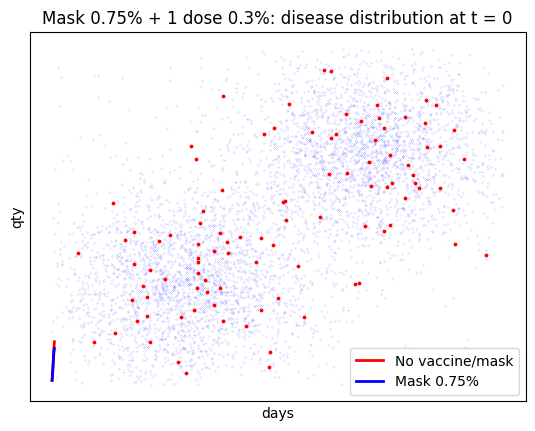

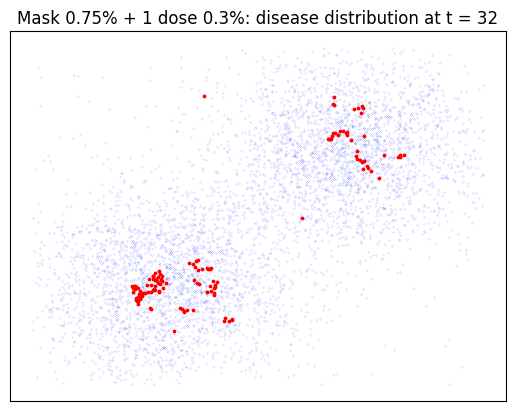

Time spent:  12.085858821868896 seconds
Time spent joining all neighbors:  5.60922646522522 seconds


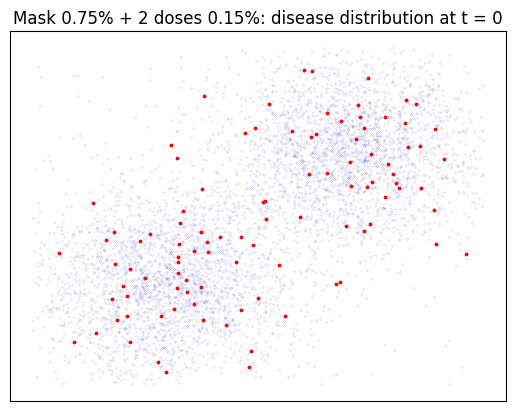

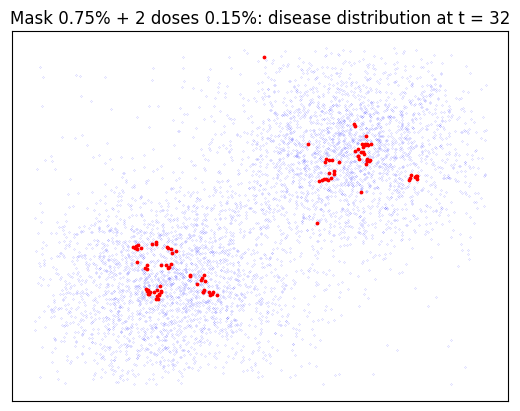

Time spent:  12.837648391723633 seconds
trial # 15
Time spent joining all neighbors:  5.4770989418029785 seconds


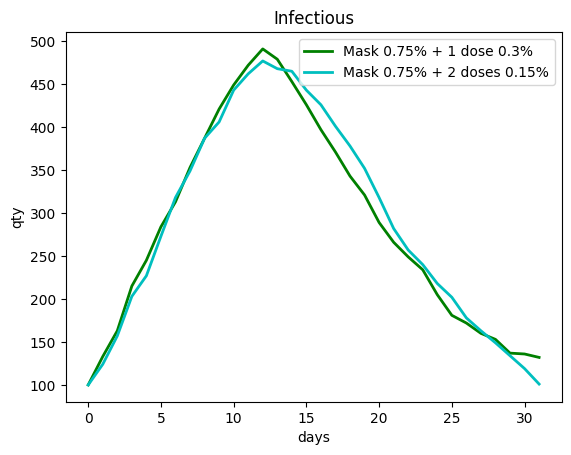

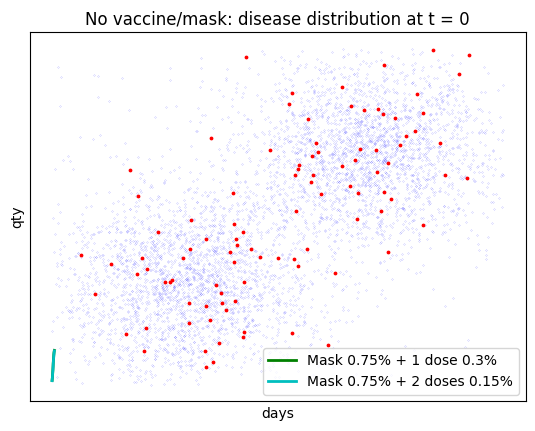

KeyboardInterrupt: 

In [12]:
# 100 trials to compare the infection number and the cumulative death number

results_unprotected_mask_ = []
results_ = []
for i in range(100):
    print('trial #', i)
    results_unprotected_mask_.append(run_unprotected_and_masked_only (seed = i, days=32, period=1, mask_ratio = 0.75, vaccine_ratio = 0.3, initial_infected = 100))
    results_.append(run_multiple_vaccination_only (seed = i, days=32, period=1, mask_ratio = 0.75, vaccine_ratio = 0.3, initial_infected = 100))


trial # 0
Time spent joining all neighbors:  9.981645345687866 seconds


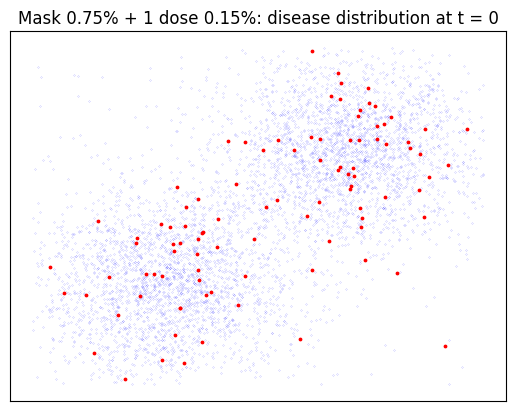

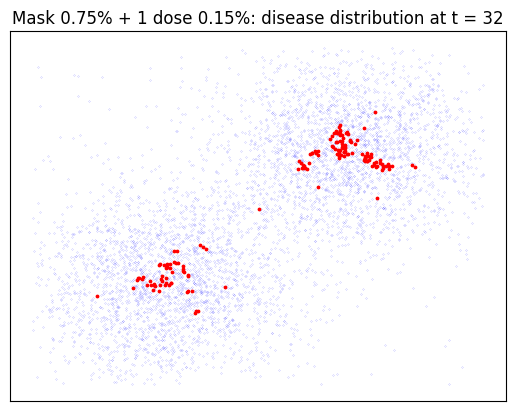

Time spent:  12.501646757125854 seconds
Time spent joining all neighbors:  5.330333471298218 seconds


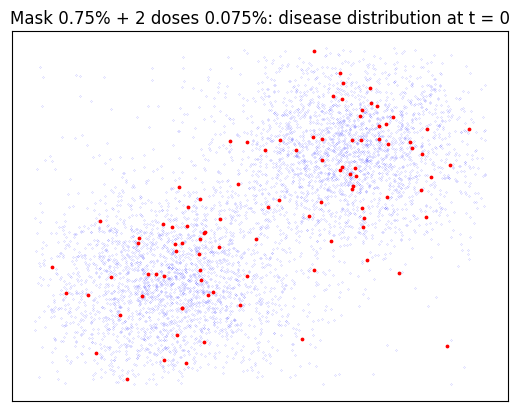

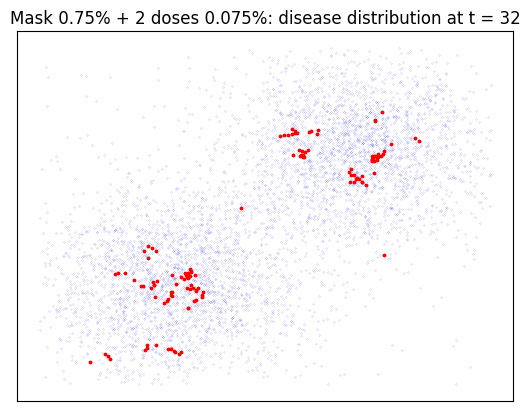

Time spent:  11.40207815170288 seconds
trial # 1
Time spent joining all neighbors:  6.110074758529663 seconds


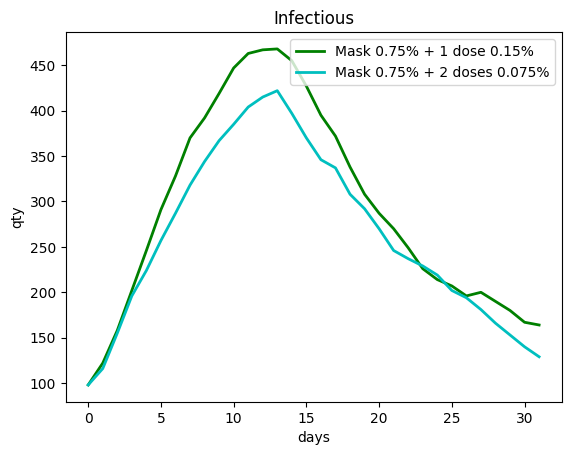

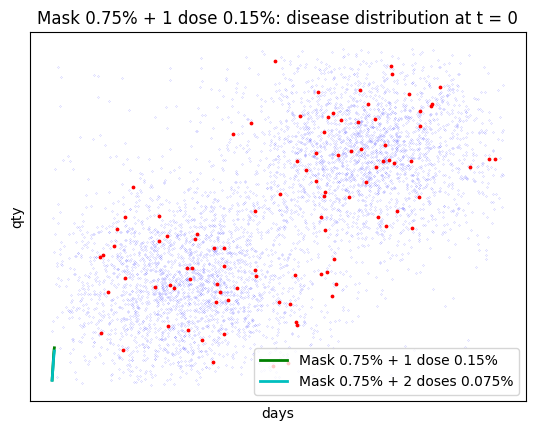

KeyboardInterrupt: 

In [13]:
# 30 more trials to compare the infection number and the cumulative death number of 1-dose and 2-doses only.

results__ = []
for i in range(30):
    print('trial #', i)
    results__.append(run_multiple_vaccination_only (seed = i, days=32, period=1, mask_ratio = 0.75, vaccine_ratio = 0.15, initial_infected = 100))


In [2]:
results_unprotected_mask = []
for i in range(30):
    results_unprotected_mask.append(run_unprotected_and_masked_only (seed = i, days=60, period=1, mask_ratio = 0.75, vaccine_ratio = 0.3, initial_infected = 100))



NameError: name 'run_unprotected_and_masked_only' is not defined

In [ ]:
results = []
for i in range(30):
    results.append(run_multiple_vaccination_only (seed = i, days=60, period=1, mask_ratio = 0.75, vaccine_ratio = 0.3, initial_infected = 100))



In [14]:
# this finds the difference between the strategy with 1-dose vs 2-doses:

infection_tally, death_tally = [], []
for i in range(30):
    infection_tally.append(results[i][0]['infected'][-1] - results[i][1]['infected'][-1])
    death_tally.append(results[i][0]['death'][-1] - results[i][1]['death'][-1])
print('infection_tally: ', infection_tally)
print('death_tally: ', death_tally)


NameError: name 'results' is not defined

In [ ]:
#  Here are the data collected from 100 trials, capturing the infection and death counts for 4 different strategies:
#
#  a. unprotected (base case)
#  b. masked
#  c. masked + vaccination with 1-dose
#  d. masked + vaccination with 2-doses

infection_tally_ = {'raw':[], 'masked': [], 'one':[], 'two':[]}
death_tally_ = {'raw':[], 'masked': [], 'one':[], 'two':[]}

for i in range(100):

    infection_tally_['one'].append(results_[i][0]['infected'][30])
    infection_tally_['two'].append(results_[i][1]['infected'][30])
    infection_tally_['raw'].append(results_unprotected_mask_[i][0]['infected'][30])
    infection_tally_['masked'].append(results_unprotected_mask_[i][1]['infected'][30])

    death_tally_['one'].append(results_[i][0]['death'][30])
    death_tally_['two'].append(results_[i][1]['death'][30])
    death_tally_['raw'].append(results_unprotected_mask_[i][0]['death'][30])
    death_tally_['masked'].append(results_unprotected_mask_[i][1]['death'][30])

for i in infection_tally_.keys():
    print("infection_tally['{}'] = {}\n".format(i, infection_tally_[i]))

for i in death_tally_.keys():
    print("death_tally['{}'] = {}\n".format(i, death_tally_[i]))


In [ ]:
#  Here are the data collected from 100 trials, capturing the infection and death counts for 4 different strategies:
#
#  a. unprotected (base case)
#  b. masked
#  c. masked + vaccination with 1-dose
#  d. masked + vaccination with 2-doses
#
#  This part is a rerun to assess how the size of initial vaccinated population would affect the effective of
#  vaccination with 1 dose vs 2 doses.
#

infection_tally__ = {'raw':[], 'masked': [], 'one':[], 'two':[]}
death_tally__ = {'raw':[], 'masked': [], 'one':[], 'two':[]}

for i in range(100):

    infection_tally__['one'].append(results__[i][0]['infected'][30])
    infection_tally__['two'].append(results__[i][1]['infected'][30])
#     infection_tally__['raw'].append(results_unprotected_mask__[i][0]['infected'][30])
#     infection_tally__['masked'].append(results_unprotected_mask__[i][1]['infected'][30])

    death_tally__['one'].append(results__[i][0]['death'][30])
    death_tally__['two'].append(results__[i][1]['death'][30])
#     death_tally__['raw'].append(results_unprotected_mask__[i][0]['death'][30])
#     death_tally__['masked'].append(results_unprotected_mask__[i][1]['death'][30])

for i in infection_tally__.keys():
    print("infection_tally['{}'] = {}\n".format(i, infection_tally__[i]))

for i in death_tally__.keys():
    print("death_tally['{}'] = {}\n".format(i, death_tally__[i]))

In [ ]:
# calcuating the paired CI statistics as introducted in Module 10. The results of z-test and t-test
# would be very close when the number of sample is high.

import pandas as pd
from scipy import stats

sampleA = ['raw','raw','raw','masked','masked','one']
sampleB = ['masked','one','two','one','two','two']
meanA, meanB, t_statistics, p_value, reject_null = [],[],[],[],[]

for i in range(len(sampleA)):
    t_statistic_, p_value_ = stats.ttest_rel(infection_tally[sampleA[i]], infection_tally[sampleB[i]])
    t_statistics.append(t_statistic_)
    p_value.append(p_value_)
    reject_null.append(p_value_ < 0.05)
    meanA.append(sum(infection_tally[sampleA[i]])/len(infection_tally[sampleA[i]]))
    meanB.append(sum(infection_tally[sampleB[i]])/len(infection_tally[sampleB[i]]))

df_infection = pd.DataFrame({'strategy_A': sampleA, 'strategy_B': sampleB, 'mean_A':meanA, 'mean_B':meanB,
                    't_statistics':t_statistics, 'p_value':p_value, 'reject_null':reject_null})

# ---------------------------------------------------------------------------------------------------------------
#

meanA, meanB, t_statistics, p_value, reject_null = [],[],[],[],[]

for i in range(len(sampleA)):
    t_statistic_, p_value_ = stats.ttest_rel(death_tally[sampleA[i]], death_tally[sampleB[i]])
    t_statistics.append(t_statistic_)
    p_value.append(p_value_)
    reject_null.append(p_value_ < 0.05)
    meanA.append(sum(death_tally[sampleA[i]])/len(death_tally[sampleA[i]]))
    meanB.append(sum(death_tally[sampleB[i]])/len(death_tally[sampleB[i]]))



display(df_infection)


df_death = pd.DataFrame({'strategy_A': sampleA, 'strategy_B': sampleB, 'mean_A':meanA, 'mean_B':meanB,
                    't_statistics':t_statistics, 'p_value':p_value, 'reject_null':reject_null})

display(df_death)

In [ ]:
plt.hist(infection_tally, bins=9, color='lightgray', edgecolor='black')
plt.xlabel('Differences')
plt.ylabel('Frequency')
plt.title('Difference of Total Infection After 60 Days (1-dose - 2-doses)')
plt.show()

plt.hist(death_tally, bins=9, color='lightblue', edgecolor='black')
plt.xlabel('Differences')
plt.ylabel('Frequency')
plt.title('Difference of Total Death After 60 Days (1-dose - 2-doses)')
plt.show()